## FIGURE: identification results
We are going to use this notebook to create a figure about different cases of identification.
Columns will be: some afm images, the ground truth, the prediction in green or red if it is correct or incorrect and the tanimoto of the prediction. 
We can make two figures, one with several cases of success and other with several of mistakes. 

The mistakes will be: a molecule with switched radicals, a molecule where structure repeats and a molecule where the prediction simply fails. 

In [1]:
def load_exp_img_stack(path, dimensions=[224,224], zoom=1):
    '''Obtains stack of experimental images from folder path and preprocess 
        it so we can directly feed it to our CNN

        INPUT: path of the folder containing the AFM images of the molecule

        OUTPUT: list of PIL images'''
    path_list = sorted(glob.glob(os.path.join(path,'*')))
    im_list = list()
    for im_path in path_list:
        
        im_list.append(Image.open(im_path).resize(dimensions, resample=Image.Resampling.BILINEAR).convert('L'))
        
    # Default parameters
        degrees = 0
        h_shift = 0
        v_shift = 0
        shear = 0

        
    for i in range(len(im_list)):
        im_list[i] = TF.affine(im_list[i], degrees, [h_shift, v_shift], zoom, shear,
                                interpolation=transforms.InterpolationMode.BILINEAR,
                                fill=im_list[i].getpixel((5, 5))
                                )

    to_tensor = transforms.ToTensor()

    tensor_stack = [to_tensor(im) for im in im_list.copy()]
    tensor_stack = torch.cat(tensor_stack)

    #normalize = transforms.Normalize(
    #    mean=[0.1321, 0.1487, 0.1689, 0.1983, 0.2229, 0.2591, 0.3430, 0.4580, 0.5787, 0.6887],
    #    std=[0.0853, 0.0853, 0.0883, 0.0942, 0.0969, 0.1066, 0.1419, 0.1840, 0.2144, 0.2215]) #this is for K-1



    normalize = transforms.Normalize(
        mean=[0.2855, 0.3973, 0.4424, 0.4134, 0.6759, 1.0664, 0.9904, 0.7708, 0.5748, 0.4055],
        std=[1.1341, 1.2528, 1.3125, 1.3561, 1.5844, 1.7763, 1.5447, 1.2683, 1.0588, 0.9308]) # for all K folders
    
    tensor_stack = normalize(tensor_stack)

    return tensor_stack

def load_jmol_image(cid, dimension=[224,224], zoom=1):
    if USER=='manuel':
        path = f'/home/{USER}/QUAM-AFM/QUAM/JMOL_IMAGES/{cid}/{cid}.png' ##Mustang
    else:
        path = f'/scratch/dataset/quam/JMOL_IMAGES/{cid}/{cid}.png' ##Rocinante
    jmol_image = Image.open(path)
     # Resize image to desired dimensions
    jmol_image = jmol_image.resize(dimension, resample=Image.Resampling.BILINEAR)
    
    
    # Apply zoom by cropping
    width, height = jmol_image.size
    left = width * ((1 - zoom) / 2)
    top = height * ((1 - zoom) / 2)
    right = width * ((1 + zoom) / 2)
    bottom = height * ((1 + zoom) / 2)
    jmol_image = jmol_image.crop((left, top, right, bottom))
    
    # Resize image to desired dimensions
    jmol_image = jmol_image.resize(dimension, resample=Image.Resampling.BILINEAR)
    
    # Convert to numpy array
    jmol_image_array = np.array(jmol_image)
    
    return jmol_image_array

def _extract_cid(path):
    return int(path.split('_')[-3])

def run_prediction(molec_path, dimension=[224,224], zoom=1, verbose=False, zoom_jmol = None):
    img_stack = load_img_stack(molec_path, zoom=zoom)
    true_CID = _extract_cid(molec_path)

    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)


    pred_CID = _extract_cid(output_df.iloc[0]['path'])
    tanimoto = output_df.iloc[0]['tanimoto']
    if zoom_jmol is not None:
        gt_jmol = load_jmol_image(true_CID, dimension=dimension, zoom=zoom_jmol)
        pred_jmol = load_jmol_image(pred_CID, dimension=dimension, zoom=zoom_jmol)
    else:
        gt_jmol = load_jmol_image(true_CID, dimension=dimension, zoom=zoom)
        pred_jmol = load_jmol_image(pred_CID, dimension=dimension, zoom=zoom)
    
    if verbose:
        print('Total number of fingerprints', np.sum(fp_pred))
        print('Is the correct CID in the top k candidates?',  true_CID in list(output_df['CID']))
        print('Is the correct CID the first candidate?',  true_CID == output_df['CID'].iloc[0])
        print(tanimoto)
    
    return img_stack[1], img_stack[3], img_stack[5], gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto

def plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto):
    fig, ax = plt.subplots(1, 5, figsize=(20, 4))

    ax[0].imshow(img_1, cmap='gray')
    ax[0].axis('off')
    ax[1].imshow(img_3, cmap='gray')
    ax[1].axis('off')
    ax[2].imshow(img_5, cmap='gray')
    ax[2].axis('off')
    ax[3].imshow(gt_jmol)
    ax[3].axis('off')
    ax[4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[4].add_patch(rect)
    ax[4].set_xticks([])
    ax[4].set_yticks([])
    ax[4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=20)

    plt.tight_layout()
    plt.show()

In [2]:
# IMPORTS
# torch packages
import torch
import torchvision
import torch.nn as nn
import torch.backends.cudnn as cudnn
import torch.utils.data as data
from torch import optim
from torchvision import datasets, transforms, models
from torchvision.models import resnet50, ResNet50_Weights, efficientnet_b0, EfficientNet_B0_Weights
import torchvision.transforms.functional as TF

from torchmetrics import MetricCollection
from torchmetrics.classification import MultilabelRecall, MultilabelPrecision, MultilabelF1Score

import torch.nn.functional as F
from torch.utils.data import Dataset

print('PyTorch version:', torch.__version__)

# additional packages
from PIL import Image
from scipy.interpolate import RegularGridInterpolator
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import rdkit.Chem.AllChem as AllChem
import random
import argparse
import os
import time
import glob
from tqdm import tqdm
import scipy
import seaborn as sns
import pickle
#import rdkit.Chem.AllChem as AllChem
import rdkit.Chem as Chem
import sys
USER = os.getenv('USER')
sys.path.append(f'/home/{USER}/CODE/Pytorch-fingerprints/')

# custom functions
from utils.all_utils import train_test_split, compute_pos_weights, save_config, train_for_epoch, validate, \
                            balance_beta_pos_weights, tanimoto_torch, validate_tanimoto

from utils.models import ResNet3D, resnet_10_chan, effnet_10_chan, eff_net_bias_warmer, resnet_bias_warmer 

from utils.dataloader import QUAM_with_noise, parse_val_ks

from utils.screening import fp_screening_function, load_img_stack, predict_fp, tanimoto_numpy



print('Packages loaded')


class configuration:
    def __init__(self):
        # EXPERIMENT PARAMETERS
        self.experiment_name = 'exp_imgs'
        self.n_fp = 1024  # number of fingerprints
        self.output_size = 9
        self.ratio = 0.95  # train/test ratio
        self.seed = 42

        # TRAINING PARAMETERS

        self.lr = 0.001  # learning rate
        self.dropout = 0.5 # Dropout2d probability
        # self.momentum = 0.9  # momentum of SGD optimizer
        self.weight_decay = 0  # L2 regularization constant
        self.batch_size = 50  # Training batch size
        self.test_batch_size = 50  # Test batch size
        self.epochs = 150  # Number of epochs
        self.bias_warmer = True # setting appropiate bias
        self.pos_weight_balancer = True #for bigger fingerprints, it helps balance precision and recall
        self.pos_weight_beta = 10
        # DATA AUGMENTATION PARAMETERS

        # Rotation
        self.rot_prob = 0.5  # prob of rotation in data augmentation
        self.max_deg = 180  # maximum degrees of rotation in data augmentation

        # Zoom
        self.zoom_prob = 0.3  # prob of applying zoom
        self.max_zoom = 0.3  # maximum zooming in/out

        # Translation
        self.shift_prob = 0.3  # probability of vertical or/and horizontal translation
        self.max_shift = 20  # translation

        # Shear
        self.shear_prob = 0.3  # probability of shearing
        self.max_shear = 10  # maximum shearing angle

## Create arguments object
args = configuration()
# Print experiment name
print('Experiment name:', args.experiment_name)


# make sure to enable GPU acceleration!
print(f'available devices: {torch.cuda.device_count()}')
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
#torch.cuda.device(0)
#device = torch.device('cpu')
#print(device, torch.cuda.get_device_name(0))

# Set random seed for reproducibility
torch.backends.cudnn.deterministic = True  # fix the GPU to deterministic mode
torch.manual_seed(args.seed)  # CPU seed
torch.cuda.manual_seed_all(args.seed)  # GPU seed
random.seed(args.seed)  # python seed for image transformation
np.random.seed(args.seed)

PyTorch version: 1.12.1
Packages loaded
Experiment name: exp_imgs
available devices: 0


In [3]:
# FOR GPU

# model and metrics initialization

# model = ResNet3D(output_size=args.n_fp)
model = effnet_10_chan(output_size=args.n_fp, dropout=args.dropout)


models_path = f'/home/{USER}/CODE/Pytorch-fingerprints/experiments/300k_1024_all_ks_dropout_0_5/models'
checkpoint = torch.load(os.path.join(models_path, 'checkpoint_5_virtual_epoch_7.pth'))

model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)
model.eval()

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(10, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): Dropout2d(p=0.5, inplace=False)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivation(
            (0): Conv2d(32, 16, kernel_siz

In [4]:
# FOR CPU
# model and metrics initialization

# model = ResNet3D(output_size=args.n_fp)
model = effnet_10_chan(output_size=args.n_fp, dropout=args.dropout)


models_path = f'/home/{USER}/CODE/Pytorch-fingerprints/experiments/300k_1024_all_ks_dropout_0_5/models'
checkpoint = torch.load(os.path.join(models_path, 'checkpoint_5_virtual_epoch_7.pth'), map_location=torch.device('cpu'))

model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)
model.eval()

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(10, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): Dropout2d(p=0.5, inplace=False)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivation(
            (0): Conv2d(32, 16, kernel_siz

In [5]:
# Load data
data_path = f'/home/{USER}/QUAM-AFM/datasets/285k_train_15k_fp_and_atom_counts_w_H.gz'
dataset_df = pd.read_pickle(data_path)

test_df = dataset_df[dataset_df['split'] == 'test']
test_df = parse_val_ks(test_df)

#testset = QUAM_with_noise(args, test_df.dropna(), mode='test') #dropna for the experimental molecule
#test_loader = torch.utils.data.DataLoader(testset, batch_size=50, shuffle=False, num_workers=1,
#                                          pin_memory=True)



In [5]:
# let's try it out

MOLECULE_INDEX = 40000  #34 es buen ejemplo de no acertar al 100% pero aún así adivinar la molécula
molec_path = test_df.iloc[MOLECULE_INDEX]['path']
true_CID = test_df.iloc[MOLECULE_INDEX]['CID']
print(molec_path)
print(true_CID)
query = test_df.iloc[MOLECULE_INDEX]['morgan_fp'] 

true_output_df = fp_screening_function(query, test_df, int_type=np.int8)
true_output_df

/scratch/dataset/quam/K-4/Conformer3D_CID_129794916_K040_Amp100
129794916


,path,CID,SMILES,morgan_fp,split,corrugation,tanimoto
82711,/scratch/dataset/quam/K-4/Conformer3D_CID_1297...,129794916,C1=C2C(=CSN2)NN1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0423,1.000000
37750,/scratch/dataset/quam/K-2/Conformer3D_CID_1353...,135348237,C1=C2C(=CSN2)NS1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0005,0.550000
37741,/scratch/dataset/quam/K-2/Conformer3D_CID_1353...,135348118,C1=C2C(=CSN2)NO1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0006,0.392857
178773,/scratch/dataset/quam/K-8/Conformer3D_CID_1297...,129795194,COC1=C2C(=CNN2)NS1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,1.2170,0.333333
178329,/scratch/dataset/quam/K-8/Conformer3D_CID_1297...,129766779,C1=CC=C2C(=CNN2)C=C1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0807,0.290323
...,...,...,...,...,...,...,...
522937,/scratch/dataset/quam/K-22/Conformer3D_CID_540...,54056082,CC=NNC(=O)N=N,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0008,0.000000
232651,/scratch/dataset/quam/K-10/Conformer3D_CID_880...,88025817,CC=C(NC=O)NC=O,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0005,0.000000
232666,/scratch/dataset/quam/K-10/Conformer3D_CID_881...,88150810,CCCCC(=O)NOC(=O)CC#N,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0441,0.000000
300566,/scratch/dataset/quam/K-13/Conformer3D_CID_167...,16742,C(=C(Cl)Cl)(C(=O)O)Cl,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.9716,0.000000


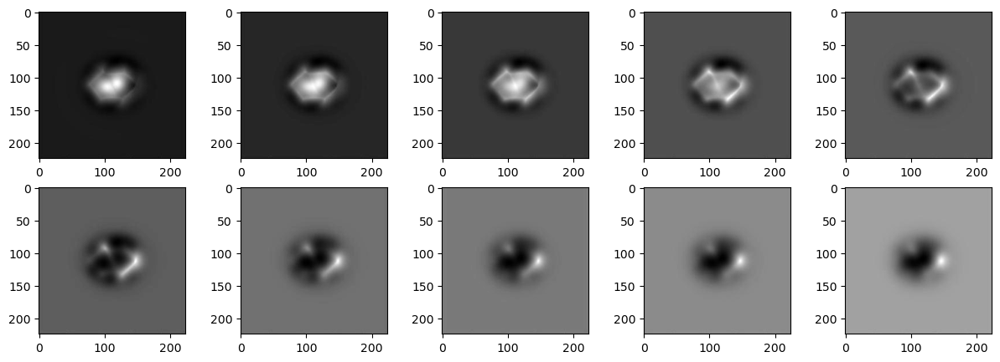

In [6]:
img_stack = load_img_stack(molec_path)
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(img_stack[0], cmap = 'gray')
axarr[0,1].imshow(img_stack[1], cmap = 'gray')
axarr[0,2].imshow(img_stack[2], cmap = 'gray')
axarr[0,3].imshow(img_stack[3], cmap = 'gray')
axarr[0,4].imshow(img_stack[4], cmap = 'gray')
axarr[1,0].imshow(img_stack[5], cmap = 'gray')
axarr[1,1].imshow(img_stack[6], cmap = 'gray')
axarr[1,2].imshow(img_stack[7], cmap = 'gray')
axarr[1,3].imshow(img_stack[8], cmap = 'gray')
axarr[1,4].imshow(img_stack[9], cmap = 'gray')

In [7]:
fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)
print('Total number of fingerprints', np.sum(fp_pred))

output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)

print('Is the correct CID in the top k candidates?',  true_CID in list(output_df['CID']))
print('Is the correct CID the first candidate?',  true_CID == output_df['CID'].iloc[0])
output_df

Total number of fingerprints 18
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True


,path,CID,SMILES,morgan_fp,split,corrugation,tanimoto
82711,/scratch/dataset/quam/K-4/Conformer3D_CID_1297...,129794916,C1=C2C(=CSN2)NN1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0423,0.321429
37750,/scratch/dataset/quam/K-2/Conformer3D_CID_1353...,135348237,C1=C2C(=CSN2)NS1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0005,0.304348
37741,/scratch/dataset/quam/K-2/Conformer3D_CID_1353...,135348118,C1=C2C(=CSN2)NO1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0006,0.266667
104398,/scratch/dataset/quam/K-5/Conformer3D_CID_1297...,129788336,CC1=CSSN1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0008,0.259259
104427,/scratch/dataset/quam/K-5/Conformer3D_CID_1298...,129823121,C#CC1=CSSN1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0013,0.233333


In [13]:

jmol_image = load_jmol_image(cid=3160975, dimension=[224,224])
jmol_image

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

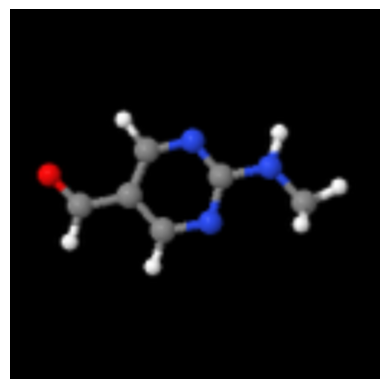

In [14]:


# Usage:
jmol_image_array = load_jmol_image(cid=3160975, dimension=[1024,1024], zoom=0.5)


plt.imshow(jmol_image_array)
plt.axis('off')
plt.show()


In [15]:


img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=1)


In [7]:

def plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto):
    fig, ax = plt.subplots(1, 5, figsize=(20, 4))

    ax[0].imshow(img_1, cmap='gray')
    ax[0].axis('off')
    ax[1].imshow(img_3, cmap='gray')
    ax[1].axis('off')
    ax[2].imshow(img_5, cmap='gray')
    ax[2].axis('off')
    ax[3].imshow(gt_jmol)
    ax[3].axis('off')
    ax[4].imshow(pred_jmol)
    ax[4].axis('on')
    ax[4].set_xticks([])
    ax[4].set_yticks([])

    if true_CID == pred_CID:
        color = 'green'
    else:
        color = 'red'

    # Create a Rectangle patch
    rect = patches.Rectangle((0,0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=2, edgecolor=color, facecolor='none')

    # Add the patch to the Axes
    ax[4].add_patch(rect)
    
    ax[4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=14)

    plt.tight_layout()
    plt.show()

# To call the function:
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=1)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)


NameError: name 'molec_path' is not defined

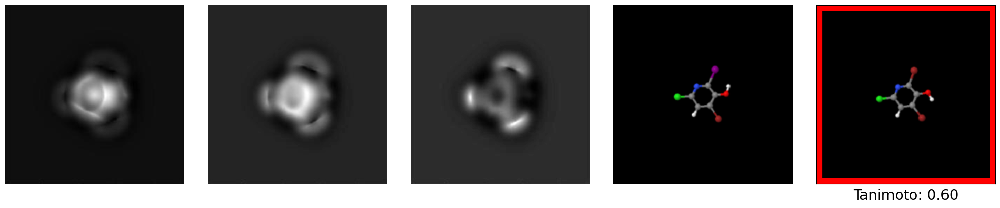

In [10]:
molec_path = '/scratch/dataset/quam/K-1/Conformer3D_CID_53485459_K040_Amp040'
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=1)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)


In [11]:
pred_CID

53485458

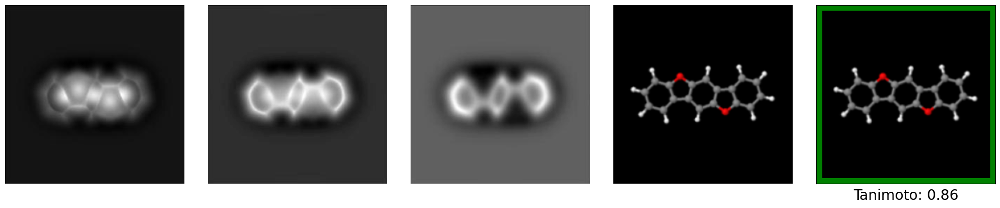

In [26]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches



# To call the function:
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)


/scratch/dataset/quam/K-2/Conformer3D_CID_621062_K040_Amp060


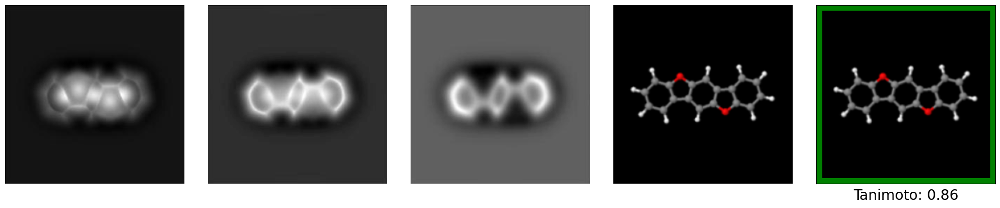

In [27]:
MOLECULE_INDEX = 20000  #34 es buen ejemplo de no acertar al 100% pero aún así adivinar la molécula
molec_path = test_df.iloc[MOLECULE_INDEX]['path']
print(molec_path)
# To call the function:
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)


/scratch/dataset/quam/K-1/Conformer3D_CID_10001048_K040_Amp040
Corrugation = 1.1767000000000003


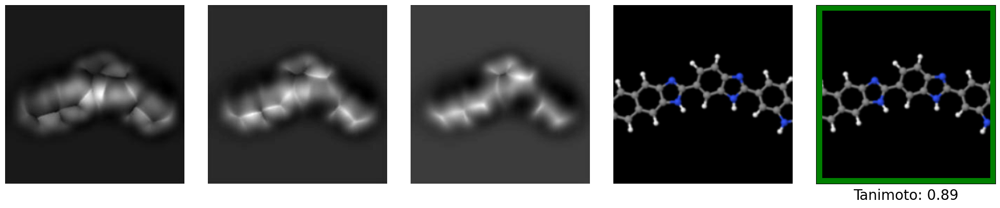

/scratch/dataset/quam/K-2/Conformer3D_CID_621062_K040_Amp060
Corrugation = 0.0013000000000005


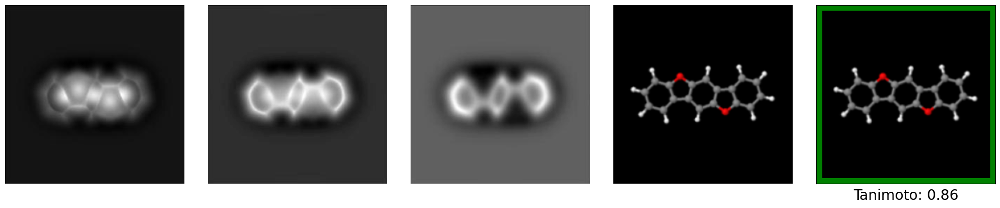

/scratch/dataset/quam/K-4/Conformer3D_CID_129794916_K040_Amp100
Corrugation = 0.04230000000000089


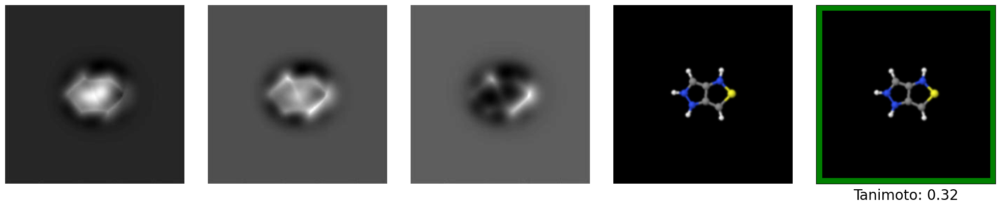

/scratch/dataset/quam/K-6/Conformer3D_CID_3160975_K040_Amp140
Corrugation = 0.002100000000000435


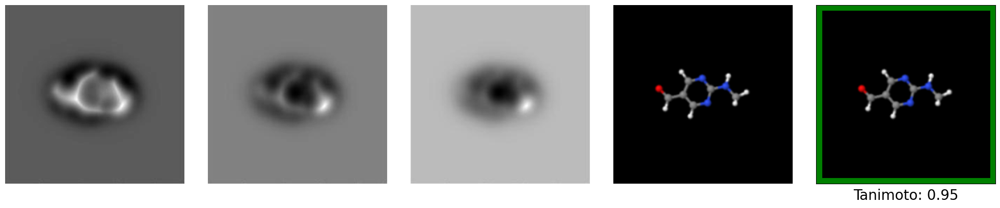

/scratch/dataset/quam/K-7/Conformer3D_CID_443861_K060_Amp040
Corrugation = 0.002200000000000202


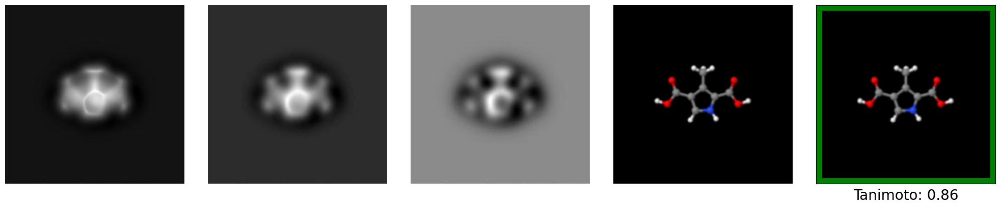

In [29]:
for i in range(5):
    MOLECULE_INDEX = i*20000 
    molec_path = test_df.iloc[MOLECULE_INDEX]['path']
    corrugation =  test_df.iloc[MOLECULE_INDEX]['corrugation']
    print(molec_path)
    print(f'Corrugation = {corrugation}')
    # To call the function:
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)
    plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)

/scratch/dataset/quam/K-1/Conformer3D_CID_2748722_K040_Amp040


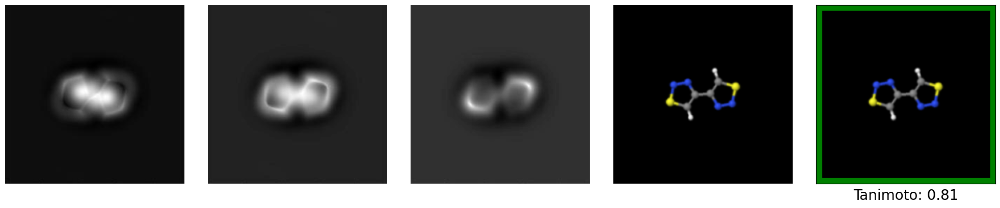

/scratch/dataset/quam/K-4/Conformer3D_CID_63024100_K040_Amp100


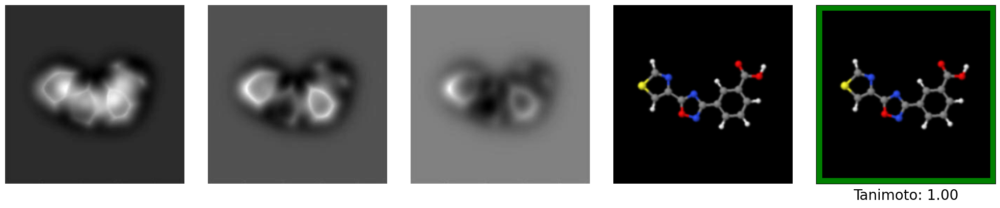

/scratch/dataset/quam/K-7/Conformer3D_CID_103119908_K060_Amp040


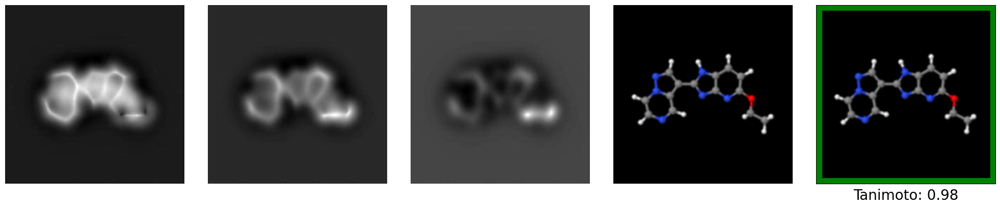

/scratch/dataset/quam/K-11/Conformer3D_CID_118348718_K060_Amp120


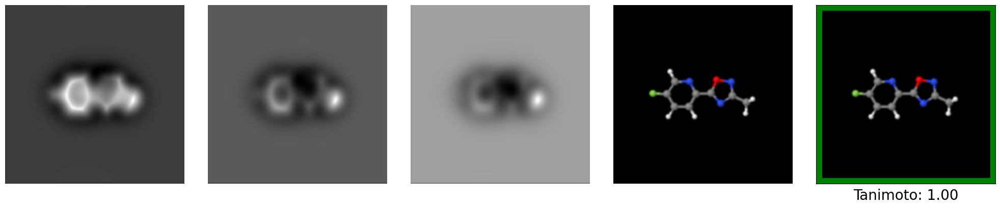

/scratch/dataset/quam/K-14/Conformer3D_CID_42609291_K080_Amp060


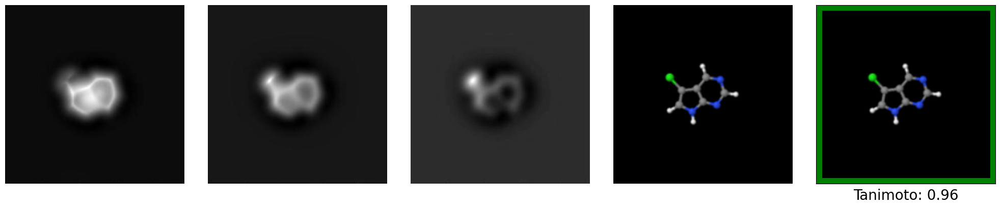

In [30]:
for i in range(5):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = test_df.iloc[MOLECULE_INDEX]['path']
    print(molec_path)
    # To call the function:
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)
    plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)

In [31]:
test_df.iloc[-100]['path']

'/scratch/dataset/quam/K-24/Conformer3D_CID_79880951_K100_Amp140'

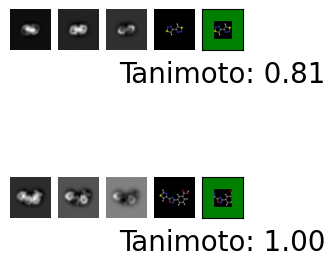

In [32]:
## Final figure:
n_results=2
fig, ax = plt.subplots(n_results, 5, figsize=(3, 4))
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = test_df.iloc[MOLECULE_INDEX]['path']
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)

    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=20)
#######################################

plt.show()

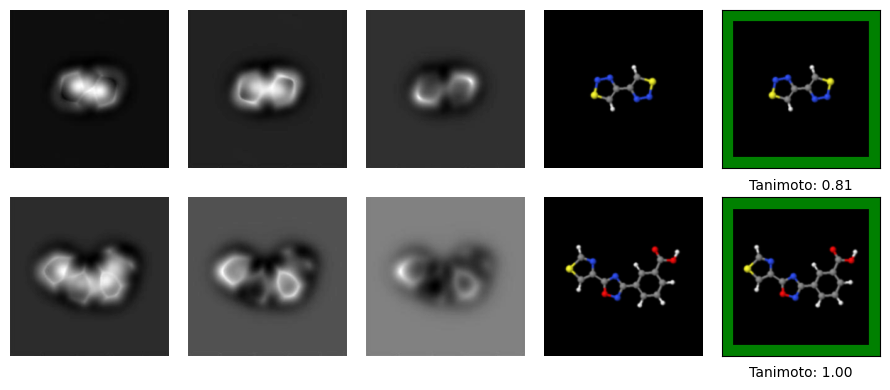

In [33]:
# Final figure:
n_results=2
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = test_df.iloc[MOLECULE_INDEX]['path']
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)

    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs
#######################################

plt.tight_layout()
plt.show()


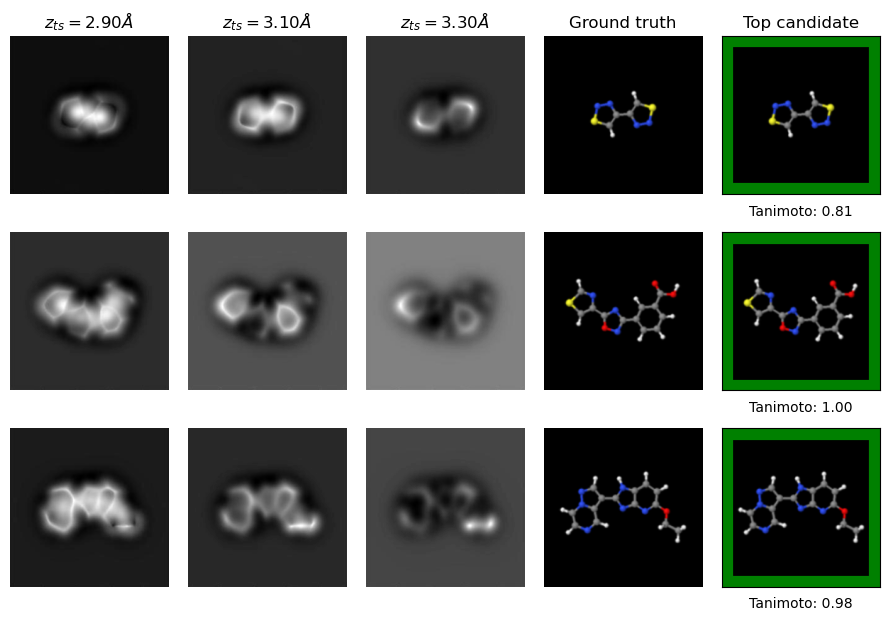

In [34]:
# Final figure:
n_results=3
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = test_df.iloc[MOLECULE_INDEX]['path']
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)

    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('vs_good_pred.png')
plt.show()


/scratch/dataset/quam/K-1/Conformer3D_CID_2748722_K040_Amp040
2748722 2748722
/scratch/dataset/quam/K-4/Conformer3D_CID_63024100_K040_Amp100
63024100 63024100
/scratch/dataset/quam/K-7/Conformer3D_CID_103119908_K060_Amp040
103119908 103119908


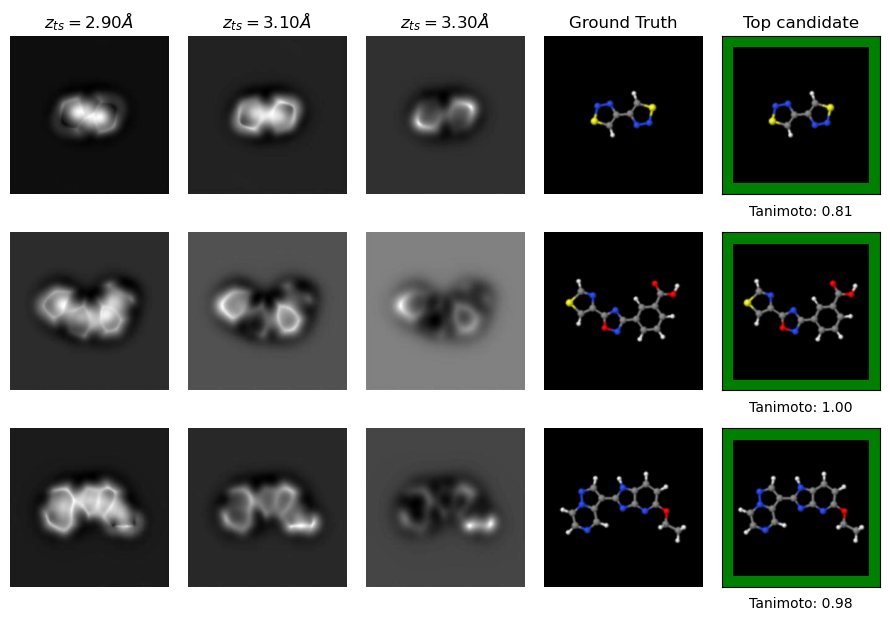

In [35]:
# Final figure:
n_results=3
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = test_df.iloc[MOLECULE_INDEX]['path']
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)
    print(true_CID, pred_CID)
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
#plt.savefig('vs_good_pred.png')
plt.show()


### Elegimos otros candidatos. Queremos algunas moléculas con halógenos, otras con oxígenos y otras que sean PAH (Hidrocarburo aromático policíclico). 

In [40]:
condition = ((dataset_df['O'] >0) & (dataset_df[['C','Br', 'Cl', 'F', 'I', 'N', 'O', 'P', 'S', 'H']].sum(axis=1)<10))
selected_rows = dataset_df[condition]
selected_rows

,path,CID,SMILES,morgan_fp,split,corrugation,C,Br,Cl,F,I,N,O,P,S,H
732,/scratch/dataset/quam/K-1/Conformer3D_CID_2208...,22087375,C=NC1=NN=NO1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.4613,2.0,0.0,0.0,0.0,0.0,4.0,1.0,0.0,0.0,2.0
1391,/scratch/dataset/quam/K-1/Conformer3D_CID_1429...,142966,C#CCC=O,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0171,4.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0
1590,/scratch/dataset/quam/K-1/Conformer3D_CID_1286...,12869424,CON=C,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0000,2.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,5.0
3708,/scratch/dataset/quam/K-1/Conformer3D_CID_1296...,129652402,C1=CN2C(=C1)O2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.7911,4.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0
4579,/scratch/dataset/quam/K-1/Conformer3D_CID_8611...,86114327,C(C#N)O[N+](=O)[O-],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0002,2.0,0.0,0.0,0.0,0.0,2.0,3.0,0.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563449,/scratch/dataset/quam/K-1/Conformer3D_CID_5416...,54166679,C1(=O)C(=NC(=O)N1)Br,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0030,3.0,1.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,1.0
574143,/scratch/dataset/quam/K-1/Conformer3D_CID_1296...,129648582,C1=CP=NN1O,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0262,2.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,0.0,3.0
575570,/scratch/dataset/quam/K-1/Conformer3D_CID_1310...,131051826,C1C(=N)P1O,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,1.3484,2.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,4.0
576338,/scratch/dataset/quam/K-1/Conformer3D_CID_2205...,22051987,C(C(=O)O)P=O,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0266,2.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,3.0


['/scratch/dataset/quam/K-1/Conformer3D_CID_117275416_K040_Amp040',
 '/scratch/dataset/quam/K-1/Conformer3D_CID_118813491_K040_Amp040',
 '/scratch/dataset/quam/K-1/Conformer3D_CID_118835885_K040_Amp040']

/scratch/dataset/quam/K-1/Conformer3D_CID_223103_K040_Amp040
223103 223103
/scratch/dataset/quam/K-1/Conformer3D_CID_4090083_K040_Amp040
4090083 4090083
/scratch/dataset/quam/K-1/Conformer3D_CID_131308660_K040_Amp040
131308660 131308660


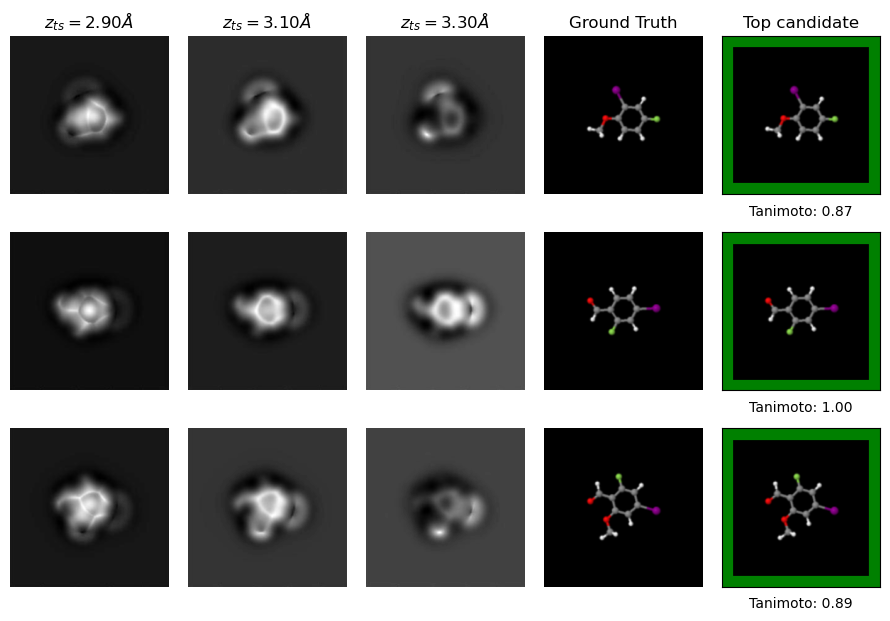

In [46]:
# Final figure:
condition = (dataset_df['I'] > 0) & (dataset_df['F'] > 0) & (dataset_df[[ 'N', 'S']].sum(axis=1) == 0)
selected_rows = dataset_df[condition]
paths = list(selected_rows.iloc[-16:-13]['path'])

n_results=3
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i, molec_path in enumerate(paths):
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)
    print(true_CID, pred_CID)
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
#plt.savefig('vs_good_pred.png')
plt.show()

/scratch/dataset/quam/K-6/Conformer3D_CID_143932_K040_Amp140
143932 143932
/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060
636081 636081
/scratch/dataset/quam/K-24/Conformer3D_CID_59721948_K100_Amp140
59721948 59721948


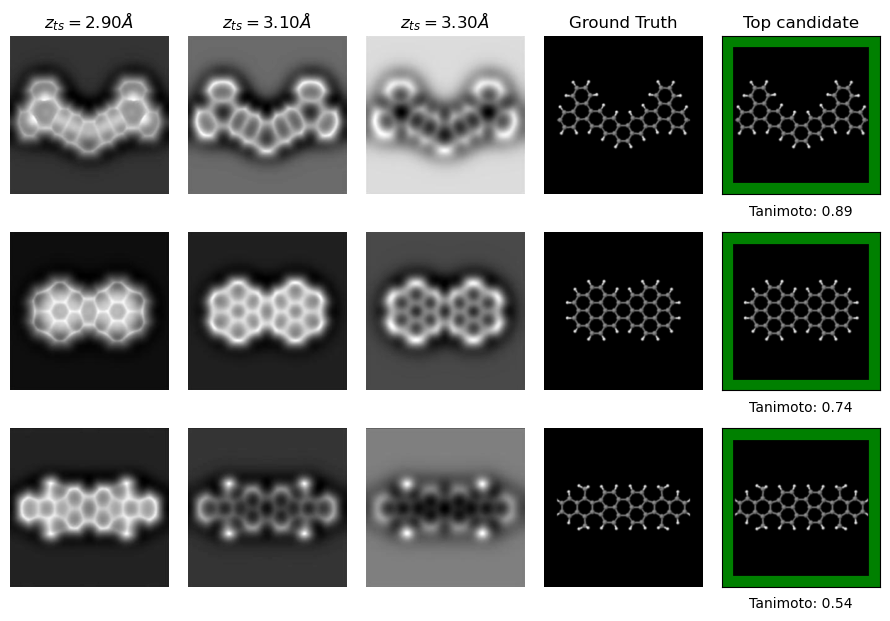

In [23]:
# Final figure:
condition = (dataset_df['C'] > 40) & (dataset_df['H'] > 10) & (dataset_df[['Br', 'Cl', 'F', 'I', 'N', 'O', 'P', 'S']].sum(axis=1) == 0)
selected_rows = dataset_df[condition]
n_results=3
paths = ['/scratch/dataset/quam/K-6/Conformer3D_CID_143932_K040_Amp140', 
        '/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060', 
        '/scratch/dataset/quam/K-24/Conformer3D_CID_59721948_K100_Amp140']
#paths = list(selected_rows.iloc[2:n_results+2]['path'])

titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i, molec_path in enumerate(paths):
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=1.2)
    print(true_CID, pred_CID)
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('/home/mgonzalez/CODE/Pytorch-fingerprints/figures/identification_results/pah_identification.jpg')
plt.show()

In [11]:
condition = (dataset_df['C'] > 40) & (dataset_df['H'] > 10) & (dataset_df[['Br', 'Cl', 'F', 'I', 'N', 'O', 'P', 'S']].sum(axis=1) == 0)

len(dataset_df[condition])

18

/scratch/dataset/quam/K-1/Conformer3D_CID_21746690_K040_Amp040
21746690 21746690
/scratch/dataset/quam/K-1/Conformer3D_CID_21746722_K040_Amp040
21746722 21746722
/scratch/dataset/quam/K-1/Conformer3D_CID_123913517_K040_Amp040
123913517 123913517


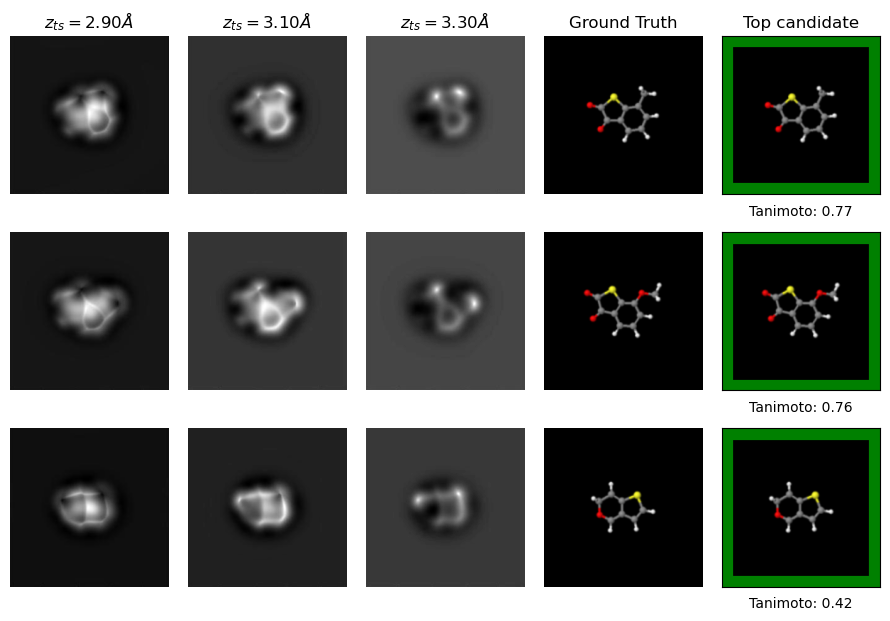

In [53]:
# Final figure:
condition = ((dataset_df['S'] > 0) & (dataset_df['O'] > 0) & (dataset_df['N'] == 0))
selected_rows = dataset_df[condition]
paths = list(selected_rows.iloc[3:6]['path'])

n_results=3
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i, molec_path in enumerate(paths):
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.8)
    print(true_CID, pred_CID)
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
#plt.savefig('vs_good_pred.png')
plt.show()

### Buscar 2 pentágonos, un azufre y un oxígeno.

In [38]:
condition = (dataset_df['C'] < 12) & (dataset_df['C'] > 5) & (dataset_df['S'] == 1) & (dataset_df['O'] == 1) & (dataset_df[['Br', 'Cl', 'F', 'I', 'N', 'P']].sum(axis=1) == 0)
selection = dataset_df[condition].sort_values('C', axis=0)


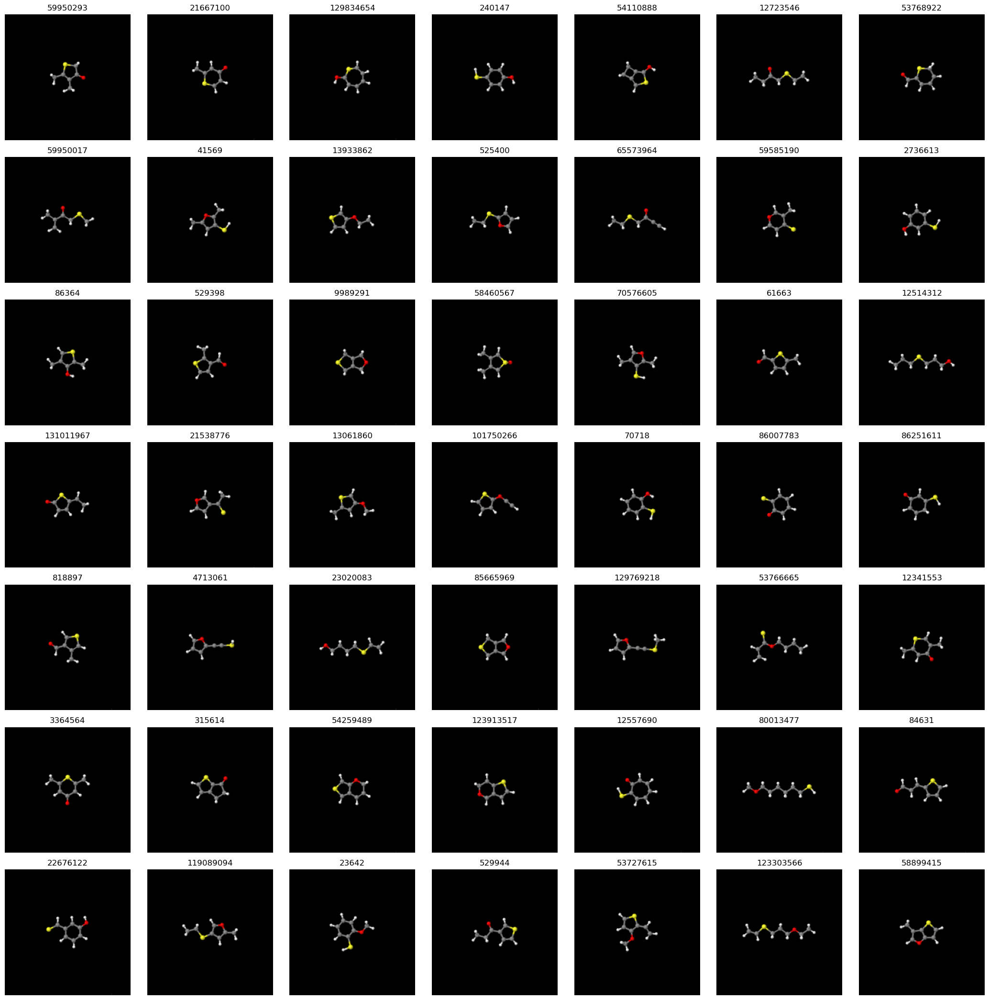

In [33]:
def plot_jmol_grid(cids, n=7, dimension=[224,224], zoom=1):
    fig, axs = plt.subplots(n, n, figsize=(n*3, n*3))

    for i, cid in enumerate(cids):
        row = i // n
        col = i % n
        try:
            jmol_image_array = load_jmol_image(cid, dimension, zoom)
            axs[row, col].imshow(jmol_image_array)
            axs[row, col].axis('off')  # to hide axis
            axs[row, col].set_title(cid)  # set the CID as the title
        except Exception as e:
            print(f'Failed to load image for CID {cid}. Error: {e}')

    # If there are fewer images than grid size, remove empty subplots
    if len(cids) < n*n:
        for i in range(len(cids), n*n):
            row = i // n
            col = i % n
            fig.delaxes(axs[row][col])

    plt.tight_layout()
    plt.show()

    
cid_list = selection['CID'].iloc[0:49]    
plot_jmol_grid(cid_list, n=7)

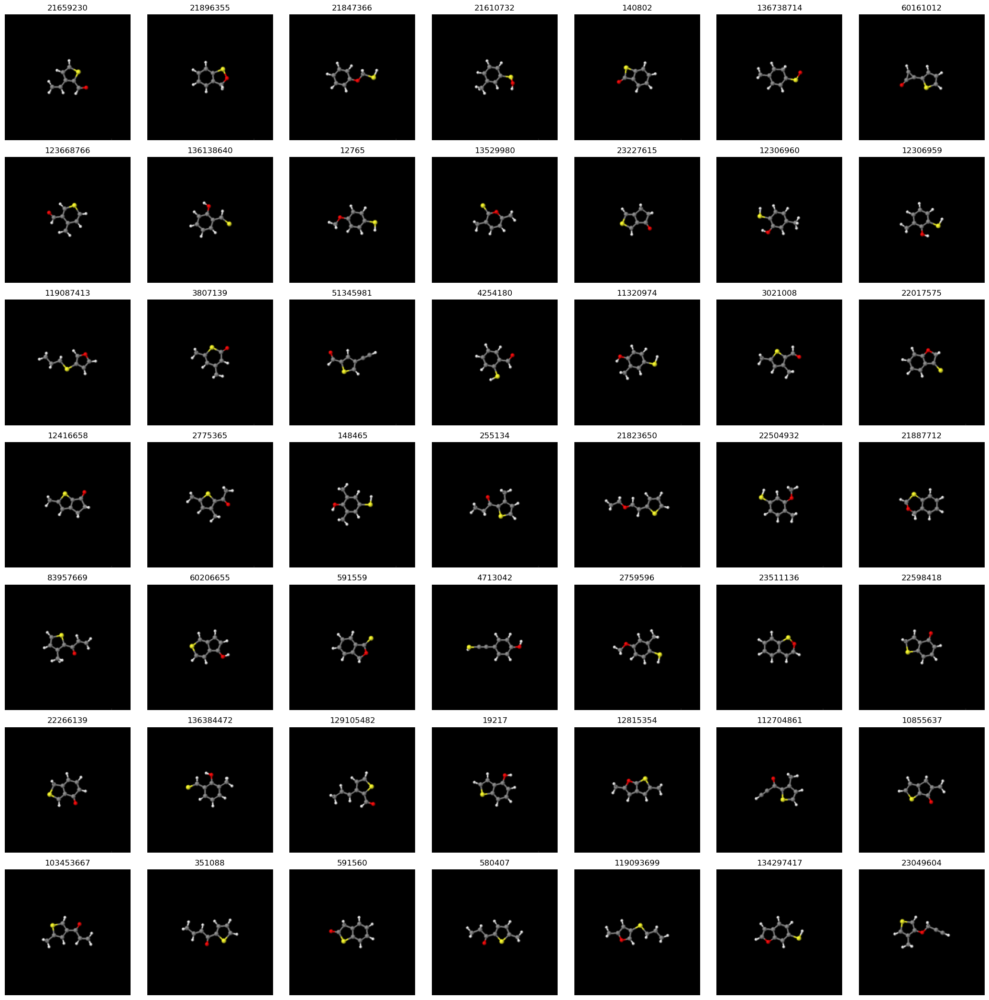

In [34]:
def plot_jmol_grid(cids, n=7, dimension=[224,224], zoom=1):
    fig, axs = plt.subplots(n, n, figsize=(n*3, n*3))

    for i, cid in enumerate(cids):
        row = i // n
        col = i % n
        try:
            jmol_image_array = load_jmol_image(cid, dimension, zoom)
            axs[row, col].imshow(jmol_image_array)
            axs[row, col].axis('off')  # to hide axis
            axs[row, col].set_title(cid)  # set the CID as the title
        except Exception as e:
            print(f'Failed to load image for CID {cid}. Error: {e}')

    # If there are fewer images than grid size, remove empty subplots
    if len(cids) < n*n:
        for i in range(len(cids), n*n):
            row = i // n
            col = i % n
            fig.delaxes(axs[row][col])

    plt.tight_layout()
    plt.show()

    
cid_list = selection['CID'].iloc[49:98]    
plot_jmol_grid(cid_list, n=7)

/scratch/dataset/quam/K-6/Conformer3D_CID_85665969_K040_Amp140
85665969 85665969
/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060
58899415 58899415
/scratch/dataset/quam/K-24/Conformer3D_CID_315614_K100_Amp140
315614 315614


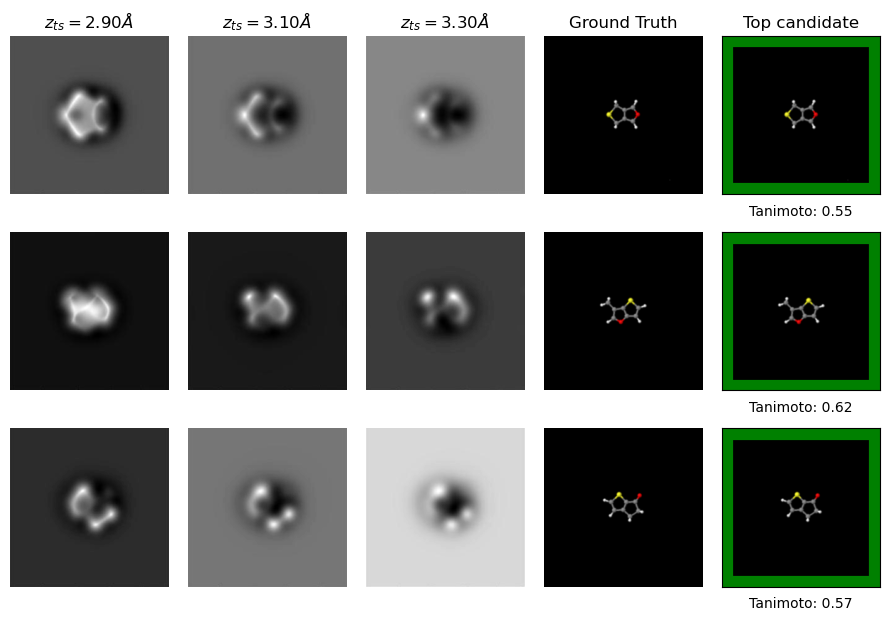

In [75]:
paths = ['/scratch/dataset/quam/K-6/Conformer3D_CID_85665969_K040_Amp140', 
        '/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060', 
        '/scratch/dataset/quam/K-24/Conformer3D_CID_315614_K100_Amp140']
#paths = list(selected_rows.iloc[2:n_results+2]['path'])

titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i, molec_path in enumerate(paths):
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=1.2)
    print(true_CID, pred_CID)
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('/home/mgonzalez/CODE/Pytorch-fingerprints/figures/identification_results/pentagons_identification.jpg')
plt.show()

### Final figure of correct retrievals in theoretical images


In [24]:
condition = ((dataset_df['Cl'] > 0) & (dataset_df['I'] > 0) & (dataset_df['Br'] > 0) )
selection = dataset_df[condition].sort_values('C', axis=0)
selection

,path,CID,SMILES,morgan_fp,split,corrugation,C,Br,Cl,F,I,N,O,P,S,H
269361,/scratch/dataset/quam/K-1/Conformer3D_CID_1272...,127255822,C1=C(C(=NC(=N1)Cl)I)Br,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0012,4.0,1.0,1.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0
577366,/scratch/dataset/quam/K-1/Conformer3D_CID_7218...,72183210,C1(=C(N=C(C(=N1)I)Cl)Br)N,"[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0039,4.0,1.0,1.0,0.0,1.0,3.0,0.0,0.0,0.0,2.0
577689,/scratch/dataset/quam/K-1/Conformer3D_CID_5933...,59332995,C1=CN=C(C(=C1Cl)I)Br,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0002,5.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0
258363,/scratch/dataset/quam/K-1/Conformer3D_CID_1188...,118827534,C1=C(C(=CN=C1I)Cl)Br,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0017,5.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0
573307,/scratch/dataset/quam/K-1/Conformer3D_CID_1188...,118844486,C1=C(C(=CN=C1Cl)I)Br,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0012,5.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
574026,/scratch/dataset/quam/K-1/Conformer3D_CID_1076...,107635064,C1=CC(=CC(=C1)Br)NC(=O)CNC2=C(C=C(C=C2)Cl)I,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0384,14.0,1.0,1.0,0.0,1.0,2.0,1.0,0.0,0.0,11.0
342115,/scratch/dataset/quam/K-1/Conformer3D_CID_5934...,59342891,C1=C2C3=C(C4=CC(=C(N=C4C2=NC(=C1Cl)Cl)Br)Br)N=...,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0073,14.0,2.0,2.0,0.0,2.0,4.0,0.0,0.0,0.0,2.0
576860,/scratch/dataset/quam/K-1/Conformer3D_CID_3966...,3966555,C1=CC(=C(C=C1C=CC(=O)NC2=C(C=C(C=C2)Br)I)[N+](...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.9743,15.0,1.0,1.0,0.0,1.0,2.0,3.0,0.0,0.0,9.0
330730,/scratch/dataset/quam/K-1/Conformer3D_CID_4013...,4013847,C1=CC(=CC=C1C2=CC=C(O2)C(=O)NC3=C(C=C(C=C3)Br)...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0860,17.0,1.0,1.0,0.0,1.0,1.0,2.0,0.0,0.0,10.0


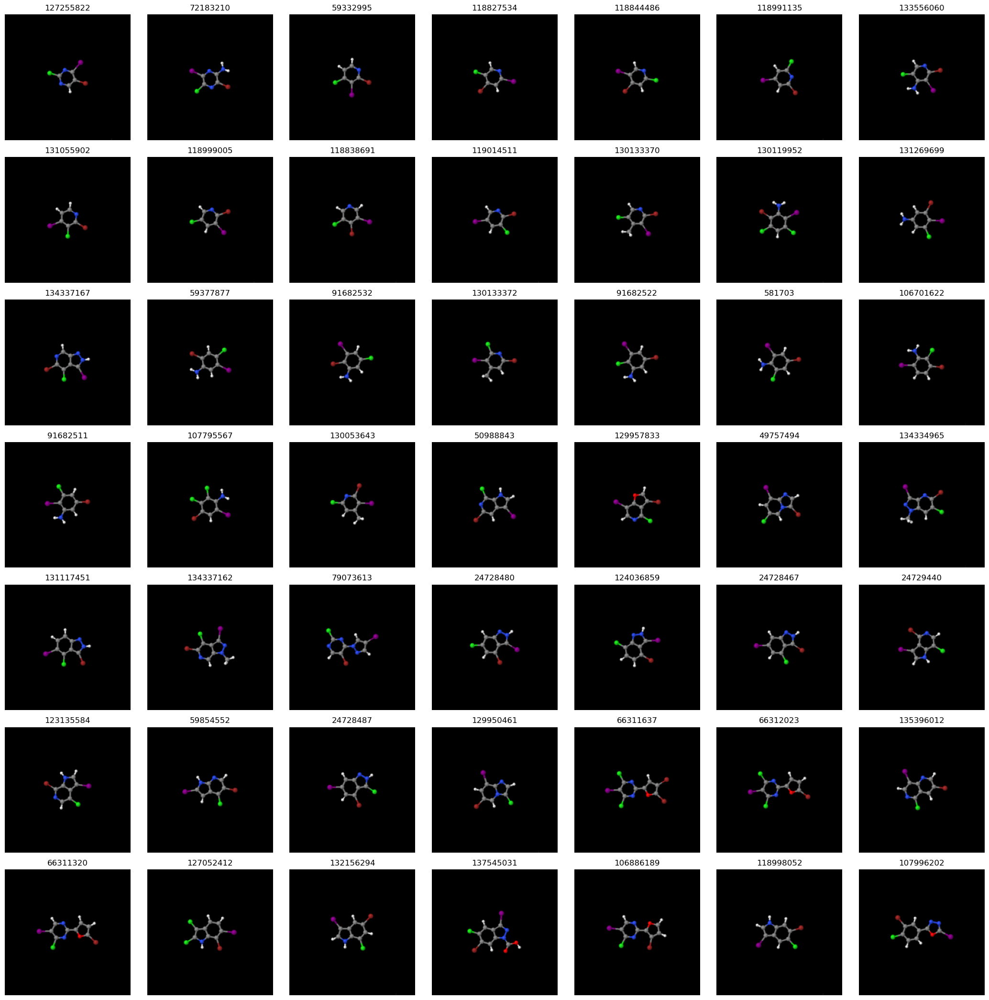

269361    127255822
577366     72183210
577689     59332995
258363    118827534
573307    118844486
            ...    
574026    107635064
342115     59342891
576860      3966555
330730      4013847
251247      1215845
Name: CID, Length: 193, dtype: int64


In [27]:
def plot_jmol_grid(cids, n=7, dimension=[224,224], zoom=1):
    fig, axs = plt.subplots(n, n, figsize=(n*3, n*3))

    for i, cid in enumerate(cids):
        row = i // n
        col = i % n
        try:
            jmol_image_array = load_jmol_image(cid, dimension, zoom)
            axs[row, col].imshow(jmol_image_array)
            axs[row, col].axis('off')  # to hide axis
            axs[row, col].set_title(cid)  # set the CID as the title
        except Exception as e:
            print(f'Failed to load image for CID {cid}. Error: {e}')

    # If there are fewer images than grid size, remove empty subplots
    if len(cids) < n*n:
        for i in range(len(cids), n*n):
            row = i // n
            col = i % n
            fig.delaxes(axs[row][col])

    plt.tight_layout()
    plt.show()

    
cid_list = selection['CID'].iloc[0:49]    
plot_jmol_grid(cid_list, n=7)
print(selection['CID'])

In [37]:
### Search carboxiles and methylenes groups
def search_groups(smiles_code):
    molecule = Chem.MolFromSmiles(smiles_code)

    # SMARTS patterns for carboxyl and methylene groups
    carboxyl_pattern = Chem.MolFromSmarts('C(=O)[O;h1]')
    methylene_pattern = Chem.MolFromSmarts('[CH2]')

    # Using GetSubstructMatches to find matches in the molecule
    carboxyl_matches = molecule.GetSubstructMatches(carboxyl_pattern)
    methylene_matches = molecule.GetSubstructMatches(methylene_pattern)

    # Count matches
    carboxyl_count = len(carboxyl_matches)
    methylene_count = len(methylene_matches)

    return carboxyl_count, methylene_count
CID_list = list()
# Example use
for i, smiles in enumerate(list(dataset_df.iloc[:]['SMILES'])):
    carboxyl_count, methylene_count = search_groups(smiles)
    if (carboxyl_count*methylene_count>0): 
        CID_list.append(dataset_df.iloc[i]['CID'])

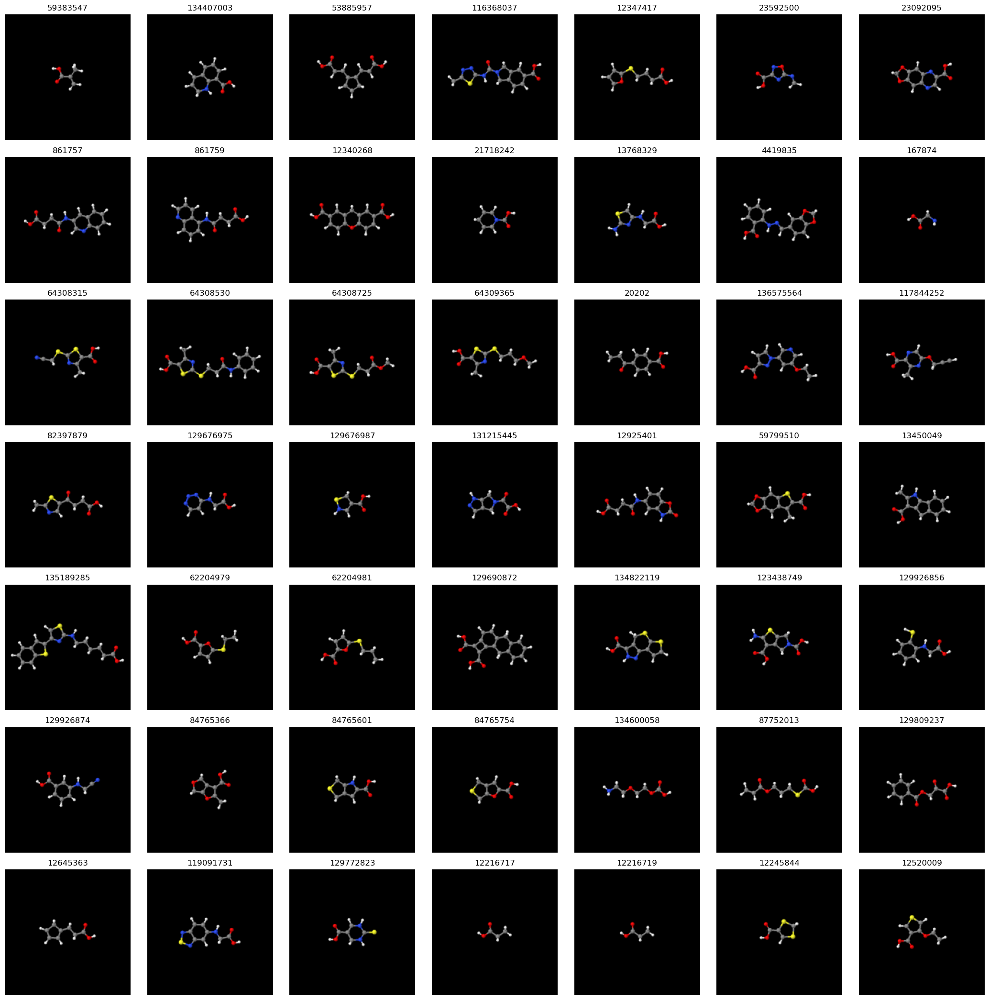

In [39]:
plot_jmol_grid(CID_list[:49], n=7)

/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060
58899415 58899415
/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060
636081 636081
/scratch/dataset/quam/K-24/Conformer3D_CID_59332995_K100_Amp140
59332995 59332995
/scratch/dataset/quam/K-18/Conformer3D_CID_861757_K080_Amp140
861757 861757


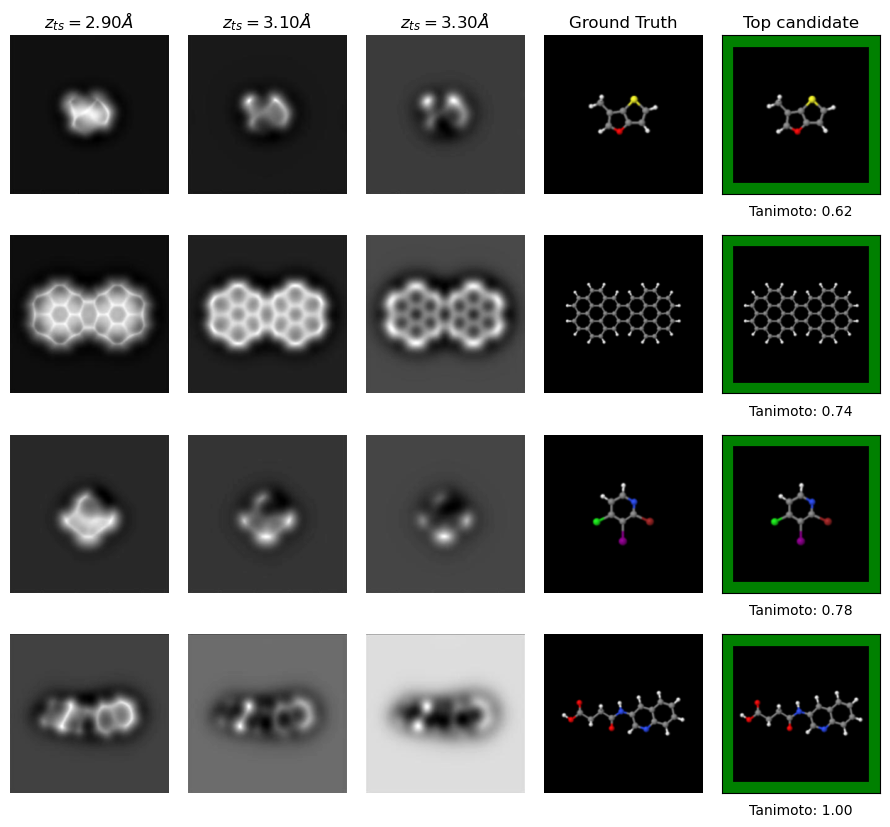

In [51]:
# Final figure:
condition = (dataset_df['C'] > 40) & (dataset_df['H'] > 10) & (dataset_df[['Br', 'Cl', 'F', 'I', 'N', 'O', 'P', 'S']].sum(axis=1) == 0)
selected_rows = dataset_df[condition]
zoom_list = [0.8, None, 0.8, 0.9]
n_results=4
paths = ['/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060', 
        '/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060', 
        '/scratch/dataset/quam/K-24/Conformer3D_CID_59332995_K100_Amp140',
        '/scratch/dataset/quam/K-18/Conformer3D_CID_861757_K080_Amp140']
#paths = list(selected_rows.iloc[2:n_results+2]['path'])

titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i, molec_path in enumerate(paths):
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, 
                                                                                           dimension=[224,224], zoom=1.2, zoom_jmol=zoom_list[i])
    print(true_CID, pred_CID)
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('/home/mgonzalez/CODE/Pytorch-fingerprints/figures/identification_results/identification_4_cases.jpg')
plt.show()

#### Mirar la corrugación de la molécula y ver el segundo candidato.

In [5]:
def run_prediction_extra(molec_path, dimension=[224,224], zoom=1, verbose=False):
    img_stack = load_img_stack(molec_path)
    true_CID = _extract_cid(molec_path)

    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)


    first_CID = _extract_cid(output_df.iloc[0]['path'])
    second_CID = _extract_cid(output_df.iloc[1]['path'])
    tanimoto_first = output_df.iloc[0]['tanimoto']
    tanimoto_second = output_df.iloc[1]['tanimoto']
    
    gt_jmol = load_jmol_image(true_CID, dimension=dimension, zoom=zoom)
    first_jmol = load_jmol_image(first_CID, dimension=dimension, zoom=zoom)
    second_jmol = load_jmol_image(second_CID, dimension=dimension, zoom=zoom)

    
    if verbose:
        print('Total number of fingerprints', np.sum(fp_pred))
        print('Is the correct CID in the top k candidates?',  true_CID in list(output_df['CID']))
        print('Is the correct CID the first candidate?',  true_CID == output_df['CID'].iloc[0])
        print(f'top candidate: {first_CID} tanimoto: {tanimoto_first}')
        print(f'second candidate: {second_CID} tanimoto: {tanimoto_second}')
        print('########################')
        print(output_df.iloc[:5]['CID'])
        print('########################')
        
    
    return img_stack[1], img_stack[3], img_stack[5], gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second


In [51]:
corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
corrugation_first

0.003400000000001

/scratch/dataset/quam/K-1/Conformer3D_CID_2748722_K040_Amp040
Total number of fingerprints 15
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 2748722 tanimoto: 0.8125
second candidate: 270010 tanimoto: 0.6363636363636364
2748722 2748722 270010
/scratch/dataset/quam/K-4/Conformer3D_CID_63024100_K040_Amp100
Total number of fingerprints 40
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 63024100 tanimoto: 1.0
second candidate: 80490556 tanimoto: 0.8372093023255814
63024100 63024100 80490556
/scratch/dataset/quam/K-7/Conformer3D_CID_103119908_K060_Amp040
Total number of fingerprints 45
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 103119908 tanimoto: 0.9782608695652174
second candidate: 103119895 tanimoto: 0.7959183673469388
103119908 103119908 103119895


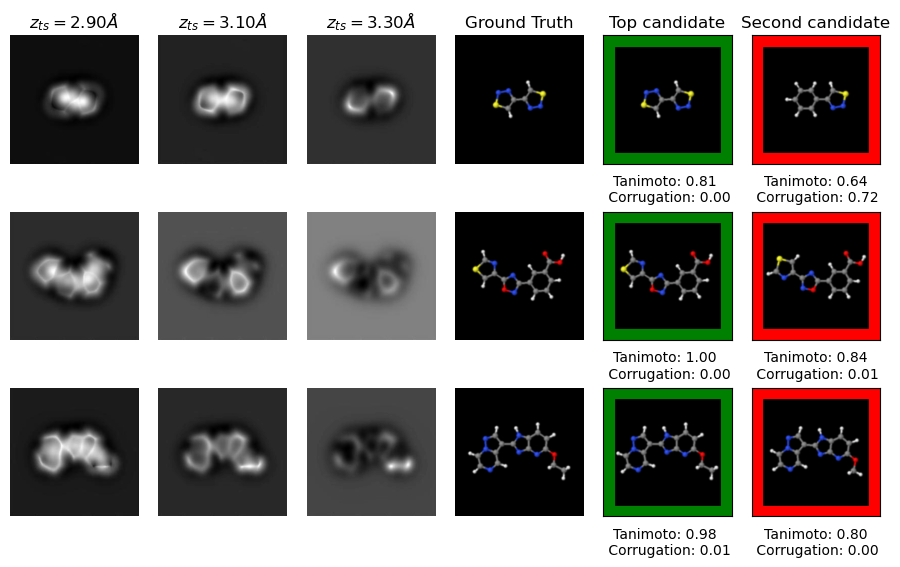

In [53]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = test_df.iloc[MOLECULE_INDEX]['path']
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=0.8, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
#plt.savefig('vs_good_pred.png')
plt.show()


## Figure 2: cases where it fails


/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060


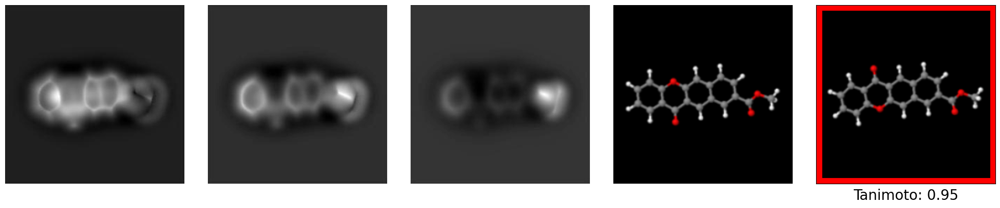

In [80]:

molec_path = '/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060'

print(molec_path)
# To call the function:
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.85)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)

/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040


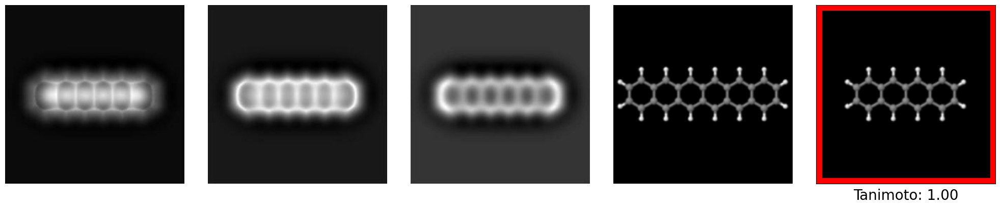

In [83]:

molec_path = '/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040'

print(molec_path)
# To call the function:
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.85)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)

/scratch/dataset/quam/K-24/Conformer3D_CID_137221883_K100_Amp140


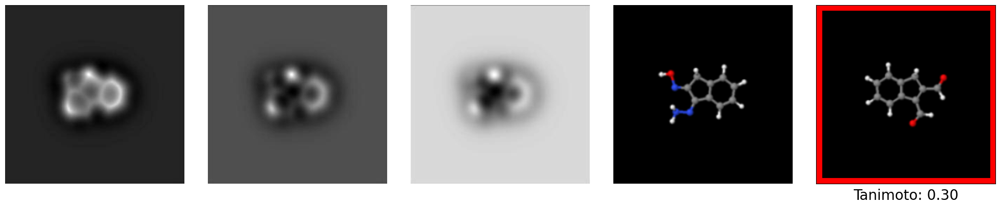

In [89]:

molec_path = '/scratch/dataset/quam/K-24/Conformer3D_CID_137221883_K100_Amp140'


print(molec_path)
# To call the function:
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.85)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)

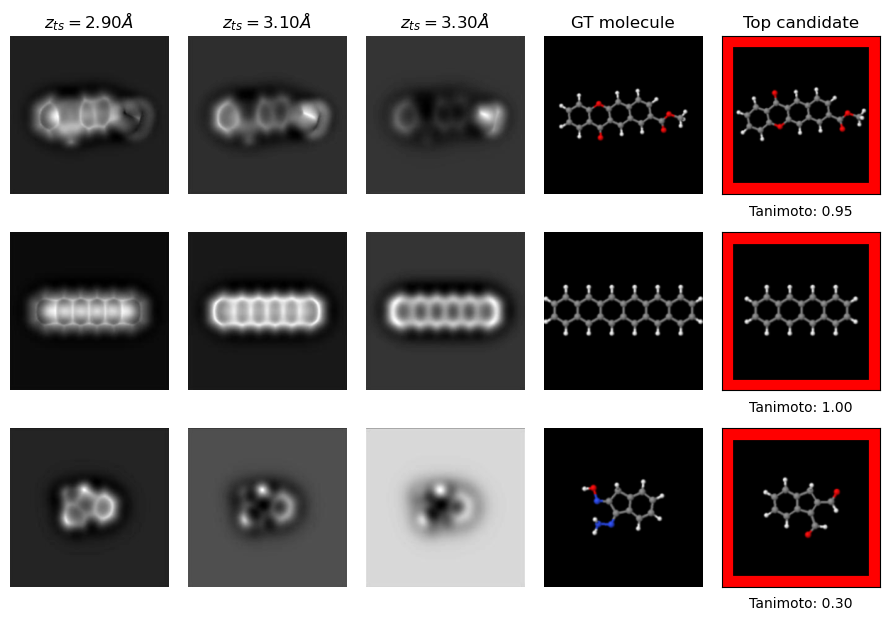

In [106]:
# Final figure:
n_results=3

molec_path_array=[ '/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060',
                  '/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040', 
                  '/scratch/dataset/quam/K-24/Conformer3D_CID_137221883_K100_Amp140'
                 ]


titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'GT molecule', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i in range(n_results):
    
    molec_path = molec_path_array[i]
    if i==0:
        zoom=0.9
    else:
        zoom=0.8
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=zoom)

    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('vs_bad_pred.png')

plt.show()


true_CID: 135178930, pred_CID: 135178929, tanimoto: 0.9512195121951219
true_CID: 123044, pred_CID: 7080, tanimoto: 1.0
true_CID: 137221883, pred_CID: 129814712, tanimoto: 0.3


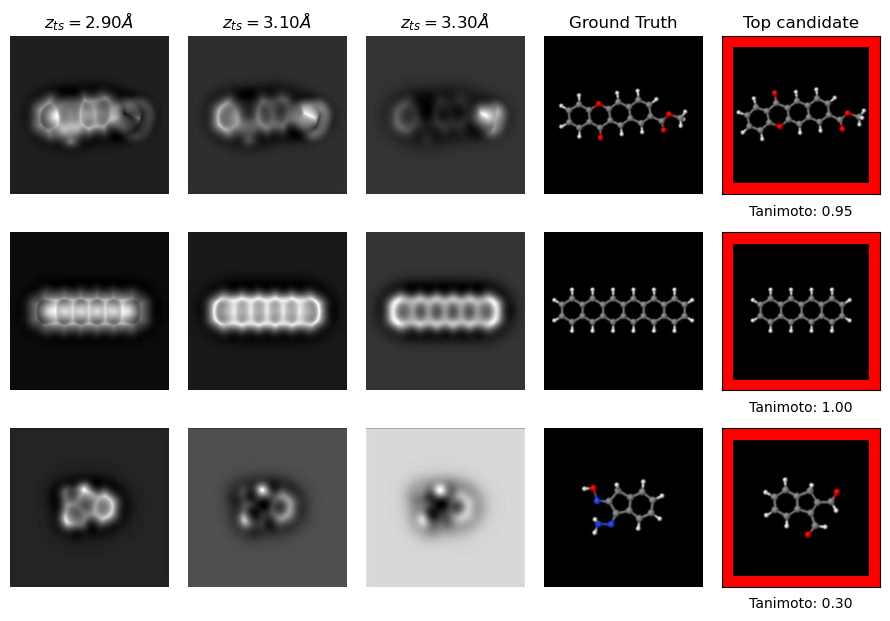

In [62]:
# Final figure:
n_results=3

molec_path_array=[ '/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060',
                  '/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040', 
                  '/scratch/dataset/quam/K-24/Conformer3D_CID_137221883_K100_Amp140'
                 ]


titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i in range(n_results):
    
    molec_path = molec_path_array[i]
    if i==0:
        zoom=0.9
    elif i==1:
        zoom=0.9
    else:
        zoom=0.8
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=zoom)
    print(f'true_CID: {true_CID}, pred_CID: {pred_CID}, tanimoto: {tanimoto}')
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('vs_bad_pred.png')

plt.show()


/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060
Total number of fingerprints 40
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? False
top candidate: 135178929 tanimoto: 0.9512195121951219
second candidate: 135178930 tanimoto: 0.9512195121951219
########################
18065     135178929
18066     135178930
209720       470402
209791       473475
185889    135167504
Name: CID, dtype: int64
########################
135178930 135178929 135178930
/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040
Total number of fingerprints 11
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? False
top candidate: 7080 tanimoto: 1.0
second candidate: 6857587 tanimoto: 1.0
########################
146499       7080
20518     6857587
78524     5460712
300        123044
188423     136034
Name: CID, dtype: int64
########################
123044 7080 6857587
/scratch/dataset/quam/K-24/Conformer3D_CID_13722

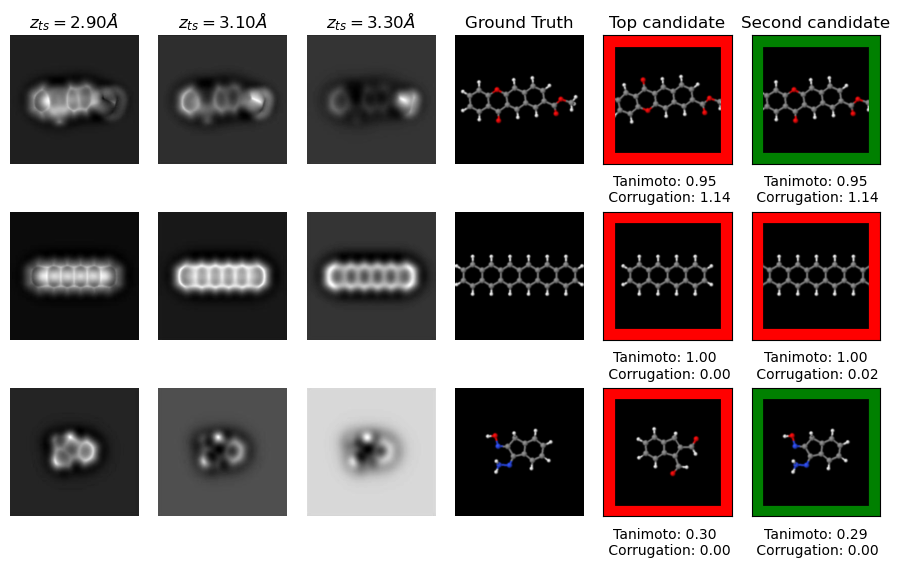

In [68]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs

molec_path_array=[ '/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060',
                  '/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040', 
                  '/scratch/dataset/quam/K-24/Conformer3D_CID_137221883_K100_Amp140'
                 ]
for i in range(n_results):
    molec_path = molec_path_array[i]
    if i==0:
        zoom=0.9
    else:
        zoom=0.8    
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=0.8, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
#plt.savefig('vs_good_pred.png')
plt.show()


### Pintemos todos los candidatos

/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060
135178930
/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040
123044
/scratch/dataset/quam/K-24/Conformer3D_CID_137221883_K100_Amp140
137221883


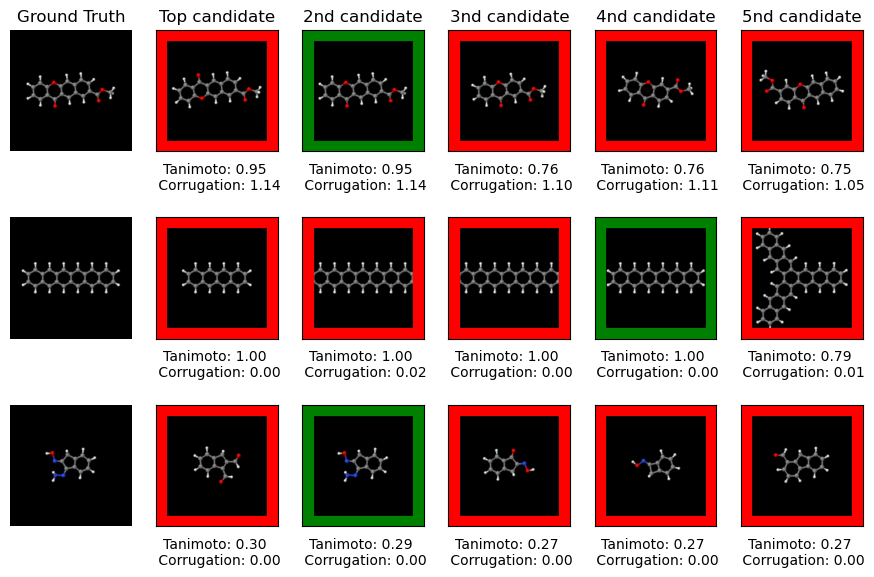

In [82]:
# let's try it out

#MOLECULE_INDEX = 40000  #34 es buen ejemplo de no acertar al 100% pero aún así adivinar la molécula
molec_path_array=[ '/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060',
                  '/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040', 
                  '/scratch/dataset/quam/K-24/Conformer3D_CID_137221883_K100_Amp140'
                 ]
titles = ['Ground Truth', 'Top candidate', '2nd candidate', '3nd candidate', '4nd candidate', '5nd candidate',]
fig, ax = plt.subplots(3, 6, figsize=(11, n_results*2.3))  # Adjust figsize according to your needs

for i, molec_path in enumerate(molec_path_array):
    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)
    true_CID = _extract_cid(molec_path)
    gt_jmol = load_jmol_image(true_CID, dimension=[224,224], zoom=1)
    print(molec_path)
    print(true_CID)
    CID_list =  [CID for CID in output_df['CID']]
    tanimoto_list =  [tanimoto for tanimoto in output_df['tanimoto']]
    corrugation_list =  [corrugation for corrugation in output_df['corrugation']]

    pred_jmol_list =  [load_jmol_image(CID, dimension=[224,224], zoom=1) for CID in output_df['CID']]
    
    ax[i,0].imshow(gt_jmol, cmap='gray')
    ax[i,0].axis('off')
    
    for j in range(1,len(pred_jmol_list)+1):
        ax[i,j].imshow(pred_jmol_list[j-1], cmap='gray')
        ax[i,j].axis('off')
        
        if true_CID == CID_list[j-1]:
            color = 'green'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        else:
            color = 'red'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        
        ax[i,j].add_patch(rect)
        ax[i,j].axis('on')
        ax[i,j].set_xlabel(f'Tanimoto: {tanimoto_list[j-1]:.2f} \n Corrugation: {corrugation_list[j-1]:.2f}', fontsize=10)  # Adjust fontsize according to your needs
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])
    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])
        
plt.show()

## Check edge cases
We are going to debug the top1 accuracy w tiebreak by checking examples that are top5 mistake without being top1 mistakes w tiebreak

In [18]:
dataset_df[dataset_df['CID'] == 53485459]

,path,CID,SMILES,morgan_fp,split,corrugation
576793,/scratch/dataset/quam/K-1/Conformer3D_CID_5348...,53485459,C1=C(C(=C(N=C1Cl)I)O)Br,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",train,0.0002


/scratch/dataset/quam/K-1/Conformer3D_CID_53485459_K040_Amp040
53485459
/scratch/dataset/quam/K-1/Conformer3D_CID_59271172_K040_Amp040
59271172
/scratch/dataset/quam/K-1/Conformer3D_CID_129148936_K040_Amp040
129148936


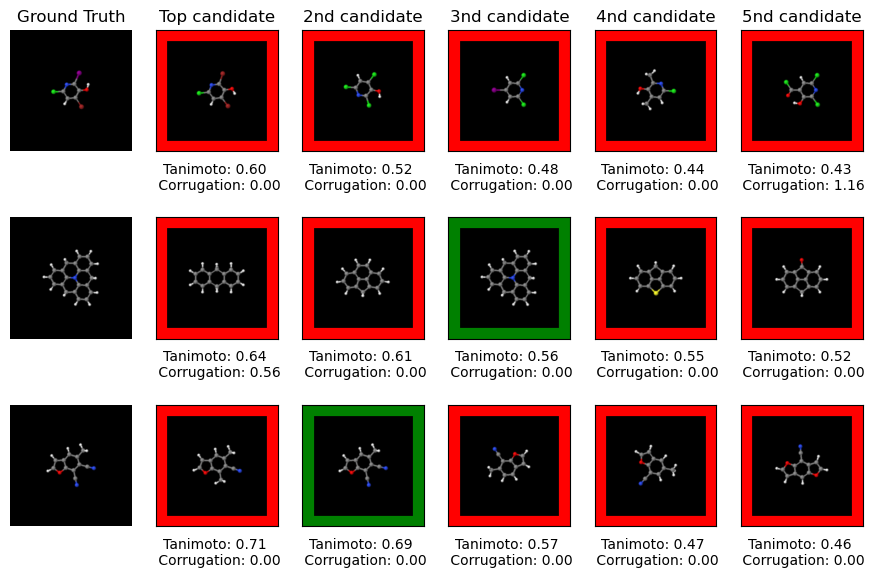

In [19]:

molec_path_array=[ '/scratch/dataset/quam/K-1/Conformer3D_CID_53485459_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_59271172_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_129148936_K040_Amp040']
n_results = 3
titles = ['Ground Truth', 'Top candidate', '2nd candidate', '3nd candidate', '4nd candidate', '5nd candidate',]
fig, ax = plt.subplots(3, 6, figsize=(11, n_results*2.3))  # Adjust figsize according to your needs

for i, molec_path in enumerate(molec_path_array):
    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)
    true_CID = _extract_cid(molec_path)
    gt_jmol = load_jmol_image(true_CID, dimension=[224,224], zoom=1)
    print(molec_path)
    print(true_CID)
    CID_list =  [CID for CID in output_df['CID']]
    tanimoto_list =  [tanimoto for tanimoto in output_df['tanimoto']]
    corrugation_list =  [corrugation for corrugation in output_df['corrugation']]

    pred_jmol_list =  [load_jmol_image(CID, dimension=[224,224], zoom=1) for CID in output_df['CID']]
    
    ax[i,0].imshow(gt_jmol, cmap='gray')
    ax[i,0].axis('off')
    
    for j in range(1,len(pred_jmol_list)+1):
        ax[i,j].imshow(pred_jmol_list[j-1], cmap='gray')
        ax[i,j].axis('off')
        
        if true_CID == CID_list[j-1]:
            color = 'green'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        else:
            color = 'red'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        
        ax[i,j].add_patch(rect)
        ax[i,j].axis('on')
        ax[i,j].set_xlabel(f'Tanimoto: {tanimoto_list[j-1]:.2f} \n Corrugation: {corrugation_list[j-1]:.2f}', fontsize=10)  # Adjust fontsize according to your needs
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])
    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])
        
plt.show()

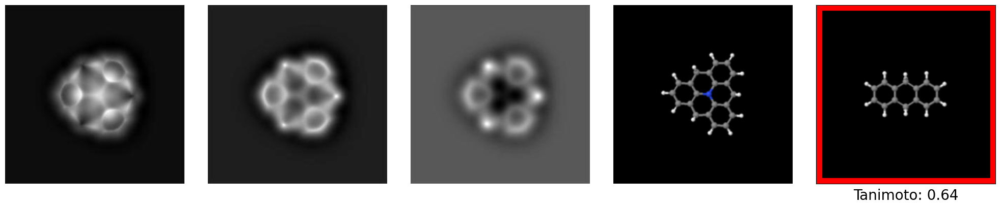

11940


In [21]:
molec_path = '/scratch/dataset/quam/K-1/Conformer3D_CID_59271172_K040_Amp040'
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=1)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)
print(pred_CID)

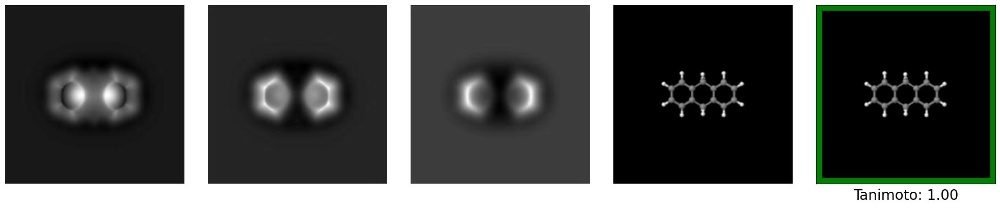

11940


In [22]:
molec_path = '/scratch/dataset/quam/K-1/Conformer3D_CID_11940_K040_Amp040'
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=1)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)
print(pred_CID)

In [35]:
true_output_df[true_output_df['CID']==129814712]

,path,CID,SMILES,morgan_fp,split,corrugation,tanimoto
24748,/scratch/dataset/quam/K-2/Conformer3D_CID_1298...,129814712,C1C2=CC=CC=C2C(=C1C=O)C=O,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0014,0.307692


/scratch/dataset/quam/K-1/Conformer3D_CID_2723853_K040_Amp040
2723853
/scratch/dataset/quam/K-1/Conformer3D_CID_69851150_K040_Amp040
69851150
/scratch/dataset/quam/K-1/Conformer3D_CID_21815311_K040_Amp040
21815311


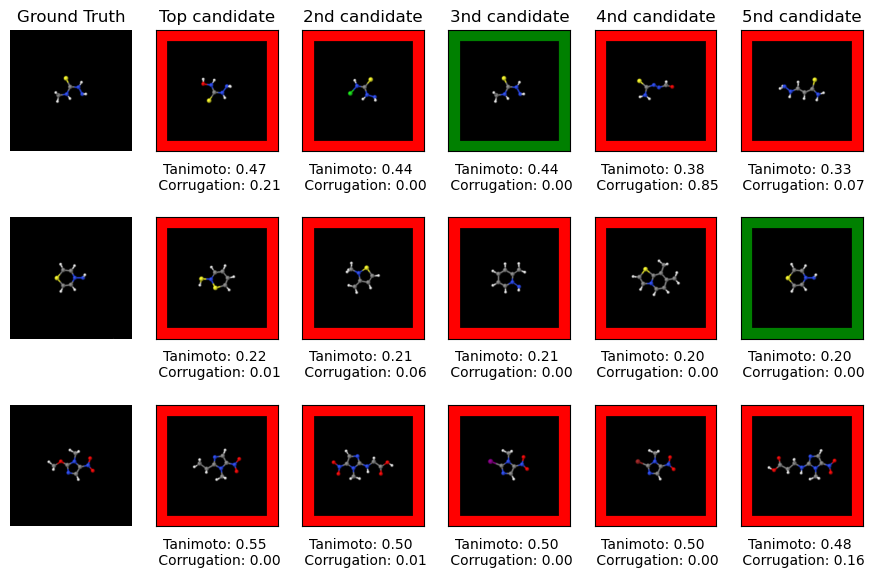

In [23]:

molec_path_array=[ '/scratch/dataset/quam/K-1/Conformer3D_CID_2723853_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_69851150_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_21815311_K040_Amp040']
n_results = 3
titles = ['Ground Truth', 'Top candidate', '2nd candidate', '3nd candidate', '4nd candidate', '5nd candidate',]
fig, ax = plt.subplots(3, 6, figsize=(11, n_results*2.3))  # Adjust figsize according to your needs

for i, molec_path in enumerate(molec_path_array):
    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)
    true_CID = _extract_cid(molec_path)
    gt_jmol = load_jmol_image(true_CID, dimension=[224,224], zoom=1)
    print(molec_path)
    print(true_CID)
    CID_list =  [CID for CID in output_df['CID']]
    tanimoto_list =  [tanimoto for tanimoto in output_df['tanimoto']]
    corrugation_list =  [corrugation for corrugation in output_df['corrugation']]

    pred_jmol_list =  [load_jmol_image(CID, dimension=[224,224], zoom=1) for CID in output_df['CID']]
    
    ax[i,0].imshow(gt_jmol, cmap='gray')
    ax[i,0].axis('off')
    
    for j in range(1,len(pred_jmol_list)+1):
        ax[i,j].imshow(pred_jmol_list[j-1], cmap='gray')
        ax[i,j].axis('off')
        
        if true_CID == CID_list[j-1]:
            color = 'green'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        else:
            color = 'red'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        
        ax[i,j].add_patch(rect)
        ax[i,j].axis('on')
        ax[i,j].set_xlabel(f'Tanimoto: {tanimoto_list[j-1]:.2f} \n Corrugation: {corrugation_list[j-1]:.2f}', fontsize=10)  # Adjust fontsize according to your needs
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])
    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])
        
plt.show()

In [22]:
true_CID = 53440517 
molec_path = test_df['path'][test_df['CID']==true_CID].values[0]
#molec_path = f'/scratch/dataset/quam/K-1/Conformer3D_CID_{true_CID}_K040_Amp040'
fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)
print('Total number of fingerprints', np.sum(fp_pred))

output_df = fp_screening_function(fp_pred, test_df.iloc[:54680], top_k = 5)

print('Is the correct CID in the top k candidates?',  true_CID in list(output_df['CID']))
print('Is the correct CID the first candidate?',  true_CID == output_df['CID'].iloc[0])
output_df

Total number of fingerprints 14
Is the correct CID in the top k candidates? False
Is the correct CID the first candidate? False


,path,CID,SMILES,morgan_fp,split,corrugation,tanimoto
4215,/scratch/dataset/quam/K-1/Conformer3D_CID_1238...,123878232,C1=CC(=CC=C=C1)C=O,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0051,0.206897
30092,/scratch/dataset/quam/K-2/Conformer3D_CID_1235...,123568991,C1=CC=C2C=CC=C=CC2=C=C1,"[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0241,0.187500
12536,/scratch/dataset/quam/K-1/Conformer3D_CID_6020...,60205840,C1=CC=C2C=CC=CN2C=C1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0020,0.185185
23404,/scratch/dataset/quam/K-1/Conformer3D_CID_1339...,13395677,CC1=CC=CC=C=C1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0007,0.185185
13693,/scratch/dataset/quam/K-1/Conformer3D_CID_1236...,123690939,CC1=CC(=C=CC=C1)C,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0075,0.178571


In [21]:
molec_path.values[0]

'/scratch/dataset/quam/K-2/Conformer3D_CID_53440517_K040_Amp060'

In [34]:
print(pred_atom_count[13])
print(test_df.iloc[13])

[8. 0. 0. 0. 0. 0. 2. 0. 1. 8.]
path           /scratch/dataset/quam/K-1/Conformer3D_CID_1297...
CID                                                    129712445
SMILES                                    CC1=C(C=CC(=C1)C=S=O)O
morgan_fp      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
split                                                       test
corrugation                                               0.0004
C                                                            8.0
Br                                                           0.0
Cl                                                           0.0
F                                                            0.0
I                                                            0.0
N                                                            0.0
O                                                            2.0
P                                                            0.0
S                                                         

#### Check regression errors


In [28]:


data_path = f'/home/{USER}/CODE/Pytorch-fingerprints/calculations/pred_atom_count_regression_w_H.gz'
with open(data_path, 'rb') as handle:
    pred_atom_count = pickle.load(handle)
cid_pred_atom_count = dict(zip(list(test_df['CID']), pred_atom_count))


In [39]:
molec_path_array=[ '/scratch/dataset/quam/K-1/Conformer3D_CID_2723853_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_69851150_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_21815311_K040_Amp040']
for path in molec_path_array:
    print(_extract_cid(path))

2723853
69851150
21815311


/scratch/dataset/quam/K-1/Conformer3D_CID_54312962_K040_Amp040
54312962
/scratch/dataset/quam/K-1/Conformer3D_CID_59271172_K040_Amp040
59271172
/scratch/dataset/quam/K-1/Conformer3D_CID_129148936_K040_Amp040
129148936


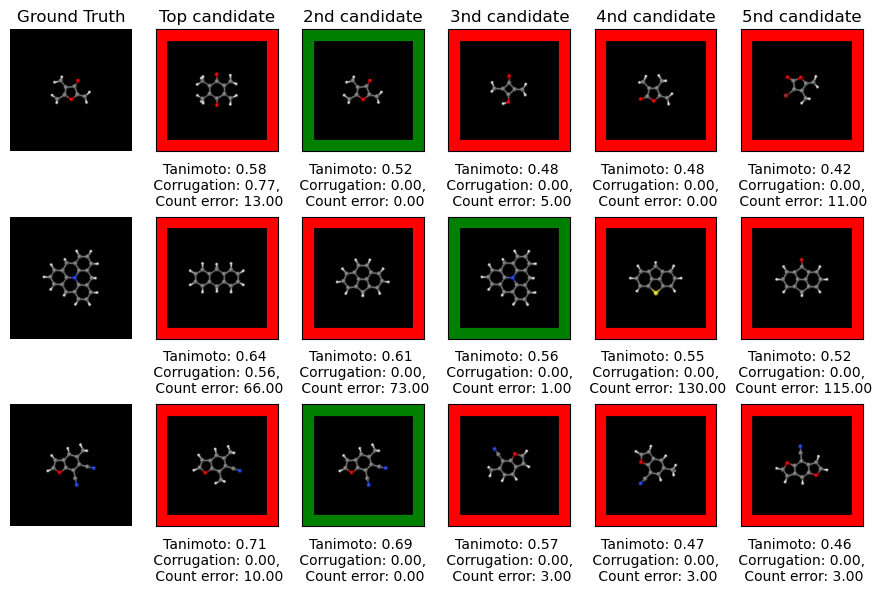

In [45]:

molec_path_array=[ '/scratch/dataset/quam/K-1/Conformer3D_CID_54312962_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_59271172_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_129148936_K040_Amp040']
n_results = 3
titles = ['Ground Truth', 'Top candidate', '2nd candidate', '3nd candidate', '4nd candidate', '5nd candidate',]
fig, ax = plt.subplots(3, 6, figsize=(11, n_results*2.3))  # Adjust figsize according to your needs

for i, molec_path in enumerate(molec_path_array):
    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)
    true_CID = _extract_cid(molec_path)
    gt_jmol = load_jmol_image(true_CID, dimension=[224,224], zoom=1)
    print(molec_path)
    print(true_CID)
    CID_list =  [CID for CID in output_df['CID']]
    tanimoto_list =  [tanimoto for tanimoto in output_df['tanimoto']]
    corrugation_list =  [corrugation for corrugation in output_df['corrugation']]

    pred_jmol_list =  [load_jmol_image(CID, dimension=[224,224], zoom=1) for CID in output_df['CID']]
    
    ## Regression
    pred_count = cid_pred_atom_count[true_CID]
    atom_count_ref = output_df.iloc[:][['C', 'Br', 'Cl', 'F', 'I', 'N', 'O', 'P', 'S', 'H']].to_numpy()
    diff = ((pred_count - atom_count_ref)**2).sum(axis=1)
    ax[i,0].imshow(gt_jmol, cmap='gray')
    ax[i,0].axis('off')
    
    for j in range(1,len(pred_jmol_list)+1):
        ax[i,j].imshow(pred_jmol_list[j-1], cmap='gray')
        ax[i,j].axis('off')
        
        if true_CID == CID_list[j-1]:
            color = 'green'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        else:
            color = 'red'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        
        ax[i,j].add_patch(rect)
        ax[i,j].axis('on')
        ax[i,j].set_xlabel(f'Tanimoto: {tanimoto_list[j-1]:.2f} \n Corrugation: {corrugation_list[j-1]:.2f}, \n Count error: {diff[j-1]:.2f}', fontsize=10)  # Adjust fontsize according to your needs
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])
    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])
        
plt.show()

/scratch/dataset/quam/K-1/Conformer3D_CID_2723853_K040_Amp040
2723853
/scratch/dataset/quam/K-1/Conformer3D_CID_137025559_K040_Amp040
137025559
/scratch/dataset/quam/K-1/Conformer3D_CID_2723870_K040_Amp040
2723870


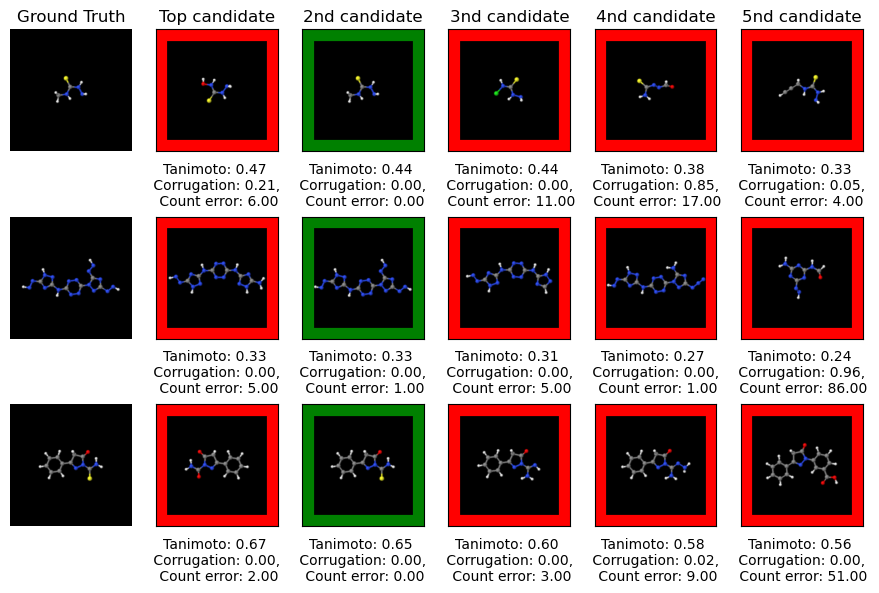

In [50]:
molec_path_array=[ '/scratch/dataset/quam/K-1/Conformer3D_CID_2723853_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_137025559_K040_Amp040',
                 '/scratch/dataset/quam/K-1/Conformer3D_CID_2723870_K040_Amp040']
n_results = 3
titles = ['Ground Truth', 'Top candidate', '2nd candidate', '3nd candidate', '4nd candidate', '5nd candidate',]
fig, ax = plt.subplots(3, 6, figsize=(11, n_results*2.3))  # Adjust figsize according to your needs

for i, molec_path in enumerate(molec_path_array):
    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)
    true_CID = _extract_cid(molec_path)
    gt_jmol = load_jmol_image(true_CID, dimension=[224,224], zoom=1)
    print(molec_path)
    print(true_CID)
    CID_list =  [CID for CID in output_df['CID']]
    tanimoto_list =  [tanimoto for tanimoto in output_df['tanimoto']]
    corrugation_list =  [corrugation for corrugation in output_df['corrugation']]

    pred_jmol_list =  [load_jmol_image(CID, dimension=[224,224], zoom=1) for CID in output_df['CID']]
    
    ## Regression
    pred_count = cid_pred_atom_count[true_CID]
    atom_count_ref = output_df.iloc[:][['C', 'Br', 'Cl', 'F', 'I', 'N', 'O', 'P', 'S', 'H']].to_numpy()
    diff = ((pred_count - atom_count_ref)**2).sum(axis=1)
    ax[i,0].imshow(gt_jmol, cmap='gray')
    ax[i,0].axis('off')
    
    for j in range(1,len(pred_jmol_list)+1):
        ax[i,j].imshow(pred_jmol_list[j-1], cmap='gray')
        ax[i,j].axis('off')
        
        if true_CID == CID_list[j-1]:
            color = 'green'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        else:
            color = 'red'
            rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        
        ax[i,j].add_patch(rect)
        ax[i,j].axis('on')
        ax[i,j].set_xlabel(f'Tanimoto: {tanimoto_list[j-1]:.2f} \n Corrugation: {corrugation_list[j-1]:.2f}, \n Count error: {diff[j-1]:.2f}', fontsize=10)  # Adjust fontsize according to your needs
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])
    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])
        
plt.show()

In [ ]:
cid_list = [129857610, 89053264, 12413010, 85989461, 11788376, 
            123908185, 86251611, 6477917, 129087581, 22808670, 
            130347104, 130312287, 123355235, 123873380, 22976615, 
            54028393, 23287913, 53635178, 135897203, 130115701, 602238, 
            123744385, 90245, 5363845, 54493317, 22280331, 450706, 123032, 
            59330717, 536741, 123551914, 123654315, 132081836, 126501037, 
            131883183, 53852335, 22716, 129792189, 135829698, 13217988, 
            10442, 22716619, 21590228, 54118620, 78046, 134854885, 130511077, 
            12761319, 13134054, 129865963, 358639, 12761330, 123236601, 13758715, 
            12781822, 135993598, 21954828, 12669197, 51034385, 5384468, 22805,
            129853718, 117696794, 123668766, 59898143, 596263, 135082282, 
            58800428, 129804591, 58800433, 54014259, 13766967, 89526585, 
            129833273, 13228348, 129712445, 6431039, 53838146]
n_results = 3

for j in range(int(len(cid_list)/n_results)):
    molec_path_array=[ f'/scratch/dataset/quam/K-1/Conformer3D_CID_{cid}_K040_Amp040' for cid in cid_list[j*3:j*3+3]]


    titles = ['Ground Truth', 'Top candidate', '2nd candidate', '3nd candidate', '4nd candidate', '5nd candidate',]
    fig, ax = plt.subplots(3, 6, figsize=(11, n_results*2.3))  # Adjust figsize according to your needs

    for i, molec_path in enumerate(molec_path_array):
        fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

        output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)
        true_CID = _extract_cid(molec_path)
        gt_jmol = load_jmol_image(true_CID, dimension=[224,224], zoom=1)
        CID_list =  [CID for CID in output_df['CID']]
        tanimoto_list =  [tanimoto for tanimoto in output_df['tanimoto']]
        corrugation_list =  [corrugation for corrugation in output_df['corrugation']]

        pred_jmol_list =  [load_jmol_image(CID, dimension=[224,224], zoom=1) for CID in output_df['CID']]

        ## Regression
        pred_count = cid_pred_atom_count[true_CID]
        atom_count_ref = output_df.iloc[:][['C', 'Br', 'Cl', 'F', 'I', 'N', 'O', 'P', 'S', 'H']].to_numpy()
        diff = ((pred_count - atom_count_ref)**2).sum(axis=1)
        ax[i,0].imshow(gt_jmol, cmap='gray')
        ax[i,0].set_xlabel(f'CID: {true_CID} ', fontsize=10)  # Adjust fontsize according to your needs

        ax[i,0].set_xticks([])
        ax[i,0].set_yticks([])

        for j in range(1,len(pred_jmol_list)+1):
            ax[i,j].imshow(pred_jmol_list[j-1], cmap='gray')
            ax[i,j].axis('off')

            if true_CID == CID_list[j-1]:
                color = 'green'
                rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
            else:
                color = 'red'
                rect = patches.Rectangle((0, 0), gt_jmol.shape[1], gt_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

            ax[i,j].add_patch(rect)
            ax[i,j].axis('on')
            ax[i,j].set_xlabel(f'Tanimoto: {tanimoto_list[j-1]:.2f} \n Corrugation: {corrugation_list[j-1]:.2f}, \n Count error: {diff[j-1]:.2f}', fontsize=10)  # Adjust fontsize according to your needs
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
        # Setting titles for each column
        if i == 0:
            for j in range(len(titles)):
                ax[i,j].set_title(titles[j])

    plt.show()

### Check tanimoto at different zooms

In [12]:

condition = (dataset_df['C'] < 24) & (dataset_df['C'] > 5) & (dataset_df['I'] == 1)  & (dataset_df[['Br', 'Cl', 'F', 'N', 'P', 'S', 'O']].sum(axis=1) == 0)
selection = dataset_df[condition].sort_values('C', axis=0)
len(selection)

52

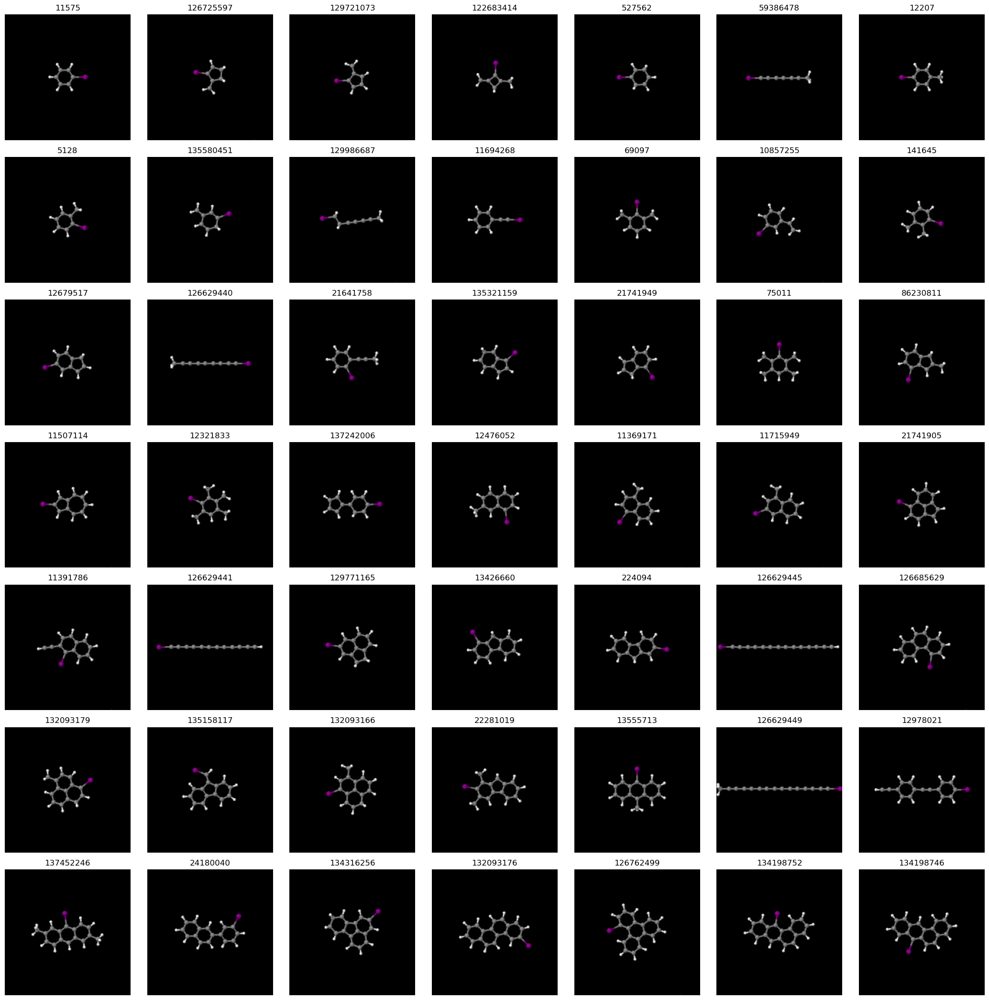

In [13]:
## Let's pick a molecule close to 2-iodotriphenylene


def plot_jmol_grid(cids, n=7, dimension=[224,224], zoom=1):
    fig, axs = plt.subplots(n, n, figsize=(n*3, n*3))

    for i, cid in enumerate(cids):
        row = i // n
        col = i % n
        try:
            jmol_image_array = load_jmol_image(cid, dimension, zoom)
            axs[row, col].imshow(jmol_image_array)
            axs[row, col].axis('off')  # to hide axis
            axs[row, col].set_title(cid)  # set the CID as the title
        except Exception as e:
            print(f'Failed to load image for CID {cid}. Error: {e}')

    # If there are fewer images than grid size, remove empty subplots
    if len(cids) < n*n:
        for i in range(len(cids), n*n):
            row = i // n
            col = i % n
            fig.delaxes(axs[row][col])

    plt.tight_layout()
    plt.show()

    
cid_list = selection['CID'].iloc[:49]    
plot_jmol_grid(cid_list, n=7)

In [14]:
morgan_fp = dataset_df[dataset_df['CID']==21741905]['morgan_fp'].to_numpy()[0]
morgan_fp

array([0, 0, 0, ..., 0, 0, 0])

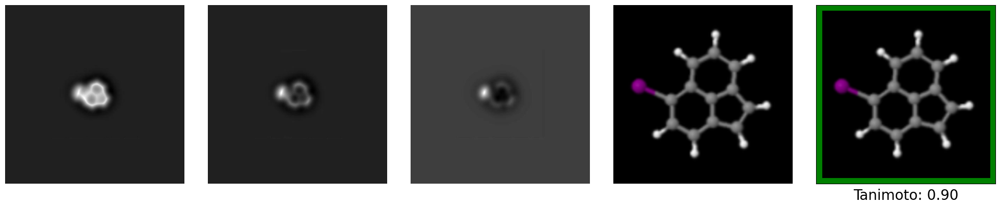

21741905


In [6]:
## Usamos el 5-Iodoacenaphthylene 21741905
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_21741905_K100_Amp140'
molec_path = path
img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=0.5)
plot_images(img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto)
print(pred_CID)

In [73]:
## 5-Iodoacenaphthylene

path = '/scratch/dataset/quam/K-24/Conformer3D_CID_21741905_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==21741905]['morgan_fp'].to_numpy()[0]

for zoom in np.linspace(0.5, 2.5, 20):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    with torch.no_grad():
        batched_tensor = exp_img.unsqueeze(dim = 0).to(device)

        predictions = model(batched_tensor)

        fp_pred = (torch.sigmoid(predictions) > 0.5)


    exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
    
    gt_fp = morgan_fp
    print('zoom:', zoom, 'tanimoto', np.round(tanimoto_numpy(exp_fp.squeeze(), gt_fp), 2))

zoom: 0.5 tanimoto 0.9
zoom: 0.6052631578947368 tanimoto 0.9
zoom: 0.7105263157894737 tanimoto 0.9
zoom: 0.8157894736842105 tanimoto 0.9
zoom: 0.9210526315789473 tanimoto 0.9
zoom: 1.026315789473684 tanimoto 0.9
zoom: 1.131578947368421 tanimoto 0.9
zoom: 1.236842105263158 tanimoto 0.9
zoom: 1.3421052631578947 tanimoto 0.9
zoom: 1.4473684210526314 tanimoto 0.95
zoom: 1.5526315789473684 tanimoto 0.95
zoom: 1.6578947368421053 tanimoto 0.9
zoom: 1.763157894736842 tanimoto 0.95
zoom: 1.8684210526315788 tanimoto 0.95
zoom: 1.9736842105263157 tanimoto 0.95
zoom: 2.0789473684210527 tanimoto 0.95
zoom: 2.1842105263157894 tanimoto 0.9
zoom: 2.289473684210526 tanimoto 0.81
zoom: 2.394736842105263 tanimoto 0.68
zoom: 2.5 tanimoto 0.64


/scratch/dataset/quam/K-24/Conformer3D_CID_21741905_K100_Amp140
21741905 21741905
/scratch/dataset/quam/K-24/Conformer3D_CID_21741905_K100_Amp140
21741905 21741905
/scratch/dataset/quam/K-24/Conformer3D_CID_21741905_K100_Amp140
21741905 21741905


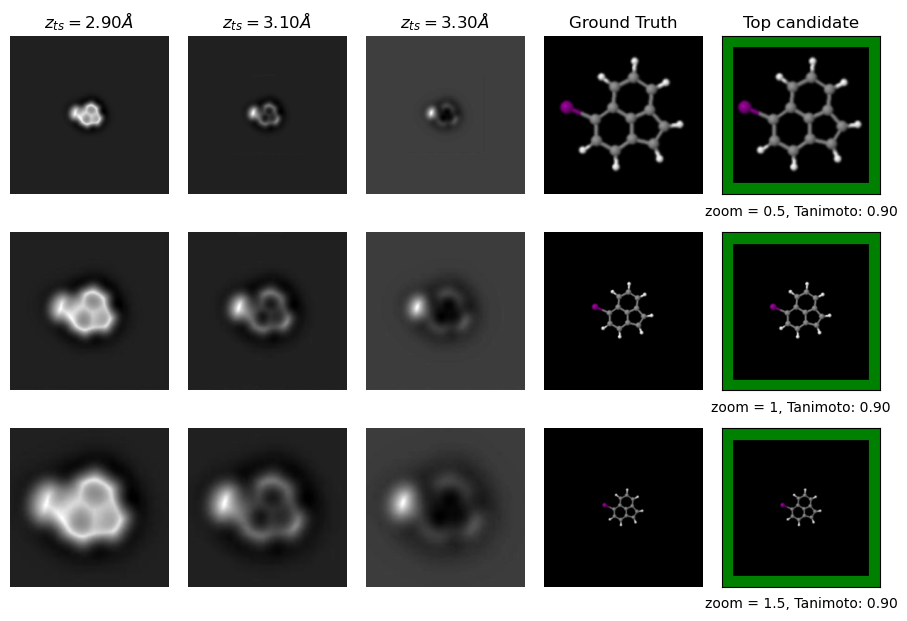

In [9]:
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_21741905_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==21741905]['morgan_fp'].to_numpy()[0]
n_results=3
#paths = list(selected_rows.iloc[2:n_results+2]['path'])
molec_path = path
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i, zoom in enumerate([0.5, 1, 1.5]):
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, tanimoto = run_prediction(molec_path, dimension=[224,224], zoom=zoom)
    print(true_CID, pred_CID)
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'zoom = {zoom}, Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.show()

In [10]:
dataset_df

,path,CID,SMILES,morgan_fp,split,corrugation,C,Br,Cl,F,I,N,O,P,S,H
1,/scratch/dataset/quam/K-1/Conformer3D_CID_1000...,10001048,C1=CC=C2C=C3C(=CC2=C1)NC(=N3)C4=CC5=C(C=C4)N=C...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,1.1767,25.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,16.0
7,/scratch/dataset/quam/K-1/Conformer3D_CID_1000...,10005,C(#N)N=C(N)N,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0002,2.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,4.0
14,/scratch/dataset/quam/K-1/Conformer3D_CID_1001...,100128716,CC1=C(C2=NC(=CC(=C2C=C1)NCCCN)C)C,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0110,15.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,21.0
15,/scratch/dataset/quam/K-1/Conformer3D_CID_1001...,100175925,COC(=O)CSC1=NN=C(S1)NC(=O)C2=CC=CO2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0530,10.0,0.0,0.0,0.0,0.0,3.0,4.0,0.0,2.0,9.0
16,/scratch/dataset/quam/K-1/Conformer3D_CID_1001...,100197007,COC(=O)CSC1=NN=C(S1)NC(=O)C2=CC3=C(O2)C=CC4=CC...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0856,18.0,0.0,0.0,0.0,0.0,3.0,4.0,0.0,2.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579897,/scratch/dataset/quam/K-1/Conformer3D_CID_1376...,13762891,C1=CC(=CC=C1C(=O)CCC(=O)C2=CC=C(C=C2)[N+](=O)[...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.1397,16.0,0.0,0.0,0.0,0.0,2.0,6.0,0.0,0.0,12.0
579900,/scratch/dataset/quam/K-1/Conformer3D_CID_3410...,341027,C1OC2=C(O1)C(=O)C3=C(C2=O)C=CC(=C3)O,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0035,11.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,6.0
579902,/scratch/dataset/quam/K-1/Conformer3D_CID_5392...,53921077,C1=CC(=CC=C1C=N)N,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0008,7.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,8.0
579903,/scratch/dataset/quam/K-1/Conformer3D_CID_8238...,82382131,CC1=C2C=C(NC2=CC=C1)C3=NN=CC(=C3)C(=O)O,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0034,14.0,0.0,0.0,0.0,0.0,3.0,2.0,0.0,0.0,11.0


10001048 10001048
0.68
10001048 10001048
0.85
10001048 10001048
0.56


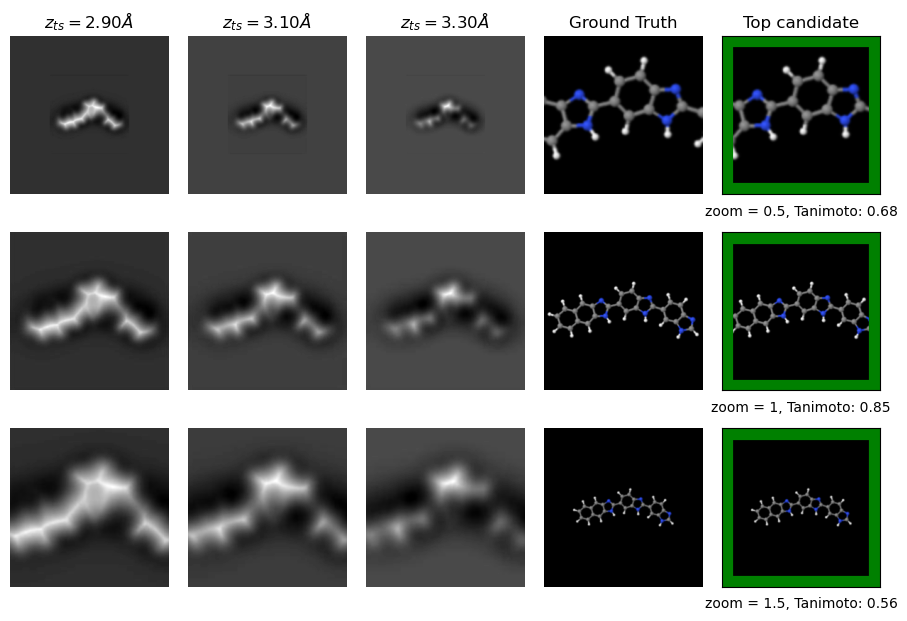

In [12]:
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_10001048_K100_Amp140'

#paths = list(selected_rows.iloc[2:n_results+2]['path'])
molec_path = path
morgan_fp = dataset_df[dataset_df['CID']==10001048]['morgan_fp'].to_numpy()[0]

titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate']
fig, ax = plt.subplots(n_results, 5, figsize=(9, n_results*2.1))  # Adjust figsize according to your needs
for i, zoom in enumerate([0.5, 1, 1.5]):
    
    
    img_1, img_3, img_5, gt_jmol, pred_jmol, true_CID, pred_CID, _ = run_prediction(molec_path, dimension=[224,224], zoom=zoom)
    
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    with torch.no_grad():
        batched_tensor = exp_img.unsqueeze(dim = 0).to(device)

        predictions = model(batched_tensor)

        fp_pred = (torch.sigmoid(predictions) > 0.5)


    exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
    
    gt_fp = morgan_fp
    tanimoto = np.round(tanimoto_numpy(exp_fp.squeeze(), gt_fp), 2)
    
    print(true_CID, pred_CID)
    print(tanimoto)
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(pred_jmol)
    


    if true_CID == pred_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), pred_jmol.shape[1], pred_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,4].set_xlabel(f'zoom = {zoom}, Tanimoto: {tanimoto:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(5):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.show()

In [76]:
## Tenemos el 1-Iodotriphenylene, que curioso. CID: 126762499
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_10001048_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==10001048]['morgan_fp'].to_numpy()[0]

for zoom in np.linspace(0.5, 2.5, 20):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    with torch.no_grad():
        batched_tensor = exp_img.unsqueeze(dim = 0).to(device)

        predictions = model(batched_tensor)

        fp_pred = (torch.sigmoid(predictions) > 0.5)


    exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
    
    gt_fp = morgan_fp
    print('zoom:', zoom, 'tanimoto', np.round(tanimoto_numpy(exp_fp.squeeze(), gt_fp), 2))

zoom: 0.5 tanimoto 0.68
zoom: 0.6052631578947368 tanimoto 0.77
zoom: 0.7105263157894737 tanimoto 0.87
zoom: 0.8157894736842105 tanimoto 0.87
zoom: 0.9210526315789473 tanimoto 0.87
zoom: 1.026315789473684 tanimoto 0.79
zoom: 1.131578947368421 tanimoto 0.72
zoom: 1.236842105263158 tanimoto 0.8
zoom: 1.3421052631578947 tanimoto 0.66
zoom: 1.4473684210526314 tanimoto 0.57
zoom: 1.5526315789473684 tanimoto 0.59
zoom: 1.6578947368421053 tanimoto 0.5
zoom: 1.763157894736842 tanimoto 0.57
zoom: 1.8684210526315788 tanimoto 0.52
zoom: 1.9736842105263157 tanimoto 0.57
zoom: 2.0789473684210527 tanimoto 0.61
zoom: 2.1842105263157894 tanimoto 0.43
zoom: 2.289473684210526 tanimoto 0.21
zoom: 2.394736842105263 tanimoto 0.23
zoom: 2.5 tanimoto 0.2


### Now we perform interpolation with the images


In [7]:
def plot_images(images):
    # Set up the figure and axes
    fig, axs = plt.subplots(2, 5, figsize=(15, 6))
    axs = axs.ravel()  # Flatten the 2D array of axes into 1D for easier indexing

    # Plot each image in its own subplot
    for i in range(images.shape[0]):
        axs[i].imshow(images[i], cmap='gray')  # Use grayscale color map
        axs[i].axis('off')  # Hide the axes

    # Show the plot
    plt.tight_layout()
    plt.show()
    
def interpolate_images(images, output_size):
    # Reshape from [num_images, height, width] to [batch_size, num_channels, depth, height, width]
    images = images.unsqueeze(0).unsqueeze(0)

    # Interpolate to the desired size
    interpolated_images = F.interpolate(images, size=[output_size, images.shape[3], images.shape[4]], mode='trilinear', align_corners=True)

    # Reshape from [batch_size, num_channels, num_images, height, width] back to [num_images, height, width]
    interpolated_images = interpolated_images.squeeze(0).squeeze(0)

    return interpolated_images

In [8]:
def interpolate_images(images, in_slices = [0,1,2,3,4,5,6,7,8,9], out_slices=[0,1,2,3,4,5,6,7,8,9]):
    # Convert the PyTorch tensor to a NumPy array
    images_np = images.numpy()

    # Define the coordinates of the known data points
    z = in_slices                      # depth
    x = np.arange(images_np.shape[1])  # height
    y = np.arange(images_np.shape[2])  # width

    # Define the coordinates of the points to interpolate
    zi, xi, yi = np.meshgrid(out_slices, x, y, indexing='ij')

    # Perform the interpolation
    interp = RegularGridInterpolator((z, x, y), images_np, method="linear", fill_value=None, bounds_error=False)
    interpolated_images_np = interp((zi, xi, yi))

    # Convert the interpolated images back to a PyTorch tensor
    interpolated_images = torch.from_numpy(interpolated_images_np).type(torch.FloatTensor)

    return interpolated_images
    

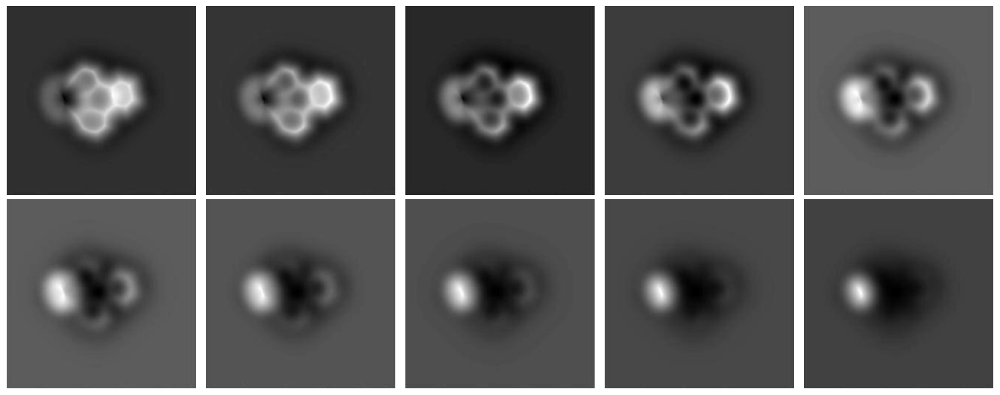

In [78]:
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_126762499_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==126762499]['morgan_fp'].to_numpy()[0]

exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)

plot_images(exp_img)

5

Missing slices


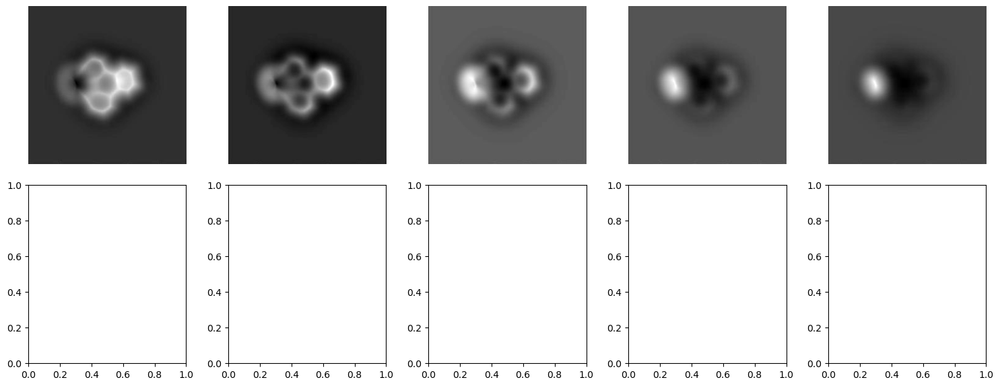

Interpolated image


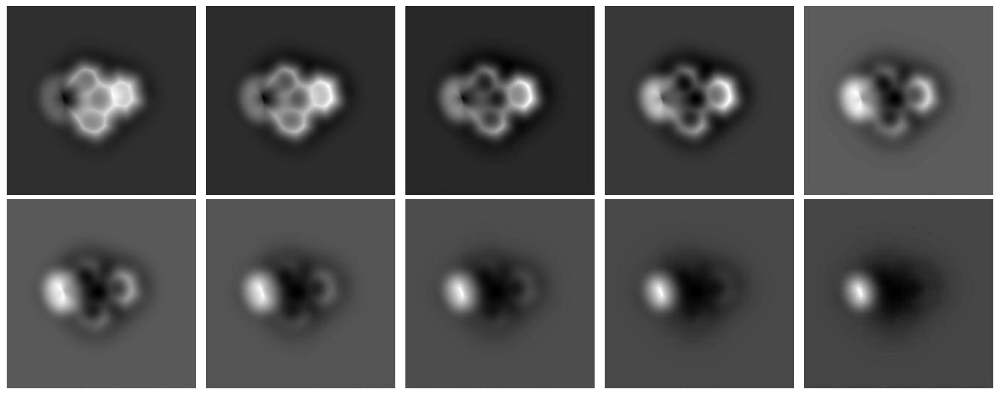

Original image


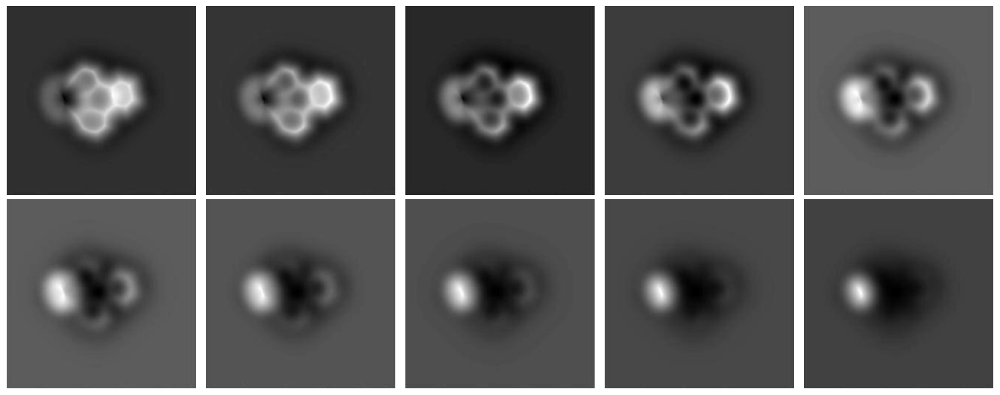

In [79]:
in_slices = [0,2,4,6,8]
missing_slices = exp_img[in_slices,:,:]
print('Missing slices')
plot_images(missing_slices)
interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
print('Interpolated image')
plot_images(interpolated_slices)
print('Original image')
plot_images(exp_img)

In [80]:
## Probamos el  1-Iodotriphenylene, interpolado. CID: 126762499
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_126762499_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==126762499]['morgan_fp'].to_numpy()[0]
in_slices = [0,2,4,6,8]
print(f'Slices used for interpolation: {in_slices}')
for zoom in np.linspace(0.5, 2.5, 20):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    missing_slices = exp_img[in_slices,:,:]
    interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
    with torch.no_grad():
        batched_tensor = interpolated_slices.unsqueeze(dim = 0).to(device)

        predictions = model(batched_tensor)

        fp_pred = (torch.sigmoid(predictions) > 0.5)


    exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
    
    gt_fp = morgan_fp
    print('zoom:', zoom, 'tanimoto', np.round(tanimoto_numpy(exp_fp.squeeze(), gt_fp), 2))

Slices used for interpolation: [0, 2, 4, 6, 8]
zoom: 0.5 tanimoto 0.48
zoom: 0.6052631578947368 tanimoto 0.42
zoom: 0.7105263157894737 tanimoto 0.37
zoom: 0.8157894736842105 tanimoto 0.34
zoom: 0.9210526315789473 tanimoto 0.35
zoom: 1.026315789473684 tanimoto 0.33
zoom: 1.131578947368421 tanimoto 0.32
zoom: 1.236842105263158 tanimoto 0.31
zoom: 1.3421052631578947 tanimoto 0.31
zoom: 1.4473684210526314 tanimoto 0.33
zoom: 1.5526315789473684 tanimoto 0.37
zoom: 1.6578947368421053 tanimoto 0.39
zoom: 1.763157894736842 tanimoto 0.48
zoom: 1.8684210526315788 tanimoto 0.44
zoom: 1.9736842105263157 tanimoto 0.48
zoom: 2.0789473684210527 tanimoto 0.41
zoom: 2.1842105263157894 tanimoto 0.39
zoom: 2.289473684210526 tanimoto 0.44
zoom: 2.394736842105263 tanimoto 0.37
zoom: 2.5 tanimoto 0.22


In [81]:
## 5-Iodoacenaphthylene

path = '/scratch/dataset/quam/K-24/Conformer3D_CID_21741905_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==21741905]['morgan_fp'].to_numpy()[0]
in_slices = [0,2,4,6,8]
print(f'Slices used for interpolation: {in_slices}')
for zoom in np.linspace(0.5, 2.5, 20):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    missing_slices = exp_img[in_slices,:,:]
    interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
    with torch.no_grad():
        batched_tensor = interpolated_slices.unsqueeze(dim = 0).to(device)

        predictions = model(batched_tensor)

        fp_pred = (torch.sigmoid(predictions) > 0.5)


    exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
    
    gt_fp = morgan_fp
    print('zoom:', zoom, 'tanimoto', np.round(tanimoto_numpy(exp_fp.squeeze(), gt_fp), 2))

Slices used for interpolation: [0, 2, 4, 6, 8]
zoom: 0.5 tanimoto 0.9
zoom: 0.6052631578947368 tanimoto 0.9
zoom: 0.7105263157894737 tanimoto 0.9
zoom: 0.8157894736842105 tanimoto 0.9
zoom: 0.9210526315789473 tanimoto 0.9
zoom: 1.026315789473684 tanimoto 0.9
zoom: 1.131578947368421 tanimoto 0.9
zoom: 1.236842105263158 tanimoto 0.9
zoom: 1.3421052631578947 tanimoto 0.9
zoom: 1.4473684210526314 tanimoto 0.9
zoom: 1.5526315789473684 tanimoto 0.9
zoom: 1.6578947368421053 tanimoto 0.9
zoom: 1.763157894736842 tanimoto 0.9
zoom: 1.8684210526315788 tanimoto 0.95
zoom: 1.9736842105263157 tanimoto 0.95
zoom: 2.0789473684210527 tanimoto 0.95
zoom: 2.1842105263157894 tanimoto 0.95
zoom: 2.289473684210526 tanimoto 0.81
zoom: 2.394736842105263 tanimoto 0.73
zoom: 2.5 tanimoto 0.68


Missing slices


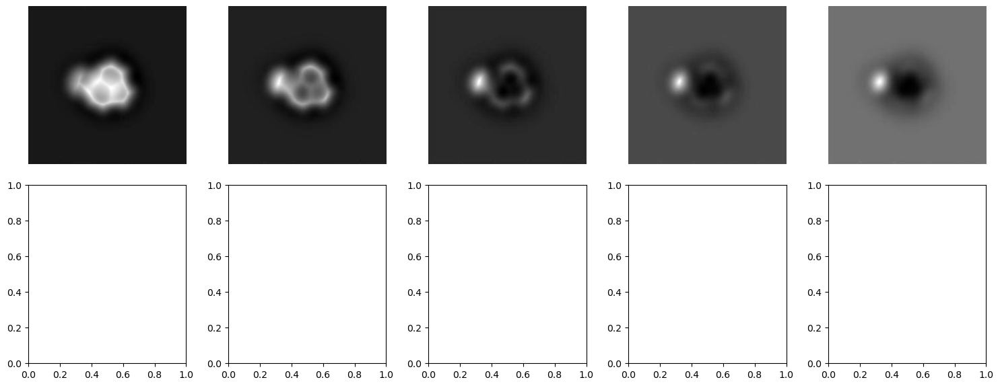

Interpolated image


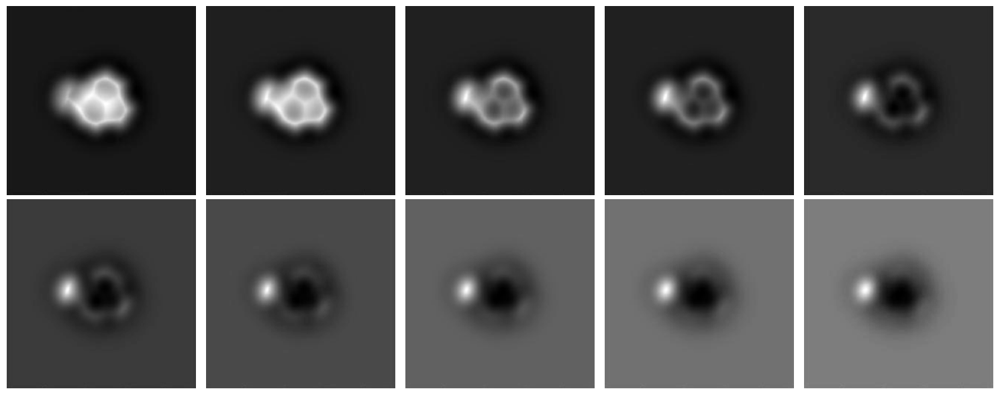

Original image


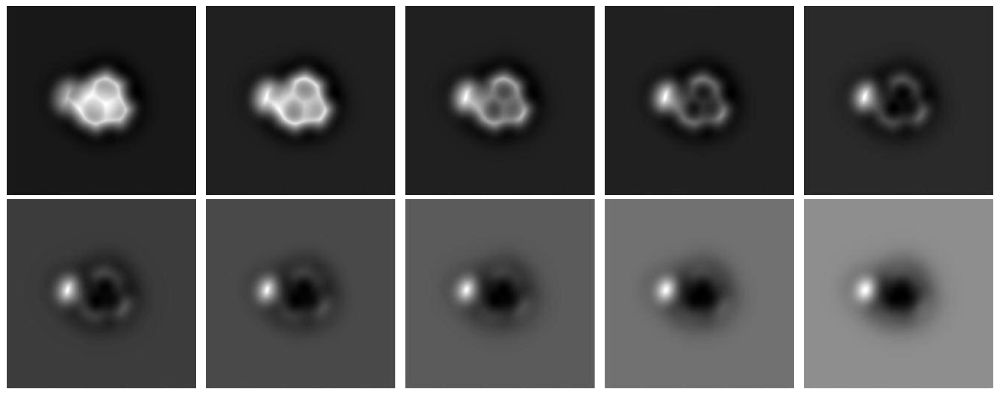

In [75]:
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)

in_slices = [0,2,4,6,8]
missing_slices = exp_img[in_slices,:,:]
print('Missing slices')
plot_images(missing_slices)
interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
print('Interpolated image')
plot_images(interpolated_slices)
print('Original image')
plot_images(exp_img)

In [82]:
## 2-(2,6'-Bi[1H-benzimidazol]-6-yl)-1H-naphth[2,3-d]imidazole
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_10001048_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==10001048]['morgan_fp'].to_numpy()[0]
in_slices = [0,2,4,6,8]
print(f'Slices used for interpolation: {in_slices}')
for zoom in np.linspace(0.5, 2.5, 20):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    missing_slices = exp_img[in_slices,:,:]
    interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
    with torch.no_grad():
        batched_tensor = interpolated_slices.unsqueeze(dim = 0).to(device)

        predictions = model(batched_tensor)

        fp_pred = (torch.sigmoid(predictions) > 0.5)


    exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
    
    gt_fp = morgan_fp
    print('zoom:', zoom, 'tanimoto', np.round(tanimoto_numpy(exp_fp.squeeze(), gt_fp), 2))

Slices used for interpolation: [0, 2, 4, 6, 8]
zoom: 0.5 tanimoto 0.66
zoom: 0.6052631578947368 tanimoto 0.69
zoom: 0.7105263157894737 tanimoto 0.82
zoom: 0.8157894736842105 tanimoto 0.85
zoom: 0.9210526315789473 tanimoto 0.89
zoom: 1.026315789473684 tanimoto 0.82
zoom: 1.131578947368421 tanimoto 0.78
zoom: 1.236842105263158 tanimoto 0.82
zoom: 1.3421052631578947 tanimoto 0.6
zoom: 1.4473684210526314 tanimoto 0.56
zoom: 1.5526315789473684 tanimoto 0.56
zoom: 1.6578947368421053 tanimoto 0.51
zoom: 1.763157894736842 tanimoto 0.54
zoom: 1.8684210526315788 tanimoto 0.55
zoom: 1.9736842105263157 tanimoto 0.57
zoom: 2.0789473684210527 tanimoto 0.55
zoom: 2.1842105263157894 tanimoto 0.53
zoom: 2.289473684210526 tanimoto 0.33
zoom: 2.394736842105263 tanimoto 0.13
zoom: 2.5 tanimoto 0.11


Missing slices


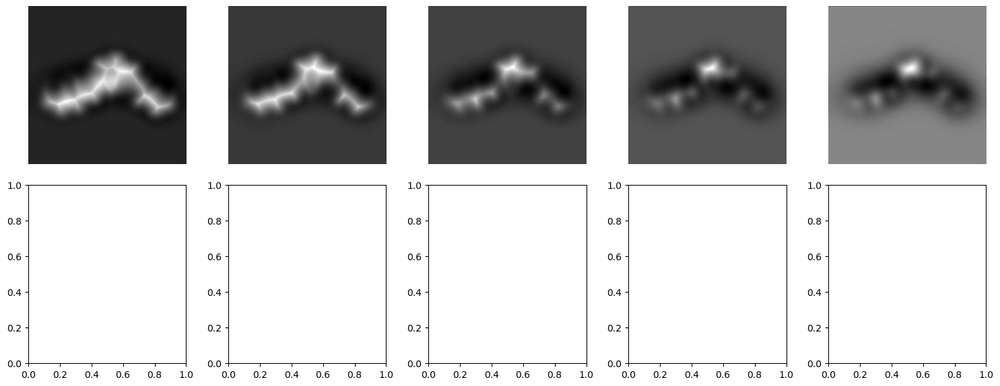

Interpolated image


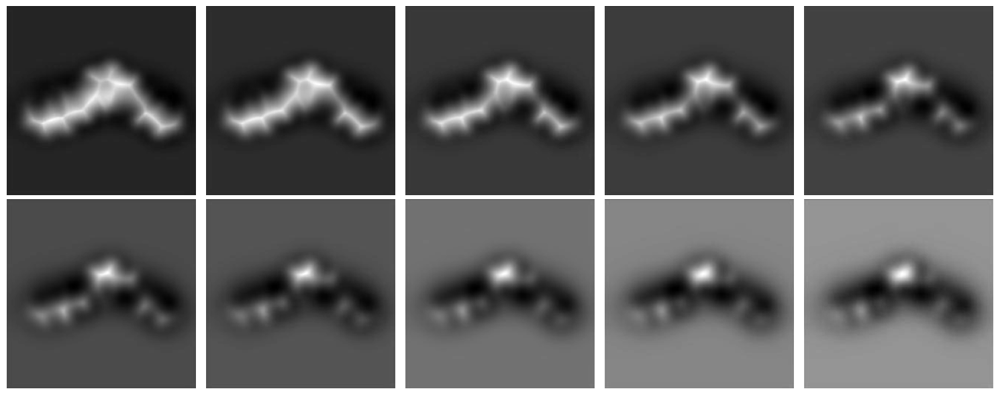

Original image


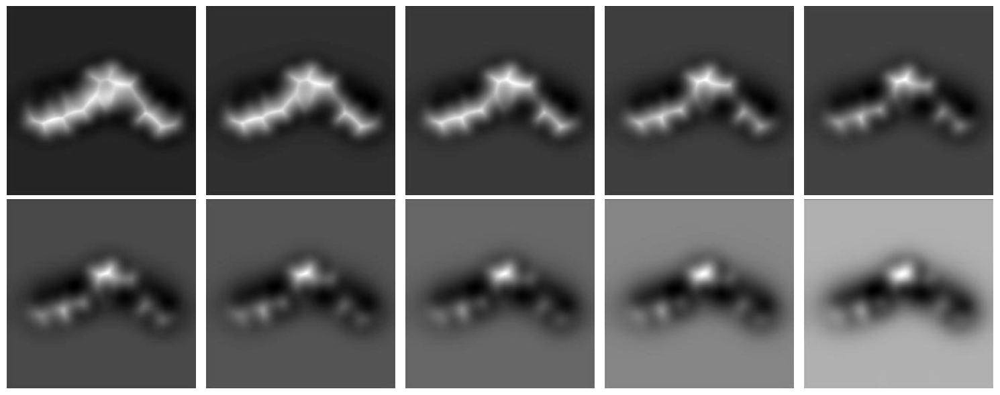

In [77]:
## 2-(2,6'-Bi[1H-benzimidazol]-6-yl)-1H-naphth[2,3-d]imidazole
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_10001048_K100_Amp140'
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)

in_slices = [0,2,4,6,8]
missing_slices = exp_img[in_slices,:,:]
print('Missing slices')
plot_images(missing_slices)
interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
print('Interpolated image')
plot_images(interpolated_slices)
print('Original image')
plot_images(exp_img)

### Now we perform extrapolation with the images


In [84]:
def plot_images(images):
    # Set up the figure and axes
    fig, axs = plt.subplots(2, 5, figsize=(15, 6))
    axs = axs.ravel()  # Flatten the 2D array of axes into 1D for easier indexing

    # Plot each image in its own subplot
    for i in range(images.shape[0]):
        axs[i].imshow(images[i], cmap='gray')  # Use grayscale color map
        axs[i].axis('off')  # Hide the axes

    # Show the plot
    plt.tight_layout()
    plt.show()
    


In [85]:
def interpolate_images(images, in_slices = [0,1,2,3,4,5,6,7,8,9], out_slices=[0,1,2,3,4,5,6,7,8,9]):
    # Convert the PyTorch tensor to a NumPy array
    images_np = images.numpy()

    # Define the coordinates of the known data points
    z = in_slices                      # depth
    x = np.arange(images_np.shape[1])  # height
    y = np.arange(images_np.shape[2])  # width

    # Define the coordinates of the points to interpolate
    zi, xi, yi = np.meshgrid(out_slices, x, y, indexing='ij')

    # Perform the interpolation
    interp = RegularGridInterpolator((z, x, y), images_np, method="linear", fill_value=None, bounds_error=False)
    interpolated_images_np = interp((zi, xi, yi))

    # Convert the interpolated images back to a PyTorch tensor
    interpolated_images = torch.from_numpy(interpolated_images_np).type(torch.FloatTensor)

    return interpolated_images
    

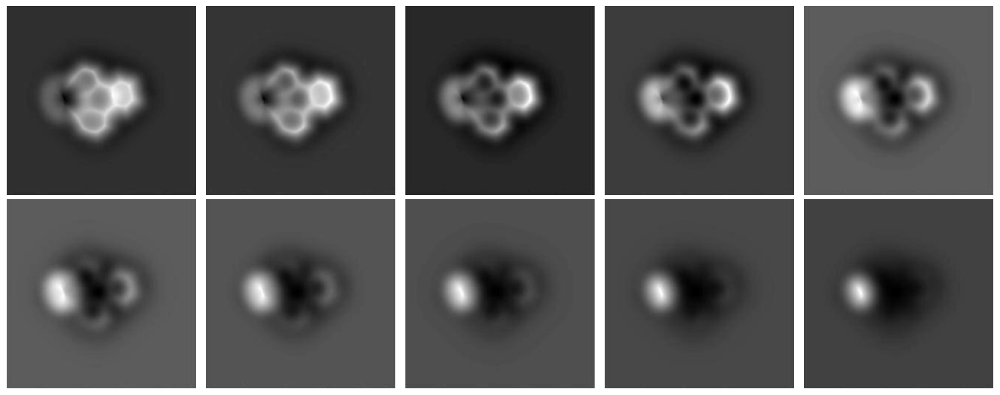

Missing slices


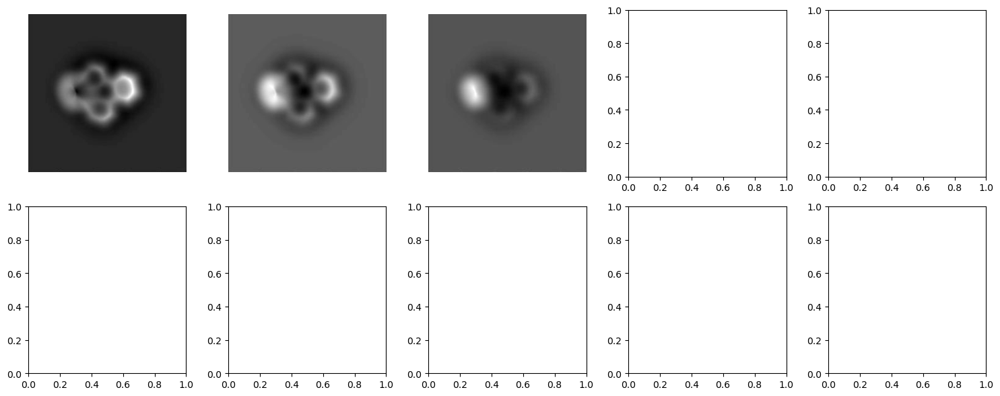

Interpolated image


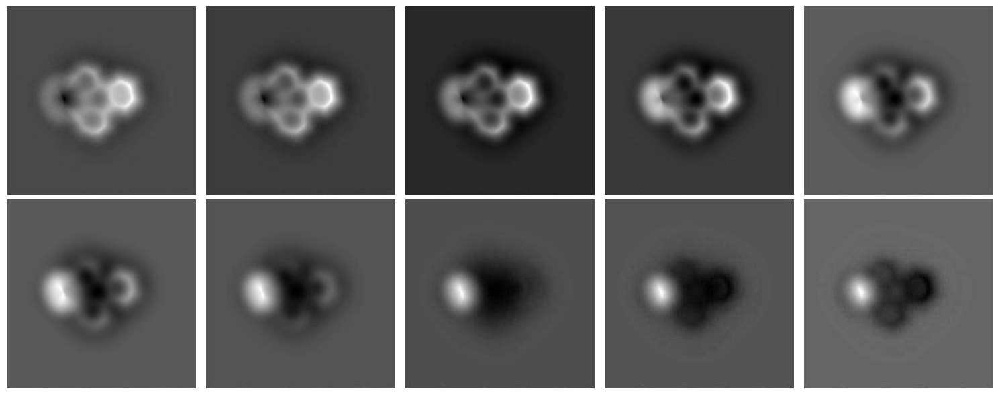

Original image


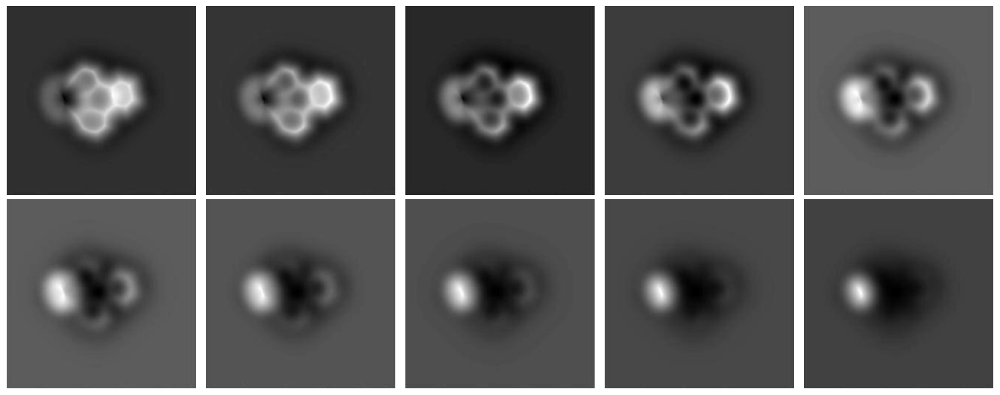

In [86]:
## 1-Iodotriphenylene

path = '/scratch/dataset/quam/K-24/Conformer3D_CID_126762499_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==126762499]['morgan_fp'].to_numpy()[0]

exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)

in_slices = [2,4,6]
missing_slices = exp_img[in_slices,:,:]
print('Missing slices')
plot_images(missing_slices)
interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
print('Interpolated image')
plot_images(interpolated_slices)
print('Original image')
plot_images(exp_img)

In [87]:
## Probamos el  1-Iodotriphenylene, interpolado. CID: 126762499
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_126762499_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==126762499]['morgan_fp'].to_numpy()[0]
in_slices = [2,4,6]
print(f'Slices used for extrapolation: {in_slices}')
for zoom in np.linspace(0.5, 2.5, 20):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    missing_slices = exp_img[in_slices,:,:]
    interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
    with torch.no_grad():
        batched_tensor = interpolated_slices.unsqueeze(dim = 0).to(device)

        predictions = model(batched_tensor)

        fp_pred = (torch.sigmoid(predictions) > 0.5)


    exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
    
    gt_fp = morgan_fp
    print('zoom:', zoom, 'tanimoto', np.round(tanimoto_numpy(exp_fp.squeeze(), gt_fp), 2))

Slices used for extrapolation: [2, 4, 6]
zoom: 0.5 tanimoto 0.41
zoom: 0.6052631578947368 tanimoto 0.46
zoom: 0.7105263157894737 tanimoto 0.5
zoom: 0.8157894736842105 tanimoto 0.48
zoom: 0.9210526315789473 tanimoto 0.46
zoom: 1.026315789473684 tanimoto 0.39
zoom: 1.131578947368421 tanimoto 0.38
zoom: 1.236842105263158 tanimoto 0.41
zoom: 1.3421052631578947 tanimoto 0.46
zoom: 1.4473684210526314 tanimoto 0.61
zoom: 1.5526315789473684 tanimoto 0.64
zoom: 1.6578947368421053 tanimoto 0.58
zoom: 1.763157894736842 tanimoto 0.67
zoom: 1.8684210526315788 tanimoto 0.78
zoom: 1.9736842105263157 tanimoto 0.72
zoom: 2.0789473684210527 tanimoto 0.71
zoom: 2.1842105263157894 tanimoto 0.43
zoom: 2.289473684210526 tanimoto 0.28
zoom: 2.394736842105263 tanimoto 0.19
zoom: 2.5 tanimoto 0.19


In [88]:
## 5-Iodoacenaphthylene

path = '/scratch/dataset/quam/K-24/Conformer3D_CID_21741905_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==21741905]['morgan_fp'].to_numpy()[0]
in_slices = [2,4,6]
print(f'Slices used for interpolation: {in_slices}')
for zoom in np.linspace(0.5, 2.5, 20):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    missing_slices = exp_img[in_slices,:,:]
    interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
    with torch.no_grad():
        batched_tensor = interpolated_slices.unsqueeze(dim = 0).to(device)

        predictions = model(batched_tensor)

        fp_pred = (torch.sigmoid(predictions) > 0.5)


    exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
    
    gt_fp = morgan_fp
    print('zoom:', zoom, 'tanimoto', np.round(tanimoto_numpy(exp_fp.squeeze(), gt_fp), 2))

Slices used for interpolation: [2, 4, 6]
zoom: 0.5 tanimoto 0.86
zoom: 0.6052631578947368 tanimoto 0.86
zoom: 0.7105263157894737 tanimoto 0.9
zoom: 0.8157894736842105 tanimoto 0.86
zoom: 0.9210526315789473 tanimoto 0.82
zoom: 1.026315789473684 tanimoto 0.78
zoom: 1.131578947368421 tanimoto 0.75
zoom: 1.236842105263158 tanimoto 0.75
zoom: 1.3421052631578947 tanimoto 0.86
zoom: 1.4473684210526314 tanimoto 0.86
zoom: 1.5526315789473684 tanimoto 0.86
zoom: 1.6578947368421053 tanimoto 0.86
zoom: 1.763157894736842 tanimoto 0.86
zoom: 1.8684210526315788 tanimoto 0.86
zoom: 1.9736842105263157 tanimoto 0.77
zoom: 2.0789473684210527 tanimoto 0.45
zoom: 2.1842105263157894 tanimoto 0.44
zoom: 2.289473684210526 tanimoto 0.36
zoom: 2.394736842105263 tanimoto 0.27
zoom: 2.5 tanimoto 0.18


Missing slices


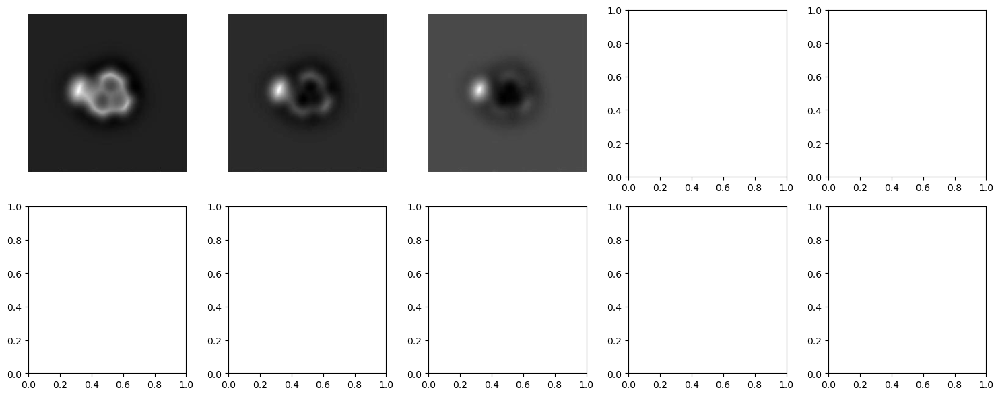

Interpolated image


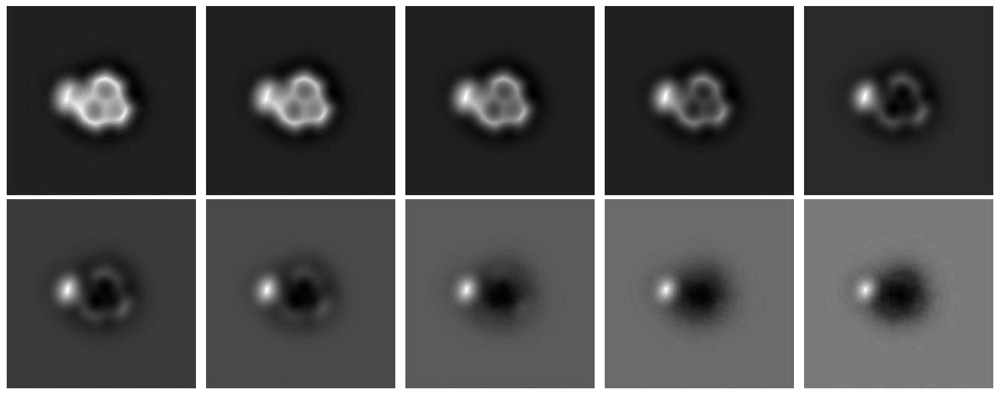

Original image


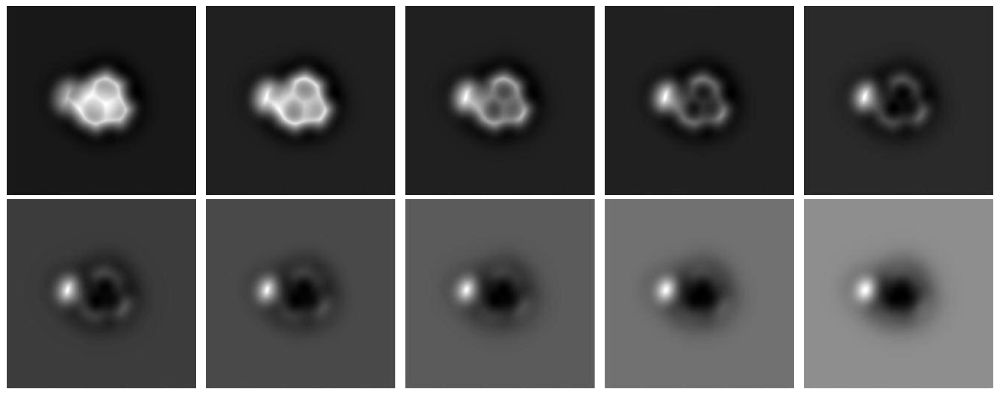

In [89]:
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)

in_slices = [2,4,6]
missing_slices = exp_img[in_slices,:,:]
print('Missing slices')
plot_images(missing_slices)
interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
print('Interpolated image')
plot_images(interpolated_slices)
print('Original image')
plot_images(exp_img)

In [9]:
## 2-(2,6'-Bi[1H-benzimidazol]-6-yl)-1H-naphth[2,3-d]imidazole
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_10001048_K100_Amp140'
morgan_fp = dataset_df[dataset_df['CID']==10001048]['morgan_fp'].to_numpy()[0]
in_slices = [2,4,6]
print(f'Slices used for interpolation: {in_slices}')
for zoom in np.linspace(0.5, 2.5, 20):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    missing_slices = exp_img[in_slices,:,:]
    interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
    with torch.no_grad():
        batched_tensor = interpolated_slices.unsqueeze(dim = 0).to(device)

        predictions = model(batched_tensor)

        fp_pred = (torch.sigmoid(predictions) > 0.5)


    exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
    
    gt_fp = morgan_fp
    print('zoom:', zoom, 'tanimoto', np.round(tanimoto_numpy(exp_fp.squeeze(), gt_fp), 2))

Slices used for interpolation: [2, 4, 6]
zoom: 0.5 tanimoto 0.48
zoom: 0.6052631578947368 tanimoto 0.48
zoom: 0.7105263157894737 tanimoto 0.65
zoom: 0.8157894736842105 tanimoto 0.72
zoom: 0.9210526315789473 tanimoto 0.7
zoom: 1.026315789473684 tanimoto 0.82
zoom: 1.131578947368421 tanimoto 0.78
zoom: 1.236842105263158 tanimoto 0.72
zoom: 1.3421052631578947 tanimoto 0.61
zoom: 1.4473684210526314 tanimoto 0.51
zoom: 1.5526315789473684 tanimoto 0.56
zoom: 1.6578947368421053 tanimoto 0.61
zoom: 1.763157894736842 tanimoto 0.55
zoom: 1.8684210526315788 tanimoto 0.52
zoom: 1.9736842105263157 tanimoto 0.48
zoom: 2.0789473684210527 tanimoto 0.49
zoom: 2.1842105263157894 tanimoto 0.37
zoom: 2.289473684210526 tanimoto 0.3
zoom: 2.394736842105263 tanimoto 0.26
zoom: 2.5 tanimoto 0.29


Missing slices


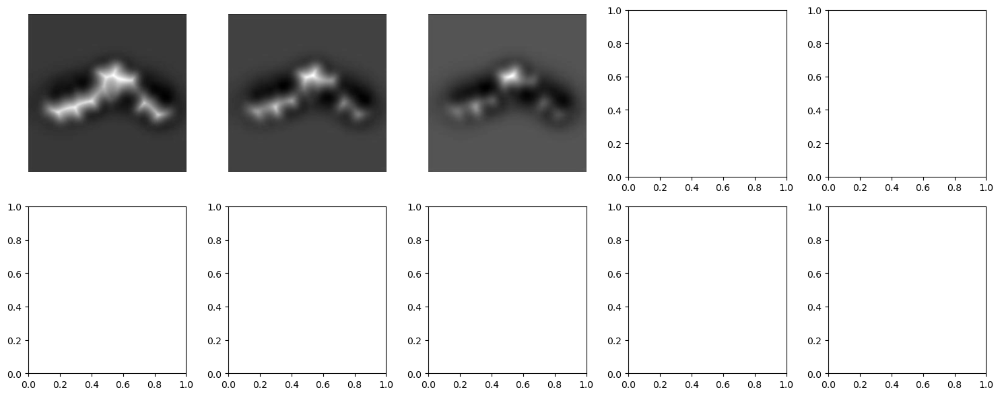

Interpolated image


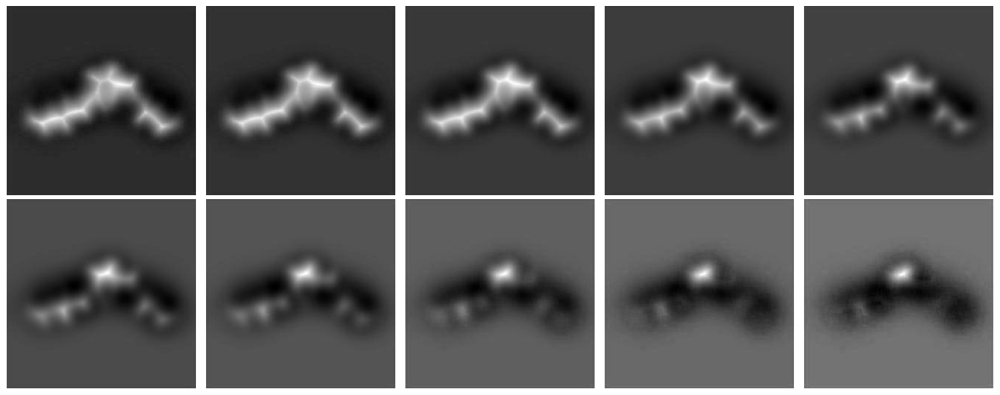

Original image


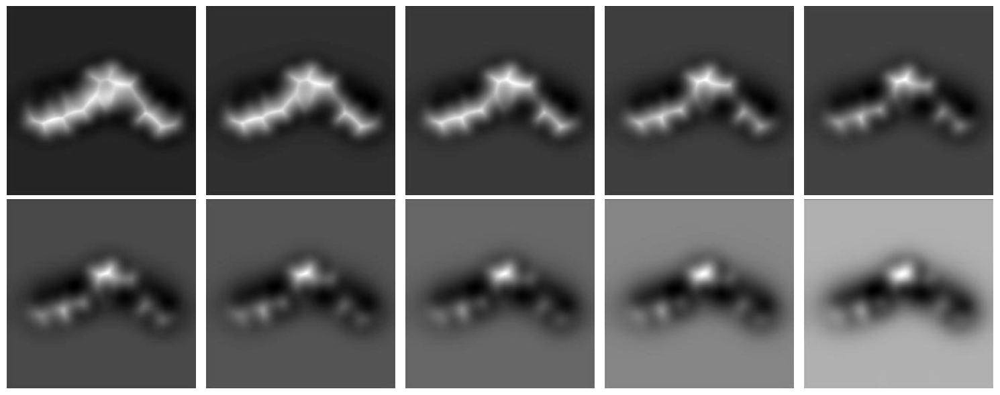

In [90]:
## 2-(2,6'-Bi[1H-benzimidazol]-6-yl)-1H-naphth[2,3-d]imidazole
path = '/scratch/dataset/quam/K-24/Conformer3D_CID_10001048_K100_Amp140'
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)

in_slices = [2,4,6]
missing_slices = exp_img[in_slices,:,:]
print('Missing slices')
plot_images(missing_slices)
interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, out_slices=[0,1,2,3,4,5,6,7,8,9])
print('Interpolated image')
plot_images(interpolated_slices)
print('Original image')
plot_images(exp_img)

## Zoom interpolation and extrapolation statistics
We run the same code for several molecules and create histograms. 

In [103]:
samples = test_df.sample(n=100)


In [120]:
tanimoto_dict = {}
for i in tqdm(range(len(samples))):
    tanimoto_arr = np.zeros(20)
    path = samples.iloc[i]['path']
    morgan_fp = samples.iloc[i]['morgan_fp']
    in_slices = [0,2,4,6,8]
    for j, zoom in enumerate(np.linspace(0.5, 2.5, 20)):
        exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)

        with torch.no_grad():
            batched_tensor = exp_img.unsqueeze(dim = 0).to(device)
            predictions = model(batched_tensor)
            fp_pred = (torch.sigmoid(predictions) > 0.5)
        
        exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
        tanimoto_arr[j] = tanimoto_numpy(exp_fp.squeeze(), morgan_fp)
        
    tanimoto_dict[path] = tanimoto_arr

tanimoto_df = pd.DataFrame(tanimoto_dict)
tanimoto_df['zoom'] = np.linspace(0.5, 2.5, 20)


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:58<00:00,  1.72it/s]


In [121]:
tanimoto_dict = {}
for i in tqdm(range(len(samples))):
    tanimoto_arr = np.zeros(20)
    path = samples.iloc[i]['path']
    morgan_fp = samples.iloc[i]['morgan_fp']
    in_slices = [0,2,4,6,8]
    for j, zoom in enumerate(np.linspace(0.5, 2.5, 20)):
        exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
        
        missing_slices = exp_img[in_slices,:,:]
        interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, 
                                                 out_slices=[0,1,2,3,4,5,6,7,8,9])
        
        with torch.no_grad():
            batched_tensor = interpolated_slices.unsqueeze(dim = 0).to(device)
            predictions = model(batched_tensor)
            fp_pred = (torch.sigmoid(predictions) > 0.5)
        
        exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
        tanimoto_arr[j] = tanimoto_numpy(exp_fp.squeeze(), morgan_fp)
        
    tanimoto_dict[path] = tanimoto_arr

tanimoto_interp_df = pd.DataFrame(tanimoto_dict)
tanimoto_interp_df['zoom'] = np.linspace(0.5, 2.5, 20)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [06:43<00:00,  4.04s/it]


In [129]:
tanimoto_dict = {}
for i in tqdm(range(len(samples))):
    tanimoto_arr = np.zeros(20)
    path = samples.iloc[i]['path']
    morgan_fp = samples.iloc[i]['morgan_fp']
    in_slices = [2,4,6]
    for j, zoom in enumerate(np.linspace(0.5, 2.5, 20)):
        exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
       
        missing_slices = exp_img[in_slices,:,:]
        interpolated_slices = interpolate_images(missing_slices, in_slices = in_slices, 
                                                 out_slices=[0,1,2,3,4,5,6,7,8,9])
        
        with torch.no_grad():
            batched_tensor = interpolated_slices.unsqueeze(dim = 0).to(device)
            predictions = model(batched_tensor)
            fp_pred = (torch.sigmoid(predictions) > 0.5)
        
        exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
        tanimoto_arr[j] = tanimoto_numpy(exp_fp.squeeze(), morgan_fp)
        
    tanimoto_dict[path] = tanimoto_arr
    
tanimoto_extrap_df = pd.DataFrame(tanimoto_dict)
tanimoto_extrap_df['zoom'] = np.linspace(0.5, 2.5, 20)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [04:38<00:00,  2.79s/it]


In [135]:
tanimoto_extrap_df['zoom'] = np.linspace(0.5, 2.5, 20)

In [136]:
#tanimoto_df.set_index('zoom', inplace=True)
tanimoto_extrap_df.set_index('zoom', inplace=True)
#tanimoto_interp_df.set_index('zoom', inplace=True)

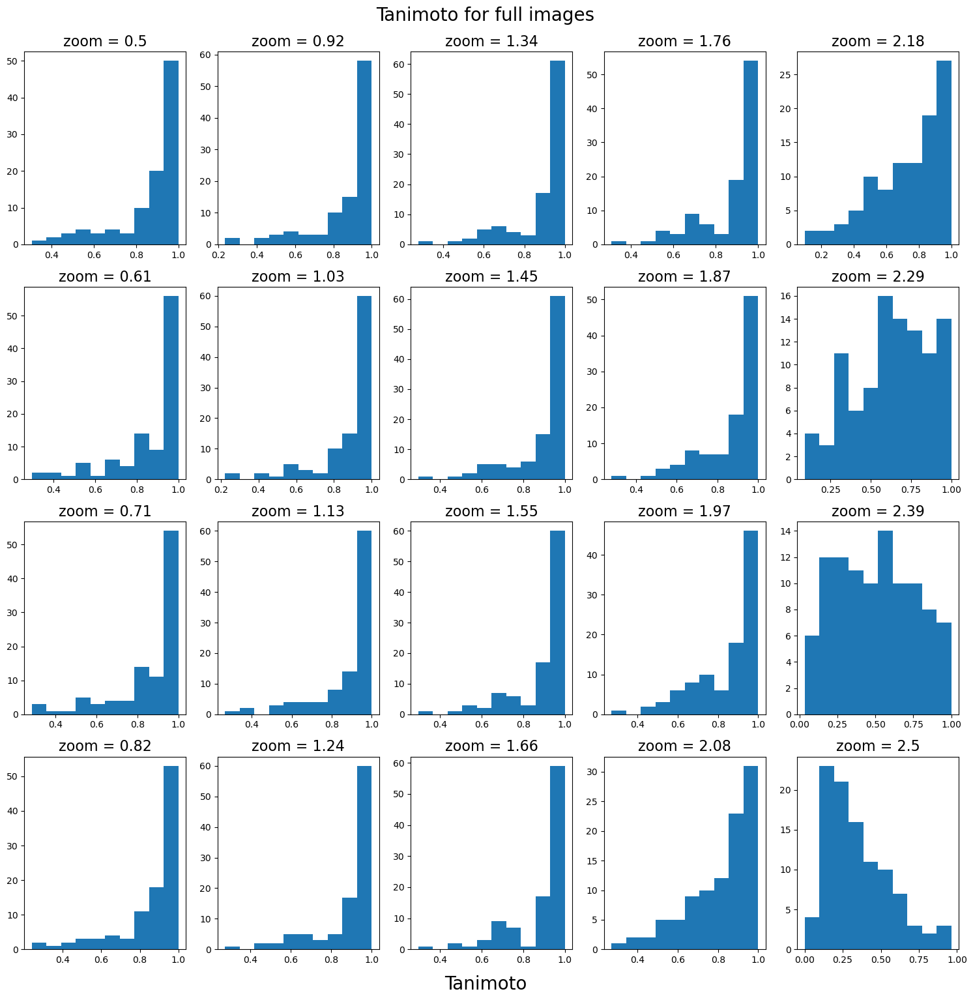

In [124]:
tanimoto_df.index = np.round(tanimoto_df.index, 2)
df = tanimoto_df.T

fig, axes = plt.subplots(4,5, figsize=(15, 15))  # Added figsize for better visibility

for i, zoom in enumerate(df.columns):
    ax = axes[i%4, i//4]
    ax.hist(df[zoom])
    ax.set_title(f'zoom = {zoom}', fontsize=16)

# Set global figure title and x-label for all subplots
fig.suptitle('Tanimoto for full images', fontsize=20, y=0.99) # Added a bit of y padding for the title
fig.text(0.5, -0.01, 'Tanimoto', ha='center', va='center', fontsize=20)

plt.tight_layout()  # Added to prevent overlapping subplots
plt.savefig('tanimoto_full_slices.pdf')

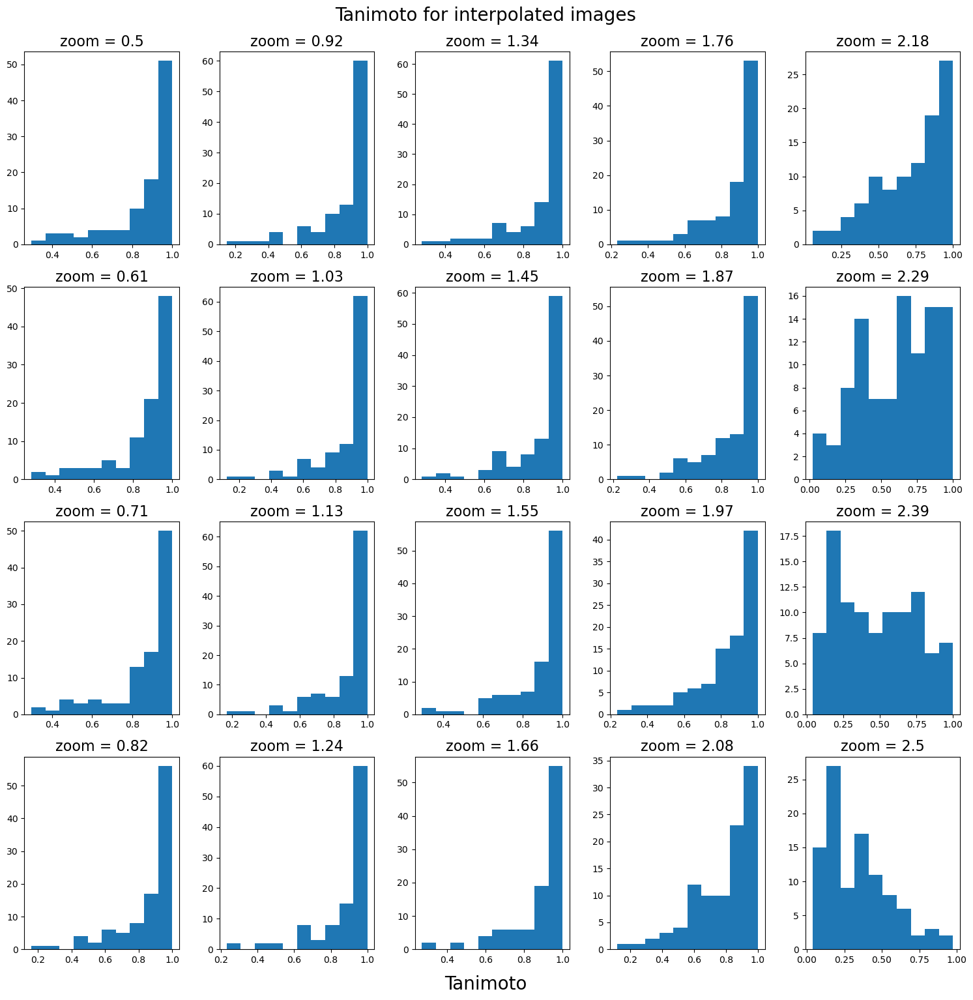

In [125]:
tanimoto_interp_df.index = np.round(tanimoto_interp_df.index, 2)
df = tanimoto_interp_df.T

fig, axes = plt.subplots(4,5, figsize=(15, 15))  # Added figsize for better visibility

for i, zoom in enumerate(df.columns):
    ax = axes[i%4, i//4]
    ax.hist(df[zoom])
    ax.set_title(f'zoom = {zoom}', fontsize=16)

# Set global figure title and x-label for all subplots
fig.suptitle('Tanimoto for interpolated images', fontsize=20, y=0.99) # Added a bit of y padding for the title
fig.text(0.5, -0.01, 'Tanimoto', ha='center', va='center', fontsize=20)

plt.tight_layout()  # Added to prevent overlapping subplots
plt.savefig('tanimoto_interpolated_slices.pdf')

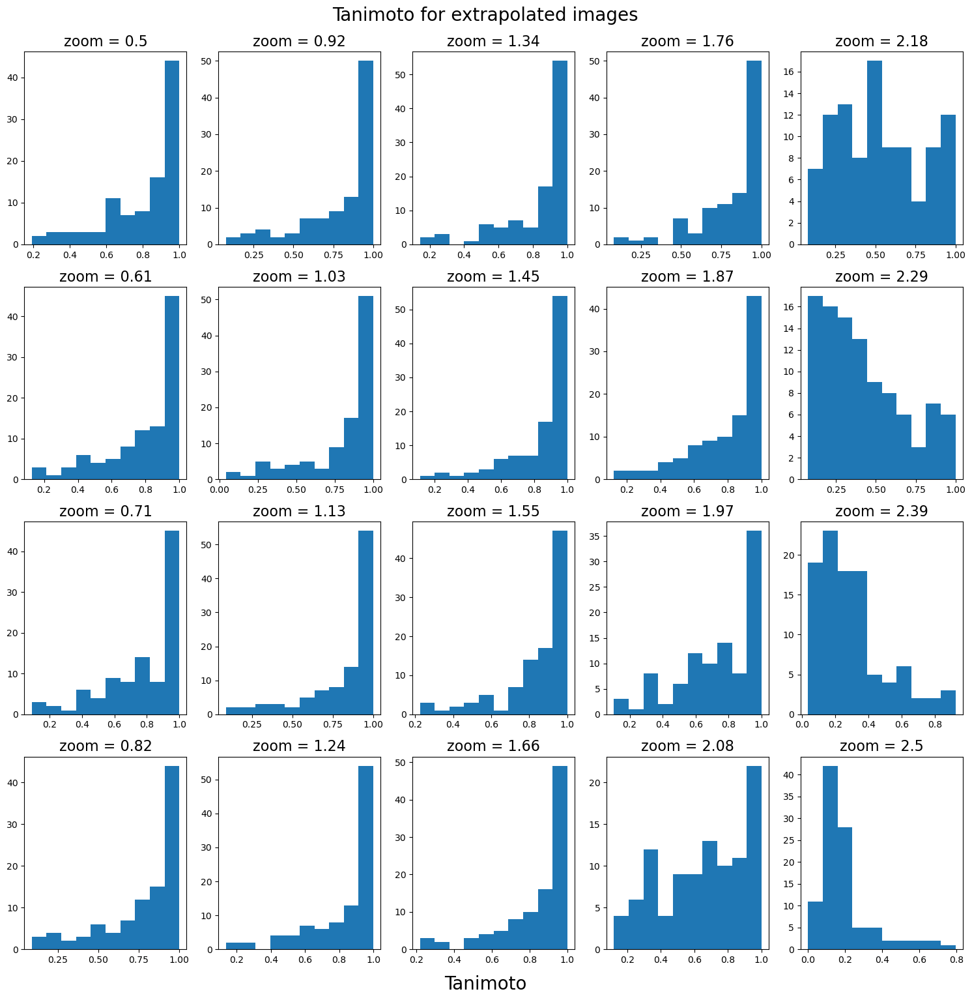

In [137]:
tanimoto_extrap_df.index = np.round(tanimoto_extrap_df.index, 2)
df = tanimoto_extrap_df.T

fig, axes = plt.subplots(4,5, figsize=(15, 15))  # Added figsize for better visibility

for i, zoom in enumerate(df.columns):
    ax = axes[i%4, i//4]
    ax.hist(df[zoom])
    ax.set_title(f'zoom = {zoom}', fontsize=16)

# Set global figure title and x-label for all subplots
fig.suptitle('Tanimoto for extrapolated images', fontsize=20, y=0.99) # Added a bit of y padding for the title
fig.text(0.5, -0.01, 'Tanimoto', ha='center', va='center', fontsize=20)

plt.tight_layout()  # Added to prevent overlapping subplots
plt.savefig('tanimoto_extrapolated_slices.pdf')

### We plot the differences for easier comparison

In [138]:
tanimoto_extrap_df

,/scratch/dataset/quam/K-20/Conformer3D_CID_7244121_K100_Amp060,/scratch/dataset/quam/K-9/Conformer3D_CID_55023506_K060_Amp080,/scratch/dataset/quam/K-6/Conformer3D_CID_22999160_K040_Amp140,/scratch/dataset/quam/K-5/Conformer3D_CID_6057763_K040_Amp120,/scratch/dataset/quam/K-8/Conformer3D_CID_13547579_K060_Amp060,/scratch/dataset/quam/K-22/Conformer3D_CID_119096624_K100_Amp100,/scratch/dataset/quam/K-24/Conformer3D_CID_117878349_K100_Amp140,/scratch/dataset/quam/K-19/Conformer3D_CID_78908948_K100_Amp040,/scratch/dataset/quam/K-19/Conformer3D_CID_105479938_K100_Amp040,/scratch/dataset/quam/K-17/Conformer3D_CID_117768717_K080_Amp120,...,/scratch/dataset/quam/K-2/Conformer3D_CID_54341273_K040_Amp060,/scratch/dataset/quam/K-22/Conformer3D_CID_131197560_K100_Amp100,/scratch/dataset/quam/K-20/Conformer3D_CID_130952316_K100_Amp060,/scratch/dataset/quam/K-24/Conformer3D_CID_115148411_K100_Amp140,/scratch/dataset/quam/K-19/Conformer3D_CID_81894527_K100_Amp040,/scratch/dataset/quam/K-3/Conformer3D_CID_3999965_K040_Amp080,/scratch/dataset/quam/K-13/Conformer3D_CID_136866588_K080_Amp040,/scratch/dataset/quam/K-10/Conformer3D_CID_9837833_K060_Amp100,/scratch/dataset/quam/K-19/Conformer3D_CID_24229589_K100_Amp040,/scratch/dataset/quam/K-4/Conformer3D_CID_617535_K040_Amp100
zoom,,,,,,,,,,,,,,,,,,,,,
0.50,0.957447,1.000000,1.000000,0.521739,0.666667,0.520000,0.964286,1.000000,1.000000,0.192308,...,0.875000,0.269841,0.952381,0.916667,0.972973,1.000000,0.933333,0.942857,0.725000,1.000000
0.61,0.978723,1.000000,0.956522,0.464286,0.720000,0.481481,0.964286,1.000000,1.000000,0.127273,...,0.567568,0.500000,0.952381,0.868421,0.947368,1.000000,0.966667,1.000000,0.769231,0.972222
0.71,0.958333,1.000000,0.956522,0.400000,0.720000,0.520000,0.964286,1.000000,1.000000,0.090909,...,0.513514,0.470588,0.952381,0.634615,0.947368,0.970588,1.000000,1.000000,0.729730,1.000000
0.82,1.000000,1.000000,1.000000,0.400000,0.692308,0.541667,0.964286,1.000000,1.000000,0.088235,...,0.800000,0.510638,0.952381,0.785714,0.947368,0.970588,0.966667,1.000000,0.878788,1.000000
0.92,1.000000,1.000000,1.000000,0.371429,0.720000,0.541667,0.964286,1.000000,0.970588,0.076923,...,1.000000,0.571429,0.952381,0.804878,0.947368,0.970588,0.966667,1.000000,0.857143,1.000000
1.03,1.000000,1.000000,1.000000,0.351351,0.720000,0.520000,0.964286,1.000000,1.000000,0.041667,...,1.000000,0.428571,0.760000,0.717391,0.972973,1.000000,1.000000,1.000000,0.909091,1.000000
1.13,0.978261,1.000000,1.000000,0.406250,0.720000,0.652174,1.000000,1.000000,1.000000,0.086957,...,1.000000,0.684211,0.555556,0.581818,0.972973,1.000000,1.000000,1.000000,0.882353,1.000000
1.24,0.957447,1.000000,1.000000,0.407407,0.692308,0.652174,1.000000,1.000000,1.000000,0.136364,...,1.000000,0.650000,0.576923,0.660000,0.972973,1.000000,1.000000,1.000000,0.906250,1.000000
1.34,1.000000,1.000000,1.000000,0.279070,0.692308,0.600000,1.000000,1.000000,1.000000,0.217391,...,1.000000,0.565217,0.869565,0.615385,0.972973,1.000000,1.000000,1.000000,0.906250,1.000000


In [143]:

df = tanimoto_df.T - tanimoto_extrap_df.T
df.mean(axis = 0)

zoom
0.50    0.055788
0.61    0.073841
0.71    0.083055
0.82    0.082590
0.92    0.074666
1.03    0.074293
1.13    0.060198
1.24    0.052269
1.34    0.048511
1.45    0.047813
1.55    0.048316
1.66    0.046558
1.76    0.055185
1.87    0.073458
1.97    0.109457
2.08    0.159694
2.18    0.200331
2.29    0.210494
2.39    0.206798
2.50    0.156172
dtype: float64

In [144]:

df = tanimoto_df.T - tanimoto_interp_df.T
df.mean(axis = 0)

zoom
0.50    0.004248
0.61    0.005451
0.71    0.000343
0.82    0.005110
0.92    0.004376
1.03    0.007311
1.13    0.007304
1.24    0.010047
1.34    0.007644
1.45    0.009842
1.55    0.012525
1.66    0.011381
1.76    0.008779
1.87    0.009104
1.97    0.011096
2.08    0.018125
2.18    0.020457
2.29    0.025765
2.39    0.023525
2.50    0.014032
dtype: float64

###  Identification of mDBPc in cis and trans conformation.

In [11]:
def plot_stack(images):
    # Set up the figure and axes
    fig, axs = plt.subplots(2, 5, figsize=(15, 6))
    axs = axs.ravel()  # Flatten the 2D array of axes into 1D for easier indexing

    # Plot each image in its own subplot
    for i in range(images.shape[0]):
        axs[i].imshow(images[i], cmap='gray')  # Use grayscale color map
        axs[i].axis('off')  # Hide the axes

    # Show the plot
    plt.tight_layout()
    plt.show()

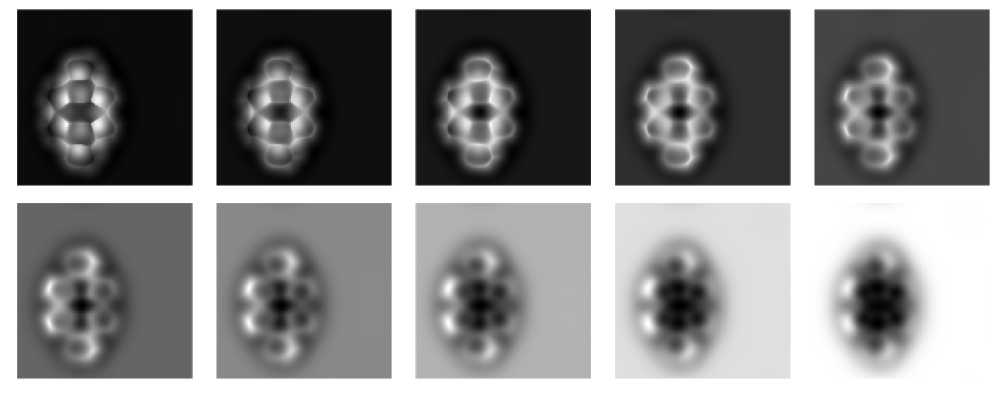

In [12]:
path = '/home/mgonzalez/simulated_images/mDBPc_NaCl_cis_imgs/K1'
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)
plot_stack(exp_img)

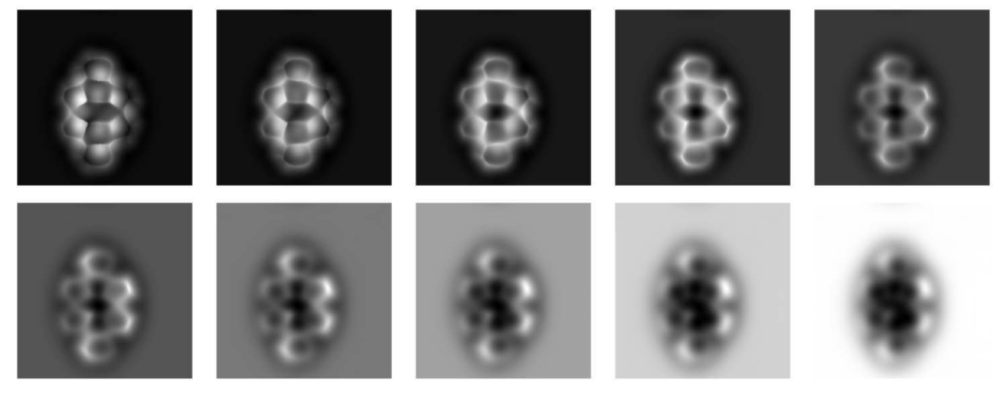

In [13]:
path = '/home/mgonzalez/simulated_images/mDBPc_NaCl_trans_imgs/K1'
morgan_fp = dataset_df[dataset_df['CID']==126762499]['morgan_fp'].to_numpy()[0]

exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)
plot_stack(exp_img)

In [77]:
def morgan_fp_gen(smiles, nBits=2048):
    m1 = AllChem.MolFromSmiles(smiles)
    fp1 = AllChem.GetMorganFingerprintAsBitVect(m1,2,nBits=nBits)
    return np.array(fp1)

def load_jmol(path, dimension=[224,224], zoom=1):
    jmol_image = Image.open(path)

    # Determine the aspect ratio by finding the shorter dimension
    width, height = jmol_image.size
    min_dim = min(width, height)

    # Calculate the left, top, right, bottom coordinates for cropping
    left = (width - min_dim) / 2
    top = (height - min_dim) / 2
    right = (width + min_dim) / 2
    bottom = (height + min_dim) / 2

    # Crop the image to square
    jmol_image = jmol_image.crop((left, top, right, bottom))

    # Resize image to desired dimensions
    jmol_image = jmol_image.resize(dimension, resample=Image.Resampling.BILINEAR)

    # Apply zoom by cropping
    width, height = jmol_image.size
    left = width * ((1 - zoom) / 2)
    top = height * ((1 - zoom) / 2)
    right = width * ((1 + zoom) / 2)
    bottom = height * ((1 + zoom) / 2)
    jmol_image = jmol_image.crop((left, top, right, bottom))

    # Resize image to desired dimensions
    jmol_image = jmol_image.resize(dimension, resample=Image.Resampling.BILINEAR)

    # Convert to numpy array
    jmol_image_array = np.array(jmol_image)

    return jmol_image_array

def load_exp_img_stack(path, dimensions=[224,224], zoom=1, normalize=True, interpolation='bilinear'):
    '''Obtains stack of experimental images from folder path and preprocess 
        it so we can directly feed it to our CNN

        INPUT: path of the folder containing the AFM images of the molecule

        OUTPUT: list of PIL images'''
    path_list = sorted(glob.glob(os.path.join(path,'*')))
    im_list = list()
    for im_path in path_list:
        
        im_list.append(Image.open(im_path).resize(dimensions, resample=Image.Resampling.BILINEAR).convert('L'))
        
    # Default parameters
        degrees = 0
        h_shift = 0
        v_shift = 0
        shear = 0

        
    for i in range(len(im_list)):
        im_list[i] = TF.affine(im_list[i], degrees, [h_shift, v_shift], zoom, shear,
                                interpolation=transforms.InterpolationMode.BILINEAR,
                                fill=im_list[i].getpixel((5, 5))
                                )

    to_tensor = transforms.ToTensor()

    tensor_stack = [to_tensor(im) for im in im_list.copy()]
    tensor_stack = torch.cat(tensor_stack)

    #normalize = transforms.Normalize(
    #    mean=[0.1321, 0.1487, 0.1689, 0.1983, 0.2229, 0.2591, 0.3430, 0.4580, 0.5787, 0.6887],
    #    std=[0.0853, 0.0853, 0.0883, 0.0942, 0.0969, 0.1066, 0.1419, 0.1840, 0.2144, 0.2215]) #this is for K-1

    
    if normalize:

        normalize = transforms.Normalize(
            mean=[0.2855, 0.3973, 0.4424, 0.4134, 0.6759, 1.0664, 0.9904, 0.7708, 0.5748, 0.4055],
            std=[1.1341, 1.2528, 1.3125, 1.3561, 1.5844, 1.7763, 1.5447, 1.2683, 1.0588, 0.9308]) # for all K folders

        tensor_stack = normalize(tensor_stack)

    return tensor_stack

#### mDBPc cis

In [68]:
### Add all molecules to experimental_df
experimental_df = test_df.copy()
CID = 1234512345 # this cid is invent
path = '/home/mgonzalez/simulated_images/mDBPc_NaCl_cis_imgs/K1'
SMILES = 'c7ccc6c1ccc([nH]1)c2ccc([nH]2)c3ccccc3c4ccc(n4)c5ccc(n5)c6c7'
morgan_fp = morgan_fp_gen(SMILES, nBits=1024)
split='test'
corrugation = np.nan



experimental_df = experimental_df.append({'path':path,
                           'CID':CID, 
                           'SMILES':SMILES,
                           'morgan_fp':morgan_fp,
                           'split':split,
                           'corrugation':corrugation
                            }, ignore_index=True)


/tmp/ipykernel_4047309/3515613714.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experimental_df = experimental_df.append({'path':path,


In [69]:
experimental_df[experimental_df['path'] == '/home/mgonzalez/simulated_images/mDBPc_NaCl_cis_imgs/K1']['morgan_fp']

279848    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
Name: morgan_fp, dtype: object

In [78]:
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1, normalize=True)
with torch.no_grad():
    batched_tensor = exp_img.unsqueeze(dim = 0).to(device)
    print(batched_tensor.size())
    predictions = model(batched_tensor)
    print(predictions.size())
    fp_pred = (torch.sigmoid(predictions) > 0.5)
    print(fp_pred.size())

exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
print(exp_fp.shape)
print(exp_fp.sum())

output_df = fp_screening_function(exp_fp, experimental_df, top_k = 20)

print('Is the correct CID in the top k candidates?',  CID in list(output_df['CID']))
output_df[output_df['path'] == '/home/mgonzalez/simulated_images/mDBPc_NaCl_cis_imgs/K1']

torch.Size([1, 10, 224, 224])
torch.Size([1, 1024])
torch.Size([1, 1024])
(1024,)
14
Is the correct CID in the top k candidates? False


,path,CID,SMILES,morgan_fp,split,corrugation,C,Br,Cl,F,I,N,O,P,S,H,tanimoto


In [74]:
exp_fp

array([0, 0, 0, ..., 0, 0, 0])

In [76]:
output_df = fp_screening_function(exp_fp, experimental_df, top_k = 20)

print('Is the correct CID in the top k candidates?',  CID in list(output_df['CID']))
output_df[output_df['path'] == '/home/mgonzalez/simulated_images/mDBPc_NaCl_cis_imgs/K1']

Is the correct CID in the top k candidates? False


,path,CID,SMILES,morgan_fp,split,corrugation,C,Br,Cl,F,I,N,O,P,S,H,tanimoto


In [79]:
tanimoto_numpy(exp_fp, morgan_fp)

0.22580645161290322

#### mDBPc trans

In [80]:
### Add all molecules to experimental_df
experimental_df = test_df.copy()
CID = 1234512346 # this cid is invent
path = '/home/mgonzalez/simulated_images/mDBPc_NaCl_cis_imgs/K1'
SMILES = 'c7ccc6c1ccc([nH]1)c2ccc(n2)c3ccccc3c4ccc([nH]4)c5ccc(n5)c6c7'
morgan_fp = morgan_fp_gen(SMILES, nBits=1024)
split='test'
corrugation = np.nan



experimental_df = experimental_df.append({'path':path,
                           'CID':CID, 
                           'SMILES':SMILES,
                           'morgan_fp':morgan_fp,
                           'split':split,
                           'corrugation':corrugation
                            }, ignore_index=True)


/tmp/ipykernel_4047309/3050138059.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  experimental_df = experimental_df.append({'path':path,


In [81]:
experimental_df[experimental_df['path'] == '/home/mgonzalez/simulated_images/mDBPc_NaCl_trans_imgs/K1']['morgan_fp']

279848    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
Name: morgan_fp, dtype: object

In [82]:
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1, normalize=True)
with torch.no_grad():
    batched_tensor = exp_img.unsqueeze(dim = 0).to(device)
    print(batched_tensor.size())
    predictions = model(batched_tensor)
    print(predictions.size())
    fp_pred = (torch.sigmoid(predictions) > 0.5)
    print(fp_pred.size())

exp_fp = fp_pred.cpu().numpy().astype(int).squeeze()
print(exp_fp.shape)
print(exp_fp.sum())

output_df = fp_screening_function(exp_fp, experimental_df, top_k = 20)

print('Is the correct CID in the top k candidates?',  CID in list(output_df['CID']))
output_df[output_df['path'] == '/home/mgonzalez/simulated_images/mDBPc_NaCl_cis_imgs/K1']

torch.Size([1, 10, 224, 224])
torch.Size([1, 1024])
torch.Size([1, 1024])
(1024,)
39
Is the correct CID in the top k candidates? False


,path,CID,SMILES,morgan_fp,split,corrugation,C,Br,Cl,F,I,N,O,P,S,H,tanimoto


In [74]:
exp_fp

array([0, 0, 0, ..., 0, 0, 0])

In [76]:
output_df = fp_screening_function(exp_fp, experimental_df, top_k = 20)

print('Is the correct CID in the top k candidates?',  CID in list(output_df['CID']))
output_df[output_df['path'] == '/home/mgonzalez/simulated_images/mDBPc_NaCl_cis_imgs/K1']

Is the correct CID in the top k candidates? False


,path,CID,SMILES,morgan_fp,split,corrugation,C,Br,Cl,F,I,N,O,P,S,H,tanimoto


In [83]:
tanimoto_numpy(exp_fp, morgan_fp)

0.14545454545454545

### Same figures as in the paper, but with second candidates

In [10]:
def run_prediction_extra(molec_path, dimension=[224,224], zoom=1, verbose=False):
    img_stack = load_img_stack(molec_path)
    true_CID = _extract_cid(molec_path)

    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)


    first_CID = _extract_cid(output_df.iloc[0]['path'])
    second_CID = _extract_cid(output_df.iloc[1]['path'])
    tanimoto_first = output_df.iloc[0]['tanimoto']
    tanimoto_second = output_df.iloc[1]['tanimoto']
    
    gt_jmol = load_jmol_image(true_CID, dimension=dimension, zoom=zoom)
    first_jmol = load_jmol_image(first_CID, dimension=dimension, zoom=zoom)
    second_jmol = load_jmol_image(second_CID, dimension=dimension, zoom=zoom)

    
    if verbose:
        print('Total number of fingerprints', np.sum(fp_pred))
        print('Is the correct CID in the top k candidates?',  true_CID in list(output_df['CID']))
        print('Is the correct CID the first candidate?',  true_CID == output_df['CID'].iloc[0])
        print(f'top candidate: {first_CID} tanimoto: {tanimoto_first}')
        print(f'second candidate: {second_CID} tanimoto: {tanimoto_second}')
        print('########################')
        print(output_df.iloc[:5]['CID'])
        print('########################')
        
    
    return img_stack[1], img_stack[3], img_stack[5], gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second


/scratch/dataset/quam/K-1/Conformer3D_CID_2748722_K040_Amp040
Total number of fingerprints 15
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 2748722 tanimoto: 0.8125
second candidate: 21856870 tanimoto: 0.6363636363636364
########################
1131       2748722
31895     21856870
116823      270010
231737      852658
78873     54058316
Name: CID, dtype: int64
########################
2748722 2748722 21856870
/scratch/dataset/quam/K-4/Conformer3D_CID_63616469_K040_Amp100
Total number of fingerprints 39
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 63616469 tanimoto: 0.9743589743589743
second candidate: 63616316 tanimoto: 0.6170212765957447
########################
83816     63616469
83814     63616316
217800    64446716
83830     63615331
454478    64395594
Name: CID, dtype: int64
########################
63616469 63616469 63616316
/scratch/dataset/quam/K-7/Co

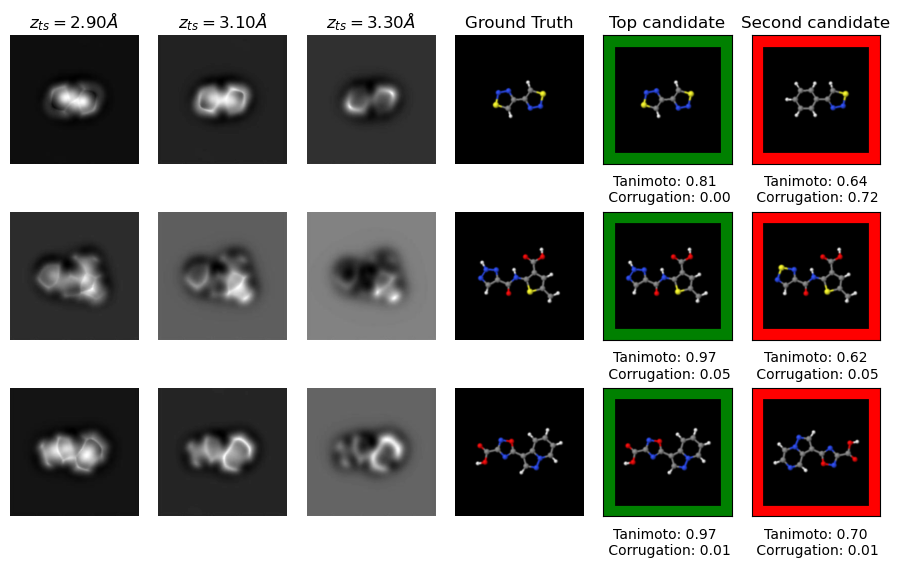

In [12]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = test_df.iloc[MOLECULE_INDEX]['path']
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=0.8, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('vs_good_pred_second_candidates.png', )
plt.show()


/scratch/dataset/quam/K-6/Conformer3D_CID_143932_K040_Amp140
Total number of fingerprints 19
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 143932 tanimoto: 0.8947368421052632
second candidate: 6857588 tanimoto: 0.75
########################
6438        143932
219765     6857588
215021    59787234
233418        9167
78523      5460711
Name: CID, dtype: int64
########################
143932 143932 6857588
/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060
Total number of fingerprints 18
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 636081 tanimoto: 0.7368421052631579
second candidate: 85721330 tanimoto: 0.6956521739130435
########################
37905        636081
231892     85721330
61524     124003402
194185     13766977
174000     11995190
Name: CID, dtype: int64
########################
636081 636081 85721330
/scratch/dataset/quam/K-24/Conformer3D

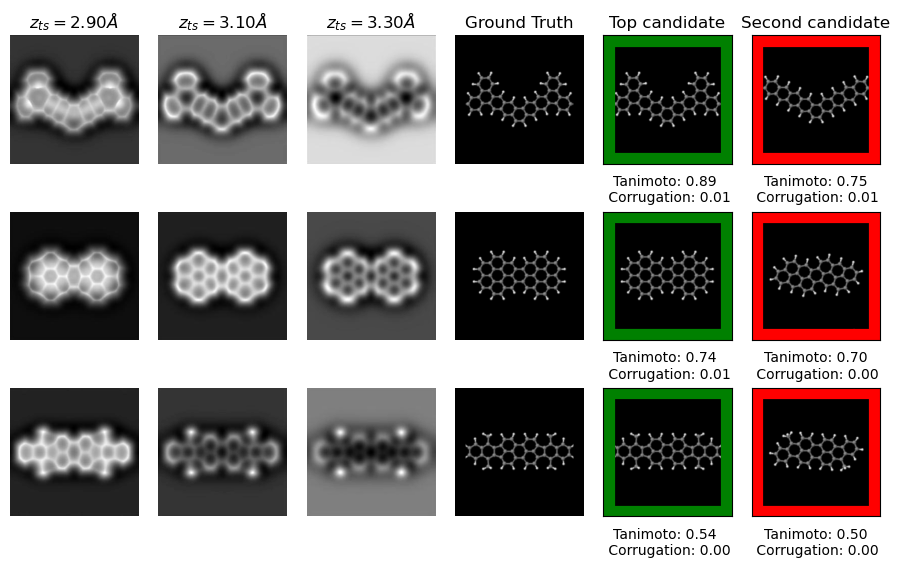

In [17]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
molec_paths = [
        '/scratch/dataset/quam/K-6/Conformer3D_CID_143932_K040_Amp140',
        '/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060',
        '/scratch/dataset/quam/K-24/Conformer3D_CID_59721948_K100_Amp140']

titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = molec_paths[i]
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=1.2, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('pah_identification_second_candidates.png')
plt.show()

/scratch/dataset/quam/K-6/Conformer3D_CID_85665969_K040_Amp140
Total number of fingerprints 19
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 85665969 tanimoto: 0.5454545454545454
second candidate: 24972541 tanimoto: 0.34782608695652173
########################
231852    85665969
105449    24972541
12875     12214572
34088     22950285
198132    22102068
Name: CID, dtype: int64
########################
85665969 85665969 24972541
/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060
Total number of fingerprints 25
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 58899415 tanimoto: 0.6206896551724138
second candidate: 54439774 tanimoto: 0.4117647058823529
########################
27202      58899415
26455      54439774
532712    129149092
141855     12858639
6952        6428541
Name: CID, dtype: int64
########################
58899415 58899415 54439774
/scra

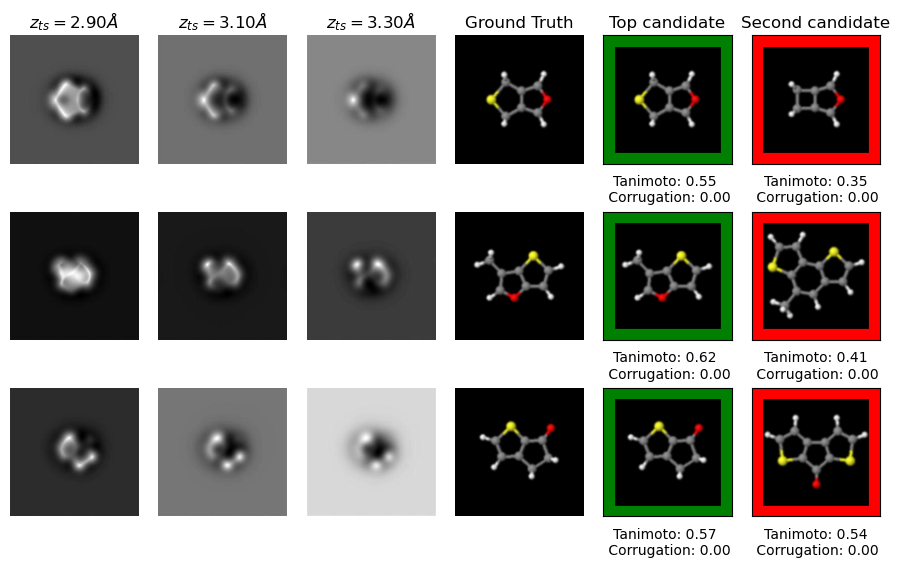

In [20]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
molec_paths = ['/scratch/dataset/quam/K-6/Conformer3D_CID_85665969_K040_Amp140', 
        '/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060', 
        '/scratch/dataset/quam/K-24/Conformer3D_CID_315614_K100_Amp140']

titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = molec_paths[i]
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=0.5, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('pentagons_identification_second_candidates.png')
plt.show()

/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060
Total number of fingerprints 25
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 58899415 tanimoto: 0.6206896551724138
second candidate: 54439774 tanimoto: 0.4117647058823529
########################
27202      58899415
26455      54439774
532712    129149092
141855     12858639
6952        6428541
Name: CID, dtype: int64
########################
58899415 58899415 54439774
/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060
Total number of fingerprints 18
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 636081 tanimoto: 0.7368421052631579
second candidate: 85721330 tanimoto: 0.6956521739130435
########################
37905        636081
231892     85721330
61524     124003402
194185     13766977
174000     11995190
Name: CID, dtype: int64
########################
636081 636081 85721330
/scratch

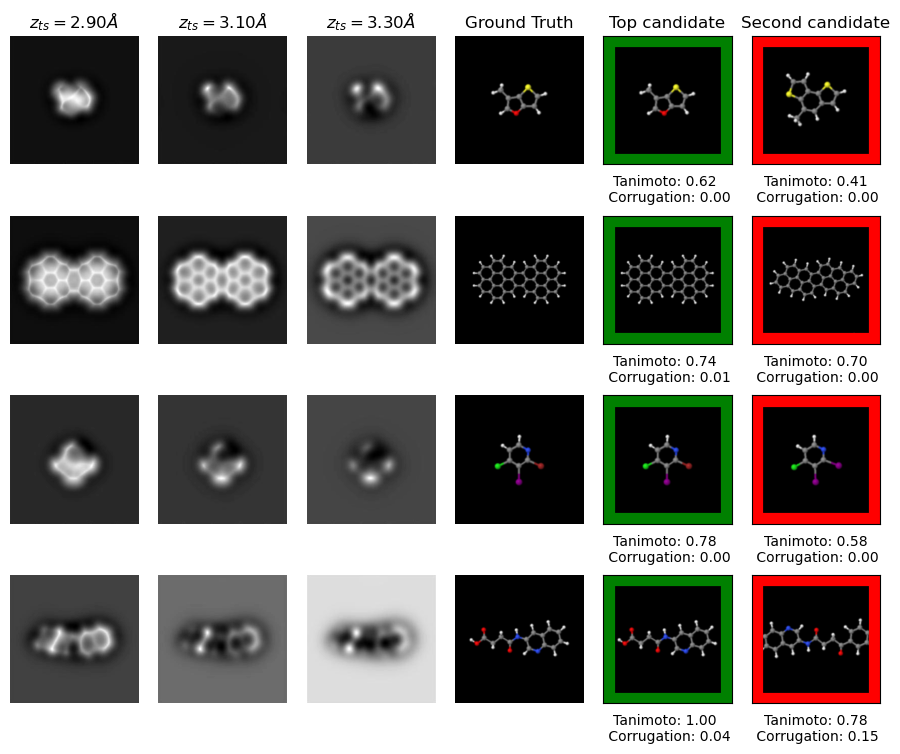

In [24]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=4
molec_paths = ['/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060', 
        '/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060', 
        '/scratch/dataset/quam/K-24/Conformer3D_CID_59332995_K100_Amp140',
        '/scratch/dataset/quam/K-18/Conformer3D_CID_861757_K080_Amp140']
zoom_list = [0.8, 1.2, 0.8, 0.9]


titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = molec_paths[i]
    print(molec_path)
    zoom = zoom_list[i]
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=zoom, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('identification_4_cases_second_candidates.png')
plt.show()

### Bad predictions v2

Change the last molecule for one highly corrugated

In [3]:
def run_prediction_extra(molec_path, dimension=[224,224], zoom=1, verbose=False):
    img_stack = load_img_stack(molec_path)
    true_CID = _extract_cid(molec_path)

    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)


    first_CID = _extract_cid(output_df.iloc[0]['path'])
    second_CID = _extract_cid(output_df.iloc[1]['path'])
    tanimoto_first = output_df.iloc[0]['tanimoto']
    tanimoto_second = output_df.iloc[1]['tanimoto']
    
    gt_jmol = load_jmol_image(true_CID, dimension=dimension, zoom=zoom)
    first_jmol = load_jmol_image(first_CID, dimension=dimension, zoom=zoom)
    second_jmol = load_jmol_image(second_CID, dimension=dimension, zoom=zoom)

    
    if verbose:
        print('Total number of fingerprints', np.sum(fp_pred))
        print('Is the correct CID in the top k candidates?',  true_CID in list(output_df['CID']))
        print('Is the correct CID the first candidate?',  true_CID == output_df['CID'].iloc[0])
        print(f'top candidate: {first_CID} tanimoto: {tanimoto_first}')
        print(f'second candidate: {second_CID} tanimoto: {tanimoto_second}')
        print('########################')
        print(output_df.iloc[:5]['CID'])
        print('########################')
        
    
    return img_stack[1], img_stack[3], img_stack[5], gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second


In [9]:
test_df.sort_values('corrugation',ascending=False)

,path,CID,SMILES,morgan_fp,split,corrugation,C,Br,Cl,F,I,N,O,P,S,H
306192,/scratch/dataset/quam/K-13/Conformer3D_CID_538...,53842689,C1=CC=C(C(=C1)C(=O)OC2=NC=C(C=C2)C#N)Cl,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,1.8300,13.0,0.0,1.0,0.0,0.0,2.0,2.0,0.0,0.0,7.0
277184,/scratch/dataset/quam/K-12/Conformer3D_CID_130...,130805219,C1=CC2=C(C=C1F)SC(=C2C(F)F)N,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,1.8300,9.0,0.0,0.0,3.0,0.0,1.0,0.0,0.0,1.0,6.0
401014,/scratch/dataset/quam/K-17/Conformer3D_CID_130...,130104505,C1=C(C(=C(C(=N1)N)C(F)F)I)O,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,1.8299,6.0,0.0,0.0,2.0,1.0,2.0,1.0,0.0,0.0,5.0
275558,/scratch/dataset/quam/K-12/Conformer3D_CID_119...,119005137,C1=C(C(=C(C(=N1)N)C(F)F)I)Cl,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,1.8299,6.0,0.0,1.0,2.0,1.0,2.0,0.0,0.0,0.0,4.0
394844,/scratch/dataset/quam/K-17/Conformer3D_CID_118...,118833807,C1=C(N=C(C(=C1N)C(F)F)I)C=O,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,1.8298,7.0,0.0,0.0,2.0,1.0,2.0,1.0,0.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513565,/scratch/dataset/quam/K-22/Conformer3D_CID_539...,53933283,C1CC(=O)C1=N,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0000,4.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,5.0
84045,/scratch/dataset/quam/K-4/Conformer3D_CID_1051...,105108266,CC1=C(SC=N1)C(=O)C#C,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0000,7.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,5.0
59187,/scratch/dataset/quam/K-3/Conformer3D_CID_6432...,6432174,C[13CH2]C,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0000,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0
123866,/scratch/dataset/quam/K-6/Conformer3D_CID_1298...,129873268,C(=O)NON,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.0000,1.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,4.0


In [12]:
path_list = list(test_df.sort_values('corrugation',ascending=False).iloc[:5]['path'])
for path in path_list: print(path)

/scratch/dataset/quam/K-13/Conformer3D_CID_53842689_K080_Amp040
/scratch/dataset/quam/K-12/Conformer3D_CID_130805219_K060_Amp140
/scratch/dataset/quam/K-17/Conformer3D_CID_130104505_K080_Amp120
/scratch/dataset/quam/K-12/Conformer3D_CID_119005137_K060_Amp140
/scratch/dataset/quam/K-17/Conformer3D_CID_118833807_K080_Amp120


/scratch/dataset/quam/K-13/Conformer3D_CID_137250137_K080_Amp040
Total number of fingerprints 7
Is the correct CID in the top k candidates? False
Is the correct CID the first candidate? False
top candidate: 395542 tanimoto: 0.29411764705882354
second candidate: 66332 tanimoto: 0.29411764705882354
########################
207278      395542
577471       66332
197820    21976301
104855    22068766
237453    11790828
Name: CID, dtype: int64
########################
137250137 395542 66332
/scratch/dataset/quam/K-12/Conformer3D_CID_86114644_K060_Amp140
Total number of fingerprints 28
Is the correct CID in the top k candidates? False
Is the correct CID the first candidate? False
top candidate: 49842552 tanimoto: 0.38235294117647056
second candidate: 123287167 tanimoto: 0.36363636363636365
########################
40465      49842552
1039      123287167
86030        156602
110673     14980109
204771       319101
Name: CID, dtype: int64
########################
86114644 49842552 123287167
/scr

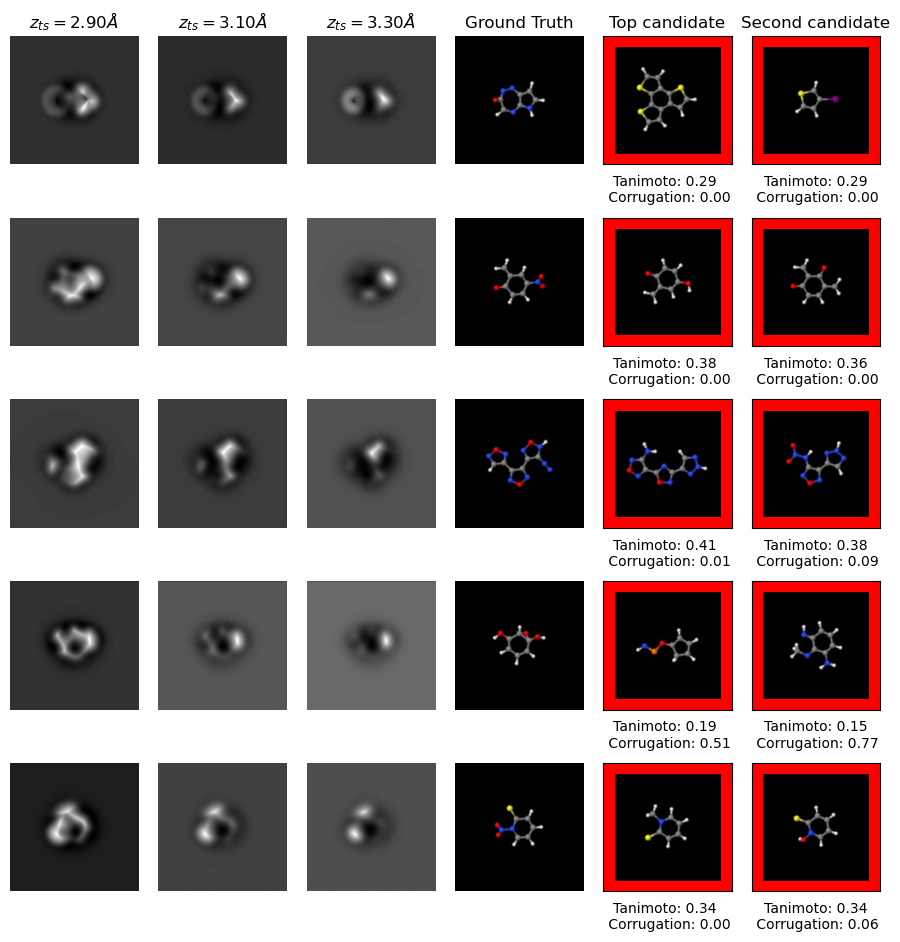

In [16]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.

titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs

molec_path_array= ['/scratch/dataset/quam/K-13/Conformer3D_CID_137250137_K080_Amp040',
                   '/scratch/dataset/quam/K-12/Conformer3D_CID_86114644_K060_Amp140',
                   '/scratch/dataset/quam/K-17/Conformer3D_CID_129816930_K080_Amp120',
                   '/scratch/dataset/quam/K-12/Conformer3D_CID_129866873_K060_Amp140',
                   '/scratch/dataset/quam/K-17/Conformer3D_CID_22382873_K080_Amp120']

n_results=len(molec_path_array)


for i in range(n_results):
    molec_path = molec_path_array[i]
    if i==0:
        zoom=0.9
    else:
        zoom=0.8    
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=0.8, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
#plt.savefig('vs_good_pred.png')
plt.show()


/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060
Total number of fingerprints 40
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? False
top candidate: 135178929 tanimoto: 0.9512195121951219
second candidate: 135178930 tanimoto: 0.9512195121951219
########################
18065     135178929
18066     135178930
209791       473475
209720       470402
185889    135167504
Name: CID, dtype: int64
########################
135178930 135178929 135178930
/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040
Total number of fingerprints 11
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? False
top candidate: 5460712 tanimoto: 1.0
second candidate: 123044 tanimoto: 1.0
########################
78524     5460712
300        123044
146499       7080
20518     6857587
188423     136034
Name: CID, dtype: int64
########################
123044 5460712 123044
/scratch/dataset/quam/K-12/Conformer3D_CID_1

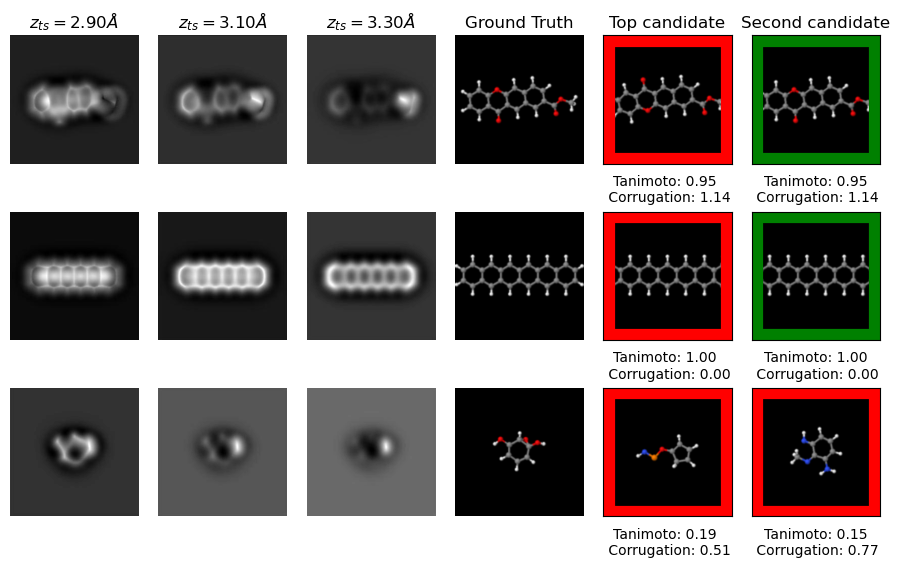

In [18]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs

molec_path_array=[ '/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060',
                  '/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040', 
                  '/scratch/dataset/quam/K-12/Conformer3D_CID_129866873_K060_Amp140'
                 ]
for i in range(n_results):
    molec_path = molec_path_array[i]
    if i==0:
        zoom=0.9
    else:
        zoom=0.8    
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=0.8, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('vs_bad_pred_high_corrugation.png')
plt.show()


#### Bad predictions 4 example

In [11]:
def run_prediction_extra(molec_path, dimension=[224,224], zoom=1, verbose=False):
    img_stack = load_img_stack(molec_path)
    true_CID = _extract_cid(molec_path)

    fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)

    output_df = fp_screening_function(fp_pred, test_df, top_k = 5, int_type=np.int8)


    first_CID = _extract_cid(output_df.iloc[0]['path'])
    second_CID = _extract_cid(output_df.iloc[1]['path'])
    tanimoto_first = output_df.iloc[0]['tanimoto']
    tanimoto_second = output_df.iloc[1]['tanimoto']
    
    gt_jmol = load_jmol_image(true_CID, dimension=dimension, zoom=zoom)
    first_jmol = load_jmol_image(first_CID, dimension=dimension, zoom=zoom)
    second_jmol = load_jmol_image(second_CID, dimension=dimension, zoom=zoom)

    
    if verbose:
        print('Total number of fingerprints', np.sum(fp_pred))
        print('Is the correct CID in the top k candidates?',  true_CID in list(output_df['CID']))
        print('Is the correct CID the first candidate?',  true_CID == output_df['CID'].iloc[0])
        print(f'top candidate: {first_CID} tanimoto: {tanimoto_first}')
        print(f'second candidate: {second_CID} tanimoto: {tanimoto_second}')
        print('########################')
        print(output_df.iloc[:5]['CID'])
        print('########################')
        
    
    return img_stack[1], img_stack[3], img_stack[5], gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second


/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060
Total number of fingerprints 40
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? False
top candidate: 135178929 tanimoto: 0.9512195121951219
second candidate: 135178930 tanimoto: 0.9512195121951219
########################
18065     135178929
18066     135178930
209791       473475
209720       470402
185889    135167504
Name: CID, dtype: int64
########################
135178930 135178929 135178930
/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040
Total number of fingerprints 11
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? False
top candidate: 5460712 tanimoto: 1.0
second candidate: 123044 tanimoto: 1.0
########################
78524     5460712
300        123044
146499       7080
20518     6857587
188423     136034
Name: CID, dtype: int64
########################
123044 5460712 123044
/scratch/dataset/quam/K-12/Conformer3D_CID_1

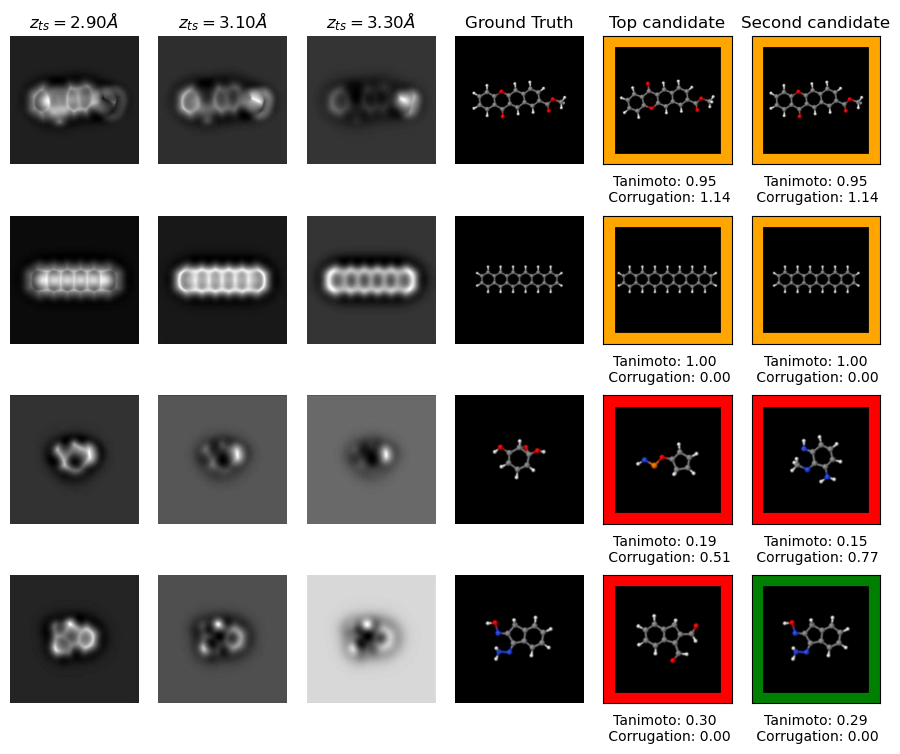

In [18]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=4
titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs

molec_path_array=[ '/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060',
                  '/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040', 
                  '/scratch/dataset/quam/K-12/Conformer3D_CID_129866873_K060_Amp140',
                  '/scratch/dataset/quam/K-24/Conformer3D_CID_137221883_K100_Amp140'
                 ]
for i in range(n_results):
    molec_path = molec_path_array[i]
    if i==0:
        zoom=1
    elif i==1:
        zoom = 1.2
    else:
        zoom=0.8    
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=zoom, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    
    if tanimoto_first == tanimoto_second:
        color = 'orange'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('vs_bad_pred_4_cases.png')
plt.show()


### New figure of chemical species

/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060
Total number of fingerprints 25
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 58899415 tanimoto: 0.6206896551724138
second candidate: 54439774 tanimoto: 0.4117647058823529
########################
27202      58899415
26455      54439774
532712    129149092
141855     12858639
6952        6428541
Name: CID, dtype: int64
########################
58899415 58899415 54439774
/scratch/dataset/quam/K-24/Conformer3D_CID_59332995_K100_Amp140
Total number of fingerprints 20
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 59332995 tanimoto: 0.782608695652174
second candidate: 131010917 tanimoto: 0.5833333333333334
########################
577689     59332995
511749    131010917
575744    131055902
337356     60145703
258287    119012787
Name: CID, dtype: int64
########################
59332995 59332995 131010917

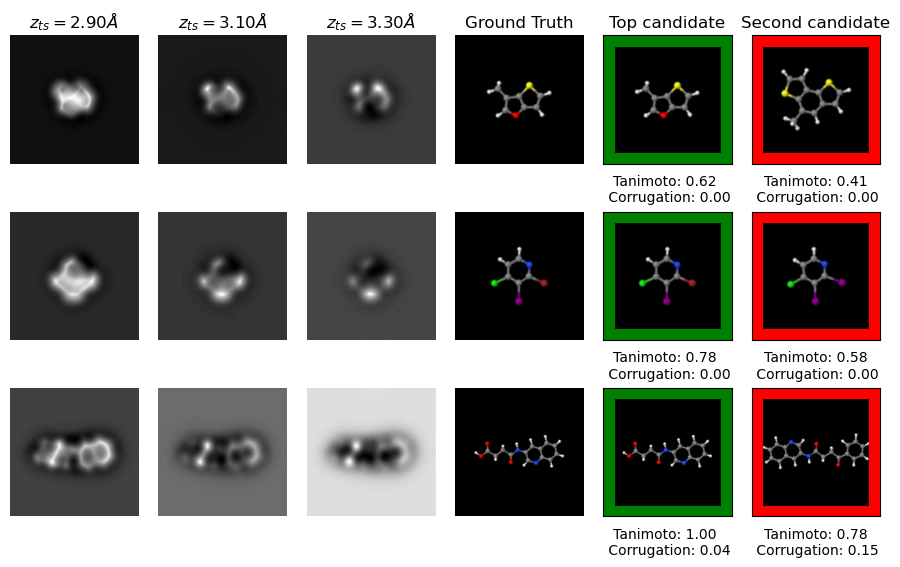

In [23]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
molec_paths = ['/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060',  
        '/scratch/dataset/quam/K-24/Conformer3D_CID_59332995_K100_Amp140',
        '/scratch/dataset/quam/K-18/Conformer3D_CID_861757_K080_Amp140']
zoom_list = [0.7, 0.7, 1]


titles = ['$z_{ts}=2.90 \AA$', '$z_{ts}=3.10 \AA$', '$z_{ts}=3.30 \AA$', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.9))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = molec_paths[i]
    print(molec_path)
    zoom = zoom_list[i]
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=zoom, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'Tanimoto: {tanimoto_first:.2f} \n Corrugation: {corrugation_first:.2f}', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'Tanimoto: {tanimoto_second:.2f}\n Corrugation: {corrugation_second:.2f}', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('identification_3_cases_second_candidates.png')
plt.show()

/scratch/dataset/quam/K-6/Conformer3D_CID_143932_K040_Amp140
Total number of fingerprints 19
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 143932 tanimoto: 0.8947368421052632
second candidate: 6857588 tanimoto: 0.75
########################
6438        143932
219765     6857588
215021    59787234
233418        9167
78523      5460711
Name: CID, dtype: int64
########################
143932 143932 6857588
/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060
Total number of fingerprints 18
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 636081 tanimoto: 0.7368421052631579
second candidate: 85721330 tanimoto: 0.6956521739130435
########################
37905        636081
231892     85721330
61524     124003402
194185     13766977
174000     11995190
Name: CID, dtype: int64
########################
636081 636081 85721330
/scratch/dataset/quam/K-24/Conformer3D

/tmp/ipykernel_91598/1401504788.py:67: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('pah_identification_second_candidates_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
/tmp/ipykernel_91598/1401504788.py:67: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('pah_identification_second_candidates_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)


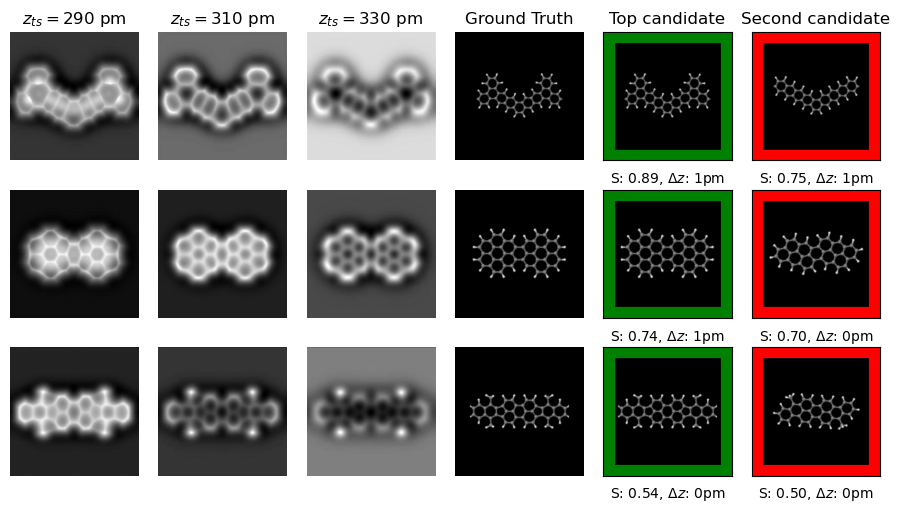

In [16]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
molec_paths = [
        '/scratch/dataset/quam/K-6/Conformer3D_CID_143932_K040_Amp140',
        '/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060',
        '/scratch/dataset/quam/K-24/Conformer3D_CID_59721948_K100_Amp140']

titles = ['$z_{ts}=290$ pm', '$z_{ts}=310$ pm', '$z_{ts}=330$ pm', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.7))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = molec_paths[i]
    print(molec_path)
    if i ==0:
        img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=1.5, verbose=True)
    elif i ==2:
        img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=1.3, verbose=True)
    else:
        img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=1.2, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'S: {tanimoto_first:.2f}, $\Delta z$: {int(corrugation_first*100)}pm', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'S: {tanimoto_second:.2f}, $\Delta z$: {int(corrugation_second*100)}pm', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('pah_identification_second_candidates_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
plt.show()

/scratch/dataset/quam/K-1/Conformer3D_CID_2748722_K040_Amp040
Total number of fingerprints 15
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 2748722 tanimoto: 0.8125
second candidate: 21856870 tanimoto: 0.6363636363636364
########################
1131       2748722
31895     21856870
116823      270010
231737      852658
78873     54058316
Name: CID, dtype: int64
########################
2748722 2748722 21856870
/scratch/dataset/quam/K-4/Conformer3D_CID_63616469_K040_Amp100
Total number of fingerprints 39
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 63616469 tanimoto: 0.9743589743589743
second candidate: 63616316 tanimoto: 0.6170212765957447
########################
83816     63616469
83814     63616316
217800    64446716
83830     63615331
454478    64395594
Name: CID, dtype: int64
########################
63616469 63616469 63616316
/scratch/dataset/quam/K-7/Co

/tmp/ipykernel_91598/1969367477.py:57: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('vs_good_pred_second_candidates_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
/tmp/ipykernel_91598/1969367477.py:57: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('vs_good_pred_second_candidates_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)


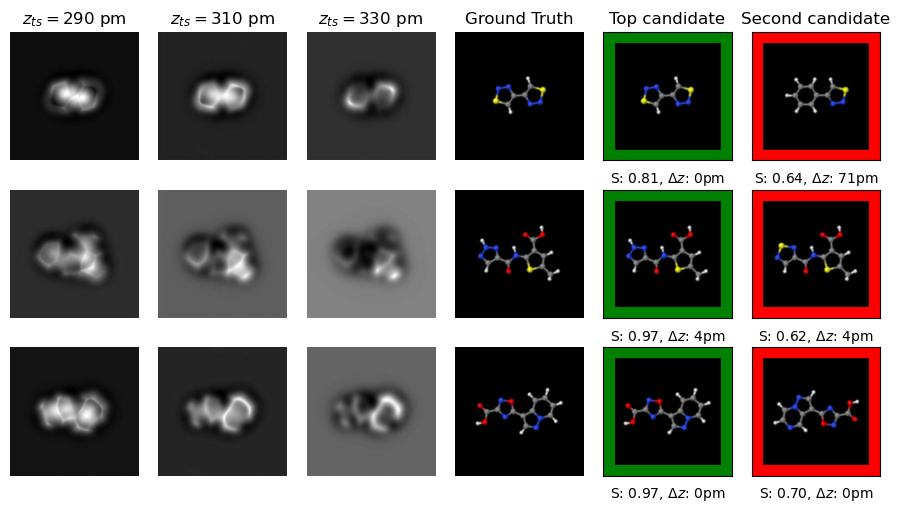

In [18]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
titles = ['$z_{ts}=290$ pm', '$z_{ts}=310$ pm', '$z_{ts}=330$ pm', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.7))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = test_df.iloc[MOLECULE_INDEX]['path']
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=0.8, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'S: {tanimoto_first:.2f}, $\Delta z$: {int(corrugation_first*100)}pm', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'S: {tanimoto_second:.2f}, $\Delta z$: {int(corrugation_second*100)}pm', fontsize=10)  # Adjust fontsize according to your needs
    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('vs_good_pred_second_candidates_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
plt.show()


/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060
Total number of fingerprints 25
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 58899415 tanimoto: 0.6206896551724138
second candidate: 54439774 tanimoto: 0.4117647058823529
########################
27202      58899415
26455      54439774
532712    129149092
141855     12858639
6952        6428541
Name: CID, dtype: int64
########################
58899415 58899415 54439774
/scratch/dataset/quam/K-24/Conformer3D_CID_59332995_K100_Amp140
Total number of fingerprints 20
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 59332995 tanimoto: 0.782608695652174
second candidate: 131010917 tanimoto: 0.5833333333333334
########################
577689     59332995
511749    131010917
575744    131055902
337356     60145703
258287    119012787
Name: CID, dtype: int64
########################
59332995 59332995 131010917

/tmp/ipykernel_91598/1121913219.py:64: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('identification_3_cases_second_candidates_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
/tmp/ipykernel_91598/1121913219.py:64: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('identification_3_cases_second_candidates_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)


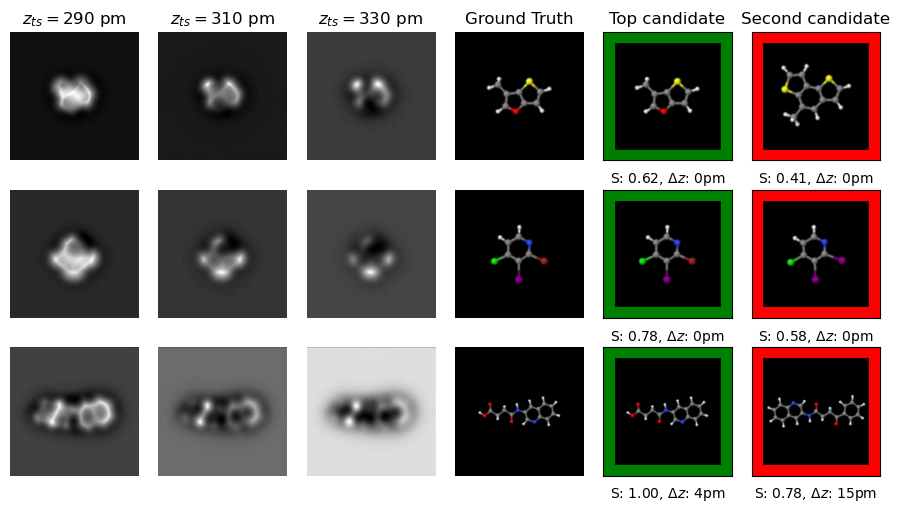

In [21]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=3
molec_paths = ['/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060',  
        '/scratch/dataset/quam/K-24/Conformer3D_CID_59332995_K100_Amp140',
        '/scratch/dataset/quam/K-18/Conformer3D_CID_861757_K080_Amp140']
zoom_list = [0.7, 0.7, 1.1]


titles = ['$z_{ts}=290$ pm', '$z_{ts}=310$ pm', '$z_{ts}=330$ pm', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.7))  # Adjust figsize according to your needs
for i in range(n_results):
    MOLECULE_INDEX = i*40000 + 500
    molec_path = molec_paths[i]
    print(molec_path)
    zoom = zoom_list[i]
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=zoom, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'S: {tanimoto_first:.2f}, $\Delta z$: {int(corrugation_first*100)}pm', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'S: {tanimoto_second:.2f}, $\Delta z$: {int(corrugation_second*100)}pm', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('identification_3_cases_second_candidates_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
plt.show()

/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060
Total number of fingerprints 40
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? False
top candidate: 135178929 tanimoto: 0.9512195121951219
second candidate: 135178930 tanimoto: 0.9512195121951219
########################
18065     135178929
18066     135178930
209791       473475
209720       470402
185889    135167504
Name: CID, dtype: int64
########################
135178930 135178929 135178930
/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040
Total number of fingerprints 11
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? False
top candidate: 5460712 tanimoto: 1.0
second candidate: 123044 tanimoto: 1.0
########################
78524     5460712
300        123044
146499       7080
20518     6857587
188423     136034
Name: CID, dtype: int64
########################
123044 5460712 123044
/scratch/dataset/quam/K-12/Conformer3D_CID_1

/tmp/ipykernel_91598/673882622.py:74: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('vs_bad_pred_4_cases_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
/tmp/ipykernel_91598/673882622.py:74: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('vs_bad_pred_4_cases_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)


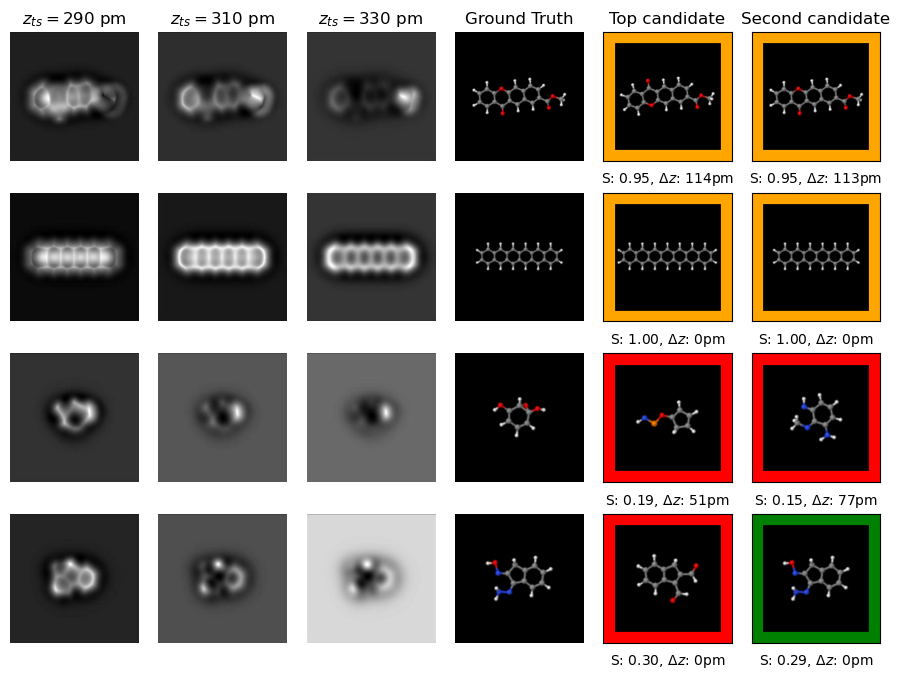

In [23]:
# Final figure: Mirar la corrugación de la molécula y ver el segundo candidato.
n_results=4
titles = ['$z_{ts}=290$ pm', '$z_{ts}=310$ pm', '$z_{ts}=330$ pm', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.7))  # Adjust figsize according to your needs

molec_path_array=[ '/scratch/dataset/quam/K-2/Conformer3D_CID_135178930_K040_Amp060',
                  '/scratch/dataset/quam/K-7/Conformer3D_CID_123044_K060_Amp040', 
                  '/scratch/dataset/quam/K-12/Conformer3D_CID_129866873_K060_Amp140',
                  '/scratch/dataset/quam/K-24/Conformer3D_CID_137221883_K100_Amp140'
                 ]
for i in range(n_results):
    molec_path = molec_path_array[i]
    if i==0:
        zoom=1
    elif i==1:
        zoom = 1.2
    else:
        zoom=0.8    
    
    print(molec_path)
    
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=zoom, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    
    if tanimoto_first == tanimoto_second:
        color = 'orange'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'S: {tanimoto_first:.2f}, $\Delta z$: {int(corrugation_first*100)}pm', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'S: {tanimoto_second:.2f}, $\Delta z$: {int(corrugation_second*100)}pm', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('vs_bad_pred_4_cases_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
plt.show()


/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060
Total number of fingerprints 18
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 636081 tanimoto: 0.7368421052631579
second candidate: 85721330 tanimoto: 0.6956521739130435
########################
37905        636081
231892     85721330
61524     124003402
194185     13766977
174000     11995190
Name: CID, dtype: int64
########################
636081 636081 85721330
/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060
Total number of fingerprints 25
Is the correct CID in the top k candidates? True
Is the correct CID the first candidate? True
top candidate: 58899415 tanimoto: 0.6206896551724138
second candidate: 54439774 tanimoto: 0.4117647058823529
########################
27202      58899415
26455      54439774
532712    129149092
141855     12858639
6952        6428541
Name: CID, dtype: int64
########################
58899415 58899415 54439774
/scratch

/tmp/ipykernel_91598/2912753774.py:66: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('identification_4_cases_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
/tmp/ipykernel_91598/2912753774.py:66: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('identification_4_cases_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)


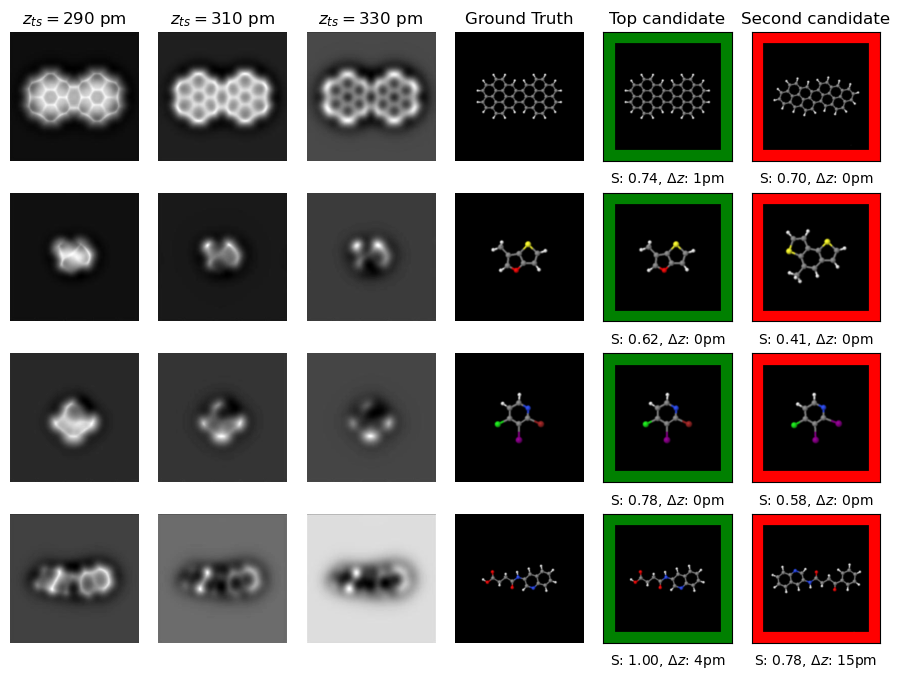

In [24]:
# Final figure:
condition = (dataset_df['C'] > 40) & (dataset_df['H'] > 10) & (dataset_df[['Br', 'Cl', 'F', 'I', 'N', 'O', 'P', 'S']].sum(axis=1) == 0)
selected_rows = dataset_df[condition]
zoom_list = [1.3, 0.8, 0.8, 1.2]
n_results=4
paths = ['/scratch/dataset/quam/K-14/Conformer3D_CID_636081_K080_Amp060', 
         '/scratch/dataset/quam/K-14/Conformer3D_CID_58899415_K080_Amp060', 
        '/scratch/dataset/quam/K-24/Conformer3D_CID_59332995_K100_Amp140',
        '/scratch/dataset/quam/K-18/Conformer3D_CID_861757_K080_Amp140']
#paths = list(selected_rows.iloc[2:n_results+2]['path'])

titles = ['$z_{ts}=290$ pm', '$z_{ts}=310$ pm', '$z_{ts}=330$ pm', 'Ground Truth', 'Top candidate', 'Second candidate']
fig, ax = plt.subplots(n_results, 6, figsize=(9, n_results*1.7))  # Adjust figsize according to your needs
for i, molec_path in enumerate(paths):
    
    print(molec_path)
    zoom = zoom_list[i]
    img_1, img_3, img_5, gt_jmol, first_jmol, second_jmol, true_CID, first_CID, second_CID, tanimoto_first, tanimoto_second = run_prediction_extra(molec_path, dimension=[224,224], zoom=zoom, verbose=True)
    print(true_CID, first_CID, second_CID)
    corrugation_first = test_df[test_df['CID']==first_CID]['corrugation'].values[0]
    corrugation_second = test_df[test_df['CID']==second_CID]['corrugation'].values[0]
    ax[i,0].imshow(img_1, cmap='gray')
    ax[i,0].axis('off')
    ax[i,1].imshow(img_3, cmap='gray')
    ax[i,1].axis('off')
    ax[i,2].imshow(img_5, cmap='gray')
    ax[i,2].axis('off')
    ax[i,3].imshow(gt_jmol)
    ax[i,3].axis('off')
    ax[i,4].imshow(first_jmol)
    ax[i,5].imshow(second_jmol)


    if true_CID == first_CID:
        color = 'green'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
   
    if true_CID == second_CID:
        color = 'green'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')
    else:
        color = 'red'
        rect_2 = patches.Rectangle((0, 0), first_jmol.shape[1], first_jmol.shape[0], linewidth=16, edgecolor=color, facecolor='none')     
    

    ax[i,4].add_patch(rect)
    ax[i,5].add_patch(rect_2)
    ax[i,4].set_xticks([])
    ax[i,4].set_yticks([])
    ax[i,5].set_xticks([])
    ax[i,5].set_yticks([])
    ax[i,4].set_xlabel(f'S: {tanimoto_first:.2f}, $\Delta z$: {int(corrugation_first*100)}pm', fontsize=10)  # Adjust fontsize according to your needs
    ax[i,5].set_xlabel(f'S: {tanimoto_second:.2f}, $\Delta z$: {int(corrugation_second*100)}pm', fontsize=10)  # Adjust fontsize according to your needs

    # Setting titles for each column
    if i == 0:
        for j in range(len(titles)):
            ax[i,j].set_title(titles[j])

#######################################

plt.tight_layout()
plt.savefig('identification_4_cases_v2.pdf', dpi=500, format='pdf', quality=120, optimize=True)
plt.show()